<a href="https://colab.research.google.com/github/cryptasim/MACHINE-LEARNING-LAB/blob/main/ASSIGNMENT%202/Assignment2.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

<a href="https://colab.research.google.com/github/cryptasim/MACHINE-LEARNING-LAB/blob/main/ASSIGNMENT%201/Assignment2.ipynb" target="_parent">
  <img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/>
</a>


# Libraries

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

In [ ]:
!pip install ucimlrepo

# Wine Dataset

## Prepare Dataset

In [ ]:
from ucimlrepo import fetch_ucirepo

wine = fetch_ucirepo(id=109)

In [ ]:
X = wine.data.features
y = wine.data.targets

In [ ]:
X

,Alcohol,Malicacid,Ash,Alcalinity_of_ash,Magnesium,Total_phenols,Flavanoids,Nonflavanoid_phenols,Proanthocyanins,Color_intensity,Hue,0D280_0D315_of_diluted_wines,Proline
0,14.23,1.71,2.43,15.6,127,2.80,3.06,0.28,2.29,5.64,1.04,3.92,1065
1,13.20,1.78,2.14,11.2,100,2.65,2.76,0.26,1.28,4.38,1.05,3.40,1050
2,13.16,2.36,2.67,18.6,101,2.80,3.24,0.30,2.81,5.68,1.03,3.17,1185
3,14.37,1.95,2.50,16.8,113,3.85,3.49,0.24,2.18,7.80,0.86,3.45,1480
4,13.24,2.59,2.87,21.0,118,2.80,2.69,0.39,1.82,4.32,1.04,2.93,735
...,...,...,...,...,...,...,...,...,...,...,...,...,...
173,13.71,5.65,2.45,20.5,95,1.68,0.61,0.52,1.06,7.70,0.64,1.74,740
174,13.40,3.91,2.48,23.0,102,1.80,0.75,0.43,1.41,7.30,0.70,1.56,750
175,13.27,4.28,2.26,20.0,120,1.59,0.69,0.43,1.35,10.20,0.59,1.56,835
176,13.17,2.59,2.37,20.0,120,1.65,0.68,0.53,1.46,9.30,0.60,1.62,840


In [ ]:
y

,class
0,1
1,1
2,1
3,1
4,1
...,...
173,3
174,3
175,3
176,3


## Principal Component Analysis (PCA)

Explained variance ratio by each component: [0.36198848 0.1920749  0.11123631 0.0706903  0.06563294 0.04935823
 0.04238679 0.02680749 0.02222153 0.01930019 0.01736836 0.01298233
 0.00795215]
Cumulative explained variance: [0.36198848 0.55406338 0.66529969 0.73598999 0.80162293 0.85098116
 0.89336795 0.92017544 0.94239698 0.96169717 0.97906553 0.99204785
 1.        ]


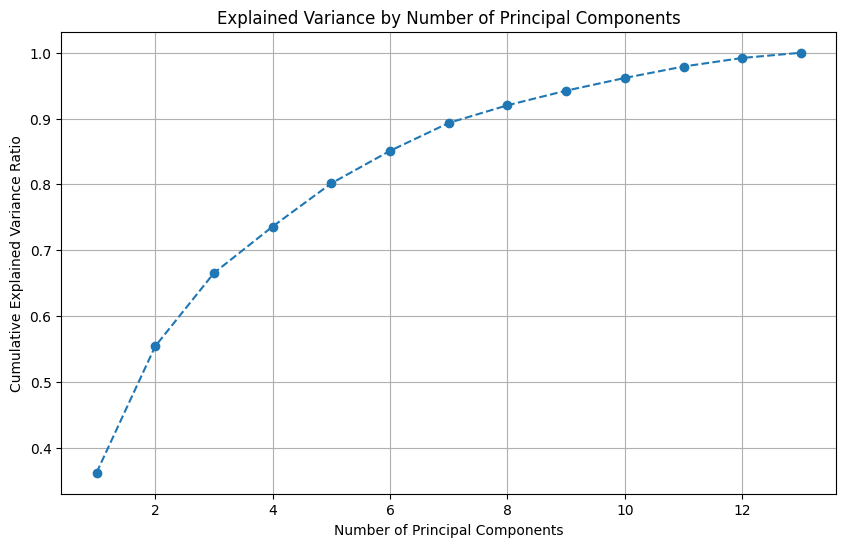

In [ ]:
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA

# Standardize the data before applying PCA
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

# Apply PCA
pca = PCA()
X_pca = pca.fit_transform(X_scaled)

# Explained variance ratio
explained_variance_ratio = pca.explained_variance_ratio_
print("Explained variance ratio by each component:", explained_variance_ratio)

# Cumulative explained variance
cumulative_explained_variance = np.cumsum(explained_variance_ratio)
print("Cumulative explained variance:", cumulative_explained_variance)

# Plot explained variance
plt.figure(figsize=(10, 6))
plt.plot(range(1, len(explained_variance_ratio) + 1), cumulative_explained_variance, marker='o', linestyle='--')
plt.title('Explained Variance by Number of Principal Components')
plt.xlabel('Number of Principal Components')
plt.ylabel('Cumulative Explained Variance Ratio')
plt.grid(True)
plt.show()

Based on the cumulative explained variance plot, you can decide how many principal components to retain to capture a desired amount of variance. For example, to retain 95% of the variance, you would choose the number of components where the cumulative explained variance is close to 0.95.

Let's apply PCA with a chosen number of components (e.g., based on the plot).

In [ ]:
# Choose the number of components (e.g., to retain 95% variance)
# Based on the plot, let's assume we choose 10 components to retain most of the variance
n_components = 10 # You can change this based on your analysis of the plot

pca = PCA(n_components=n_components)
X_pca_reduced = pca.fit_transform(X_scaled)

print(f"\nOriginal number of features: {X.shape[1]}")
print(f"Reduced number of features after PCA: {X_pca_reduced.shape[1]}")
print("\nData after PCA:")
display(pd.DataFrame(X_pca_reduced).head())


Original number of features: 13
Reduced number of features after PCA: 10

Data after PCA:


,0,1,2,3,4,5,6,7,8,9
0,3.316751,1.443463,-0.165739,-0.215631,0.693043,0.223880,0.596427,-0.065139,-0.641443,1.020956
1,2.209465,-0.333393,-2.026457,-0.291358,-0.257655,0.927120,0.053776,-1.024416,0.308847,0.159701
2,2.516740,1.031151,0.982819,0.724902,-0.251033,-0.549276,0.424205,0.344216,1.177834,0.113361
3,3.757066,2.756372,-0.176192,0.567983,-0.311842,-0.114431,-0.383337,-0.643593,-0.052544,0.239413
4,1.008908,0.869831,2.026688,-0.409766,0.298458,0.406520,0.444074,-0.416700,-0.326819,-0.078366


## SVM

### Different SVM models

In [ ]:
from sklearn.svm import SVC
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix, precision_score, recall_score, f1_score
import matplotlib.pyplot as plt
import seaborn as sns


training_sizes = [0.5, 0.6, 0.7, 0.8]
kernels = {
    'linear': 'linear',
    'polynomial': 'poly',
    'gaussian': 'rbf',
    'sigmoid': 'sigmoid'
}

### Calculate values for different test size

In [ ]:
results = []
confusion_matrices = []
trained_models = [] # Add a list to store trained models

for kernel_name, kernel in kernels.items():
  for size in training_sizes:
   X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=size, random_state=42)
   svc = SVC(kernel=kernel, probability=True, random_state=42) # Add probability=True
   svc.fit(X_train, y_train.values.ravel())
   y_pred = svc.predict(X_test)

   acc = accuracy_score(y_test, y_pred)
   precision = precision_score(y_test, y_pred, average='weighted', zero_division=0) # Calculate weighted precision, handle zero division
   recall = recall_score(y_test, y_pred, average='weighted') # Calculate weighted recall
   f1 = f1_score(y_test, y_pred, average='weighted') # Calculate weighted F1-score


   cm = confusion_matrix(y_test, y_pred) # Calculate confusion matrix

   results.append({
       "Training size":int (size*100),
       "Accuracy":acc,
       "Precision": precision,
       "Recall": recall,
       "F1-score": f1,
       "Kernel":kernel_name
   })
   confusion_matrices.append({ # Store confusion matrix with metadata
       "Training size":int (size*100),
       "Kernel":kernel_name,
       "Confusion Matrix":cm
   })
   trained_models.append({ # Store the trained model with metadata
       "Training size":int (size*100),
       "Kernel":kernel_name,
       "Model": svc,
       "X_test": X_test,
       "y_test": y_test
   })

### Print Evalution Table and Graphs

,Training size,Accuracy,Precision,Recall,F1-score,Kernel
0,50,0.932584,0.933748,0.932584,0.932554,linear
1,60,0.934579,0.934670,0.934579,0.934515,linear
2,70,0.936000,0.936033,0.936000,0.935762,linear
3,80,0.860140,0.872143,0.860140,0.859931,linear
4,50,0.651685,0.651387,0.651685,0.640804,polynomial
5,60,0.644860,0.631917,0.644860,0.626031,polynomial
6,70,0.688000,0.676990,0.688000,0.671169,polynomial
7,80,0.671329,0.649877,0.671329,0.639471,polynomial
8,50,0.651685,0.667877,0.651685,0.657626,gaussian
9,60,0.663551,0.665705,0.663551,0.661062,gaussian


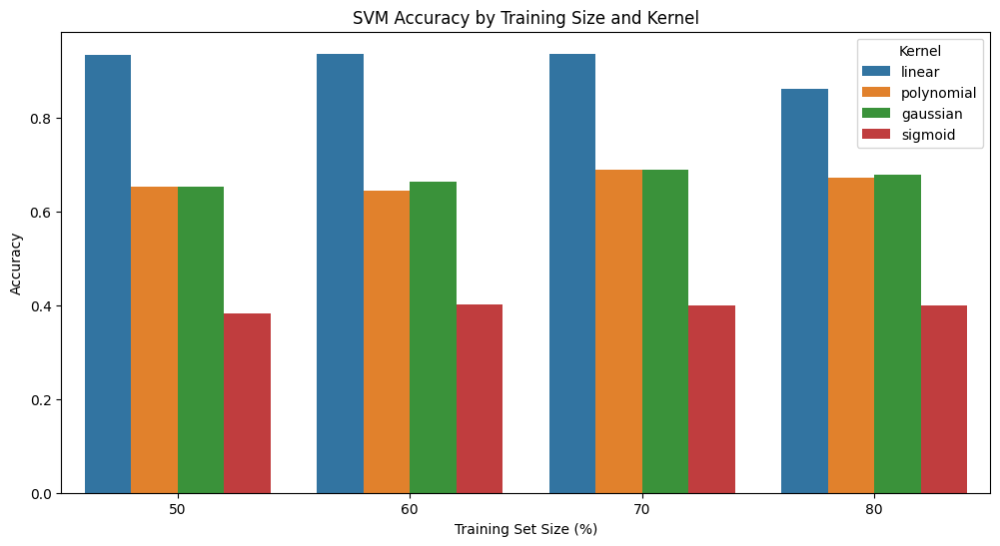

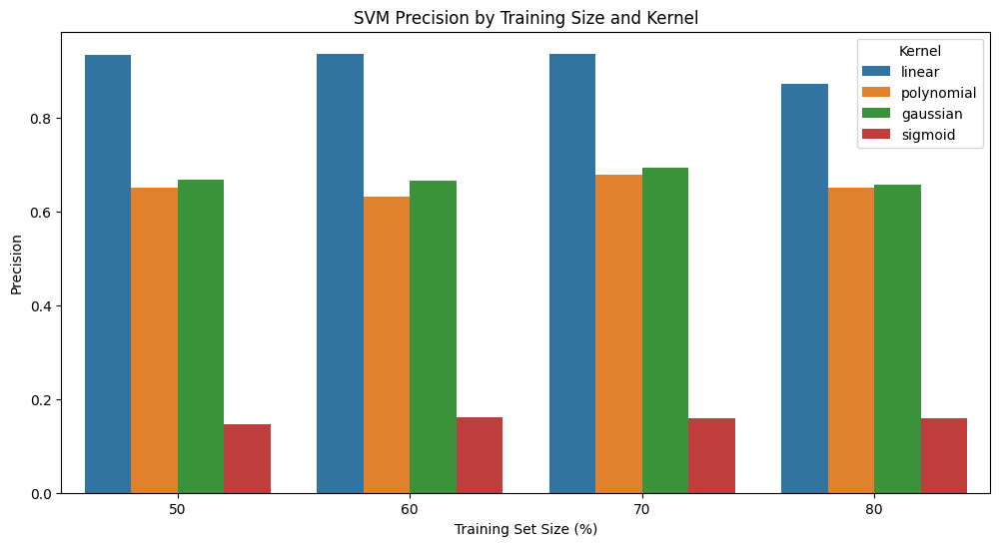

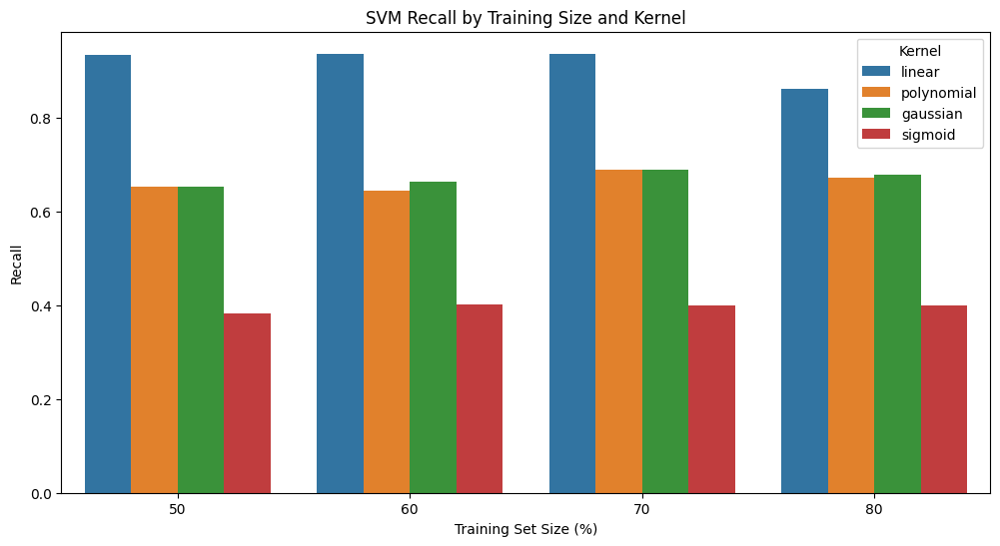

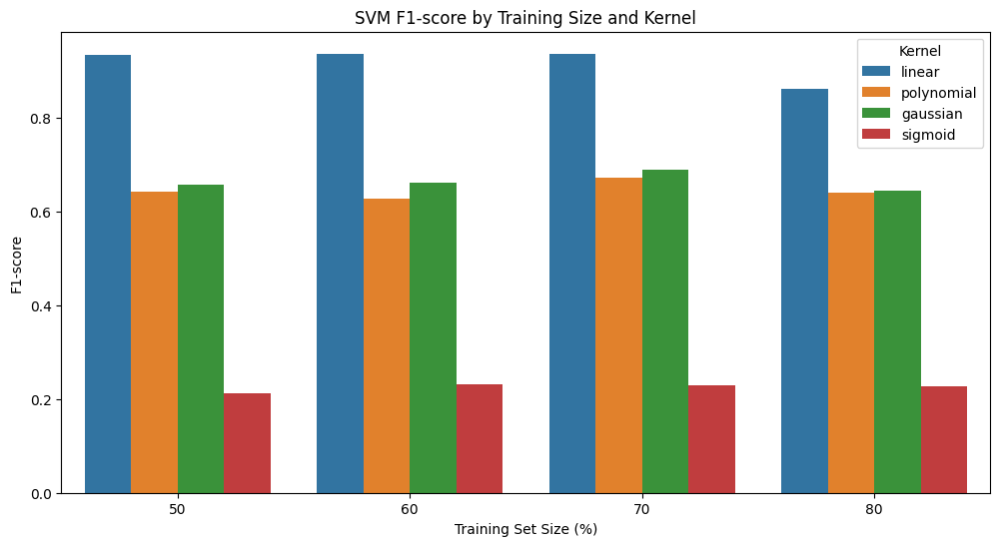

In [ ]:
df = pd.DataFrame(results)
display(df) # Display the DataFrame as a table

# Plot Accuracy
plt.figure(figsize=(12, 6)) # Increase figure size
sns.barplot(data=df, x='Training size', y='Accuracy', hue='Kernel')
plt.title('SVM Accuracy by Training Size and Kernel') # Add title
plt.xlabel('Training Set Size (%)') # Add x-axis label
plt.ylabel('Accuracy') # Add y-axis label
plt.show()

# Plot Precision
plt.figure(figsize=(12, 6)) # Increase figure size
sns.barplot(data=df, x='Training size', y='Precision', hue='Kernel')
plt.title('SVM Precision by Training Size and Kernel') # Add title
plt.xlabel('Training Set Size (%)') # Add x-axis label
plt.ylabel('Precision') # Add y-axis label
plt.show()

# Plot Recall
plt.figure(figsize=(12, 6)) # Increase figure size
sns.barplot(data=df, x='Training size', y='Recall', hue='Kernel')
plt.title('SVM Recall by Training Size and Kernel') # Add title
plt.xlabel('Training Set Size (%)') # Add x-axis label
plt.ylabel('Recall') # Add y-axis label
plt.show()

# Plot F1-score
plt.figure(figsize=(12, 6)) # Increase figure size
sns.barplot(data=df, x='Training size', y='F1-score', hue='Kernel')
plt.title('SVM F1-score by Training Size and Kernel') # Add title
plt.xlabel('Training Set Size (%)') # Add x-axis label
plt.ylabel('F1-score') # Add y-axis label
plt.show()

### Show Confusion Matrices

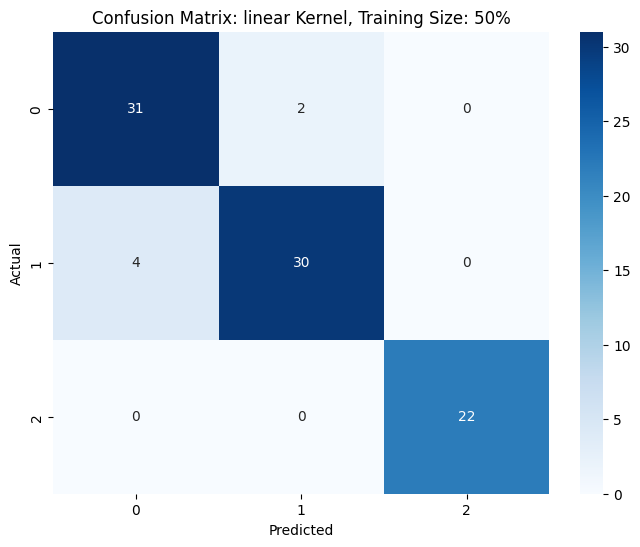

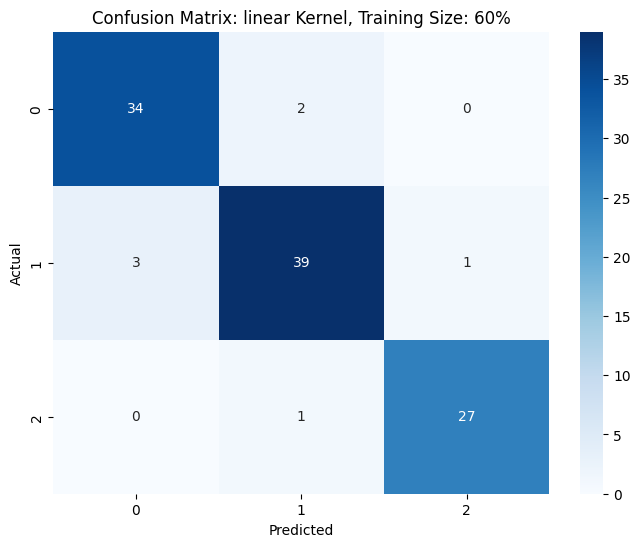

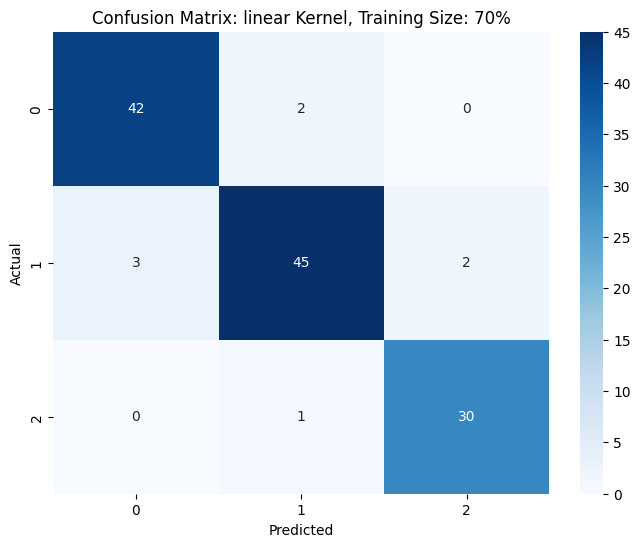

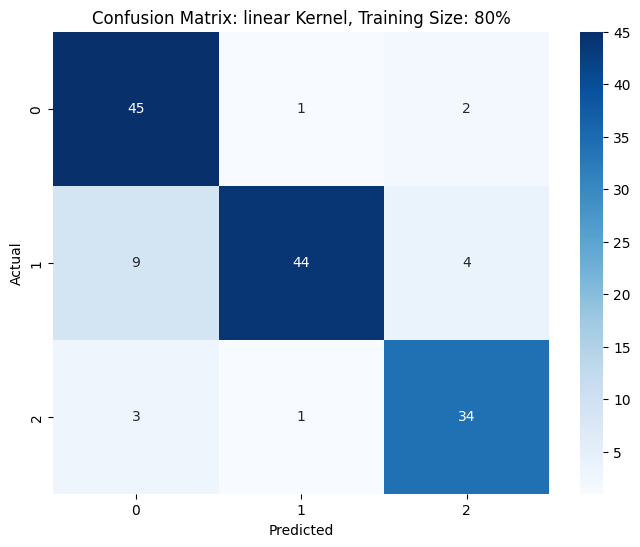

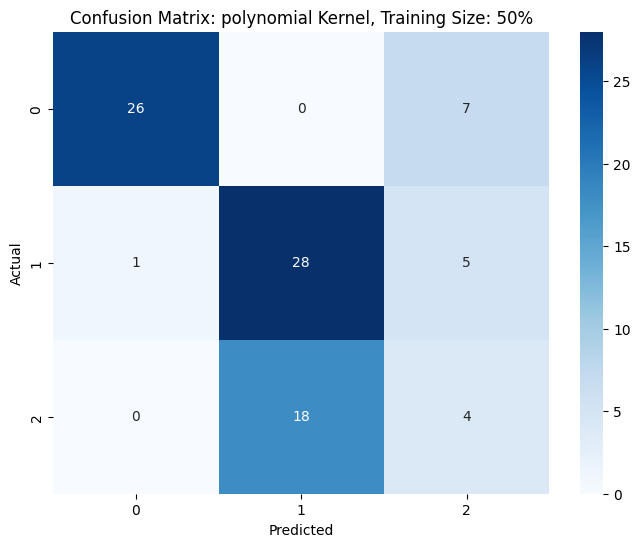

...

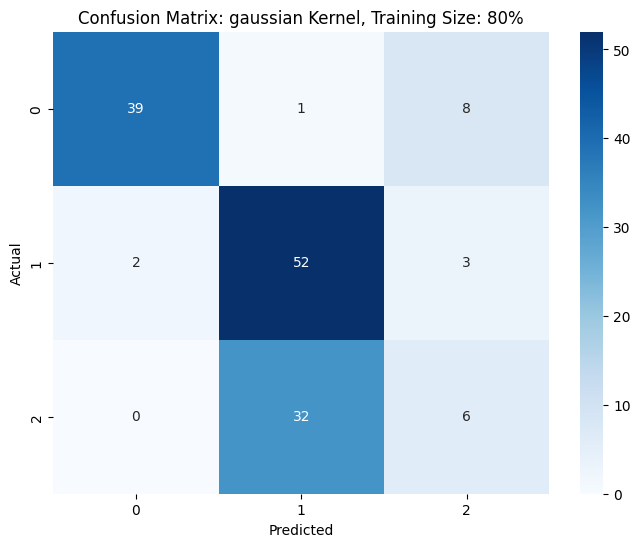

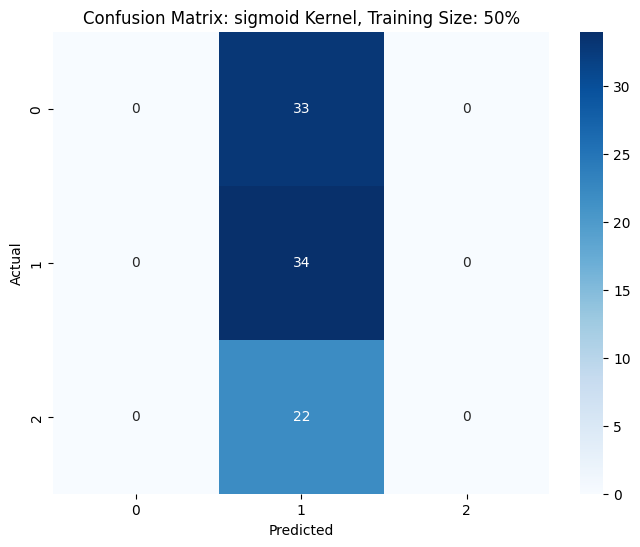

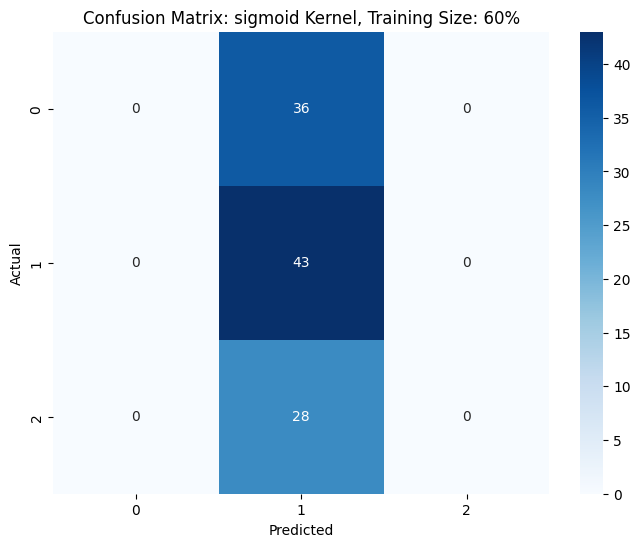

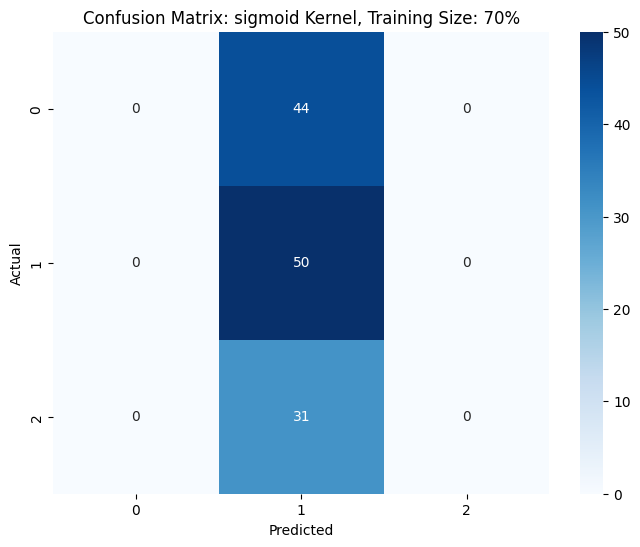

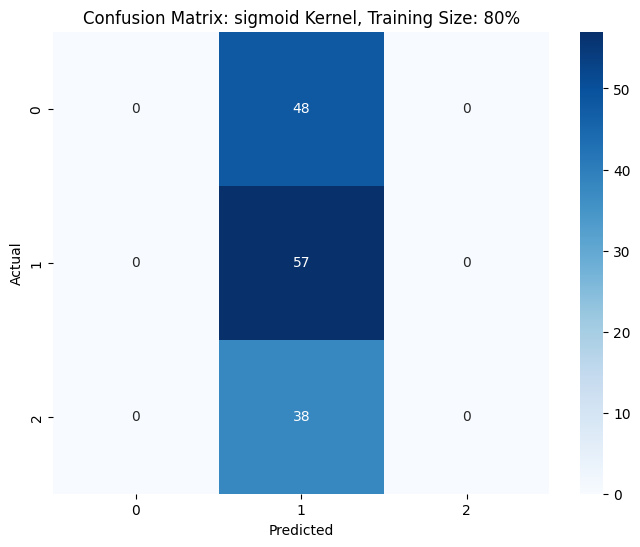

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

for cm_data in confusion_matrices:
    cm = cm_data["Confusion Matrix"]
    kernel_name = cm_data["Kernel"]
    training_size = cm_data["Training size"]

    plt.figure(figsize=(8, 6))
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues')
    plt.title(f'Confusion Matrix: {kernel_name} Kernel, Training Size: {training_size}%')
    plt.xlabel('Predicted')
    plt.ylabel('Actual')
    plt.show()

### ROC and AOC curve

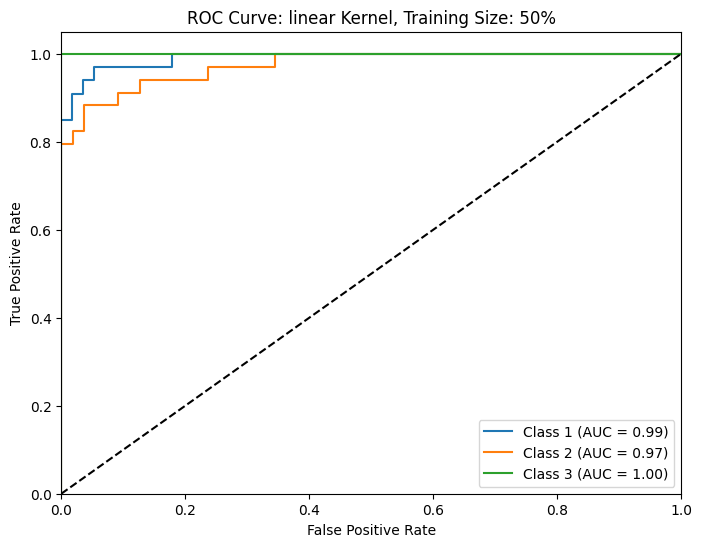

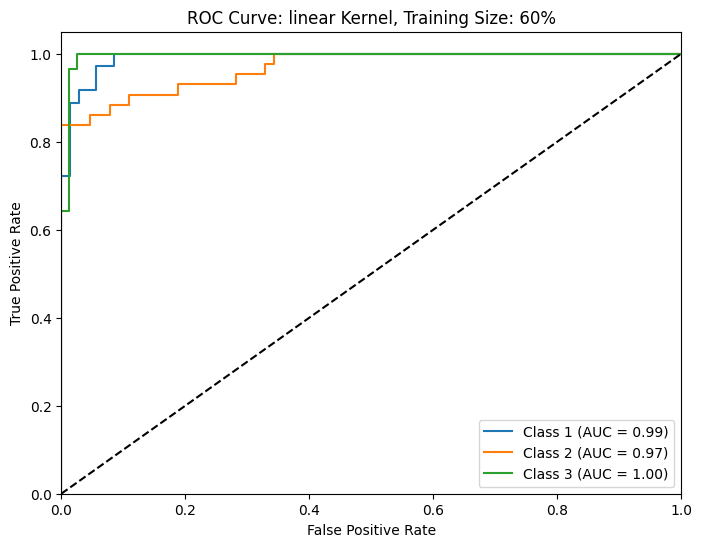

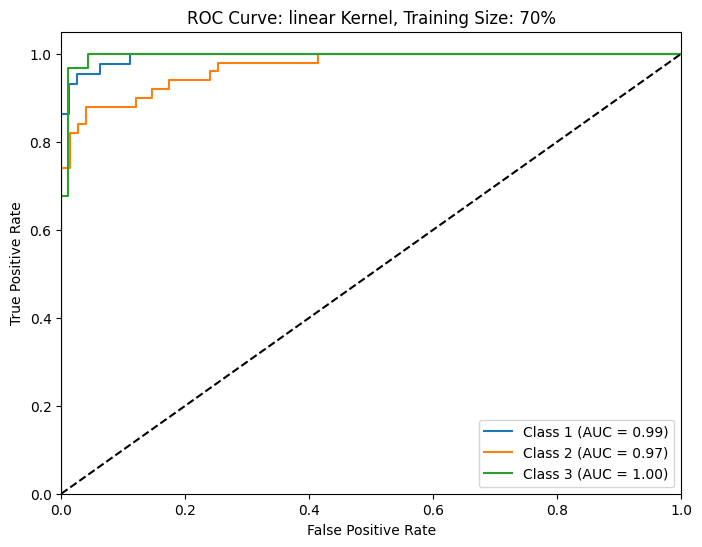

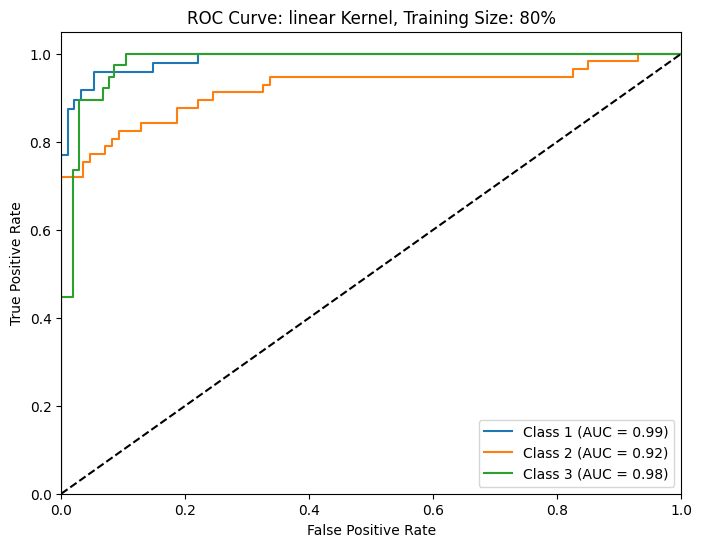

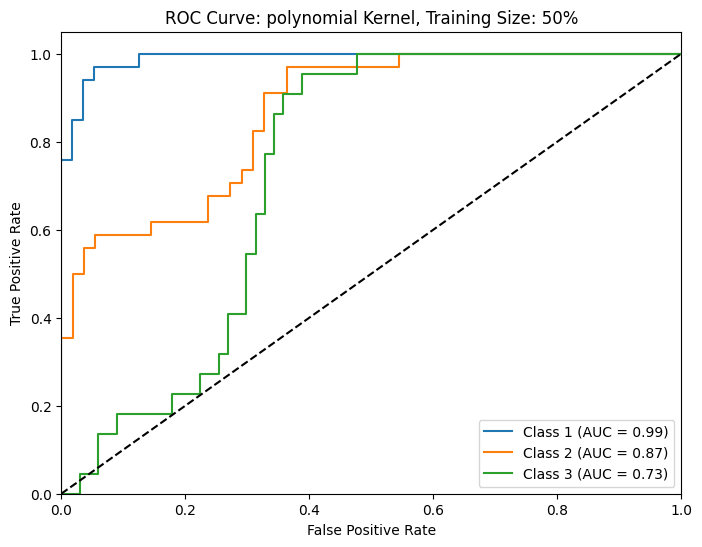

...

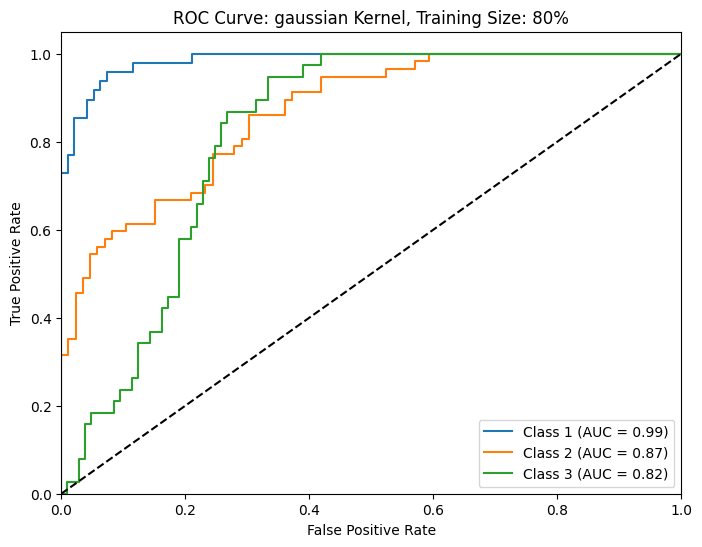

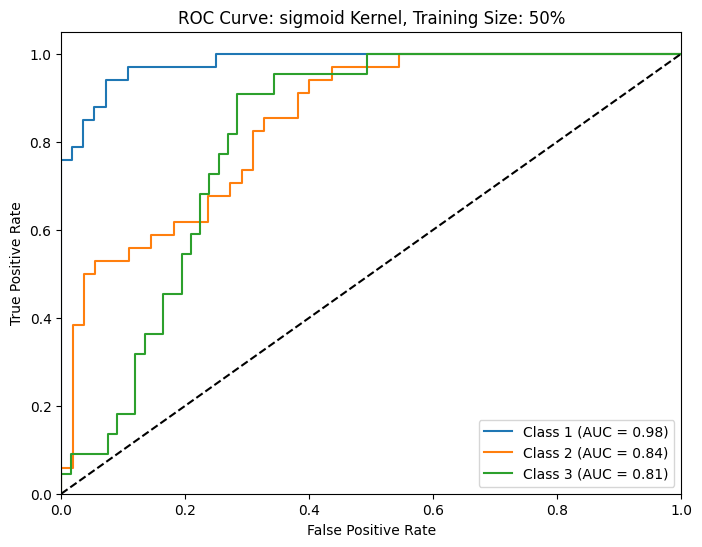

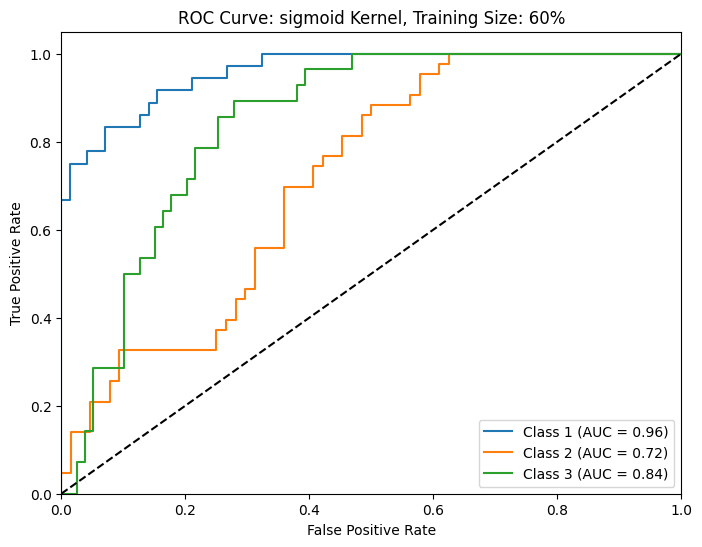

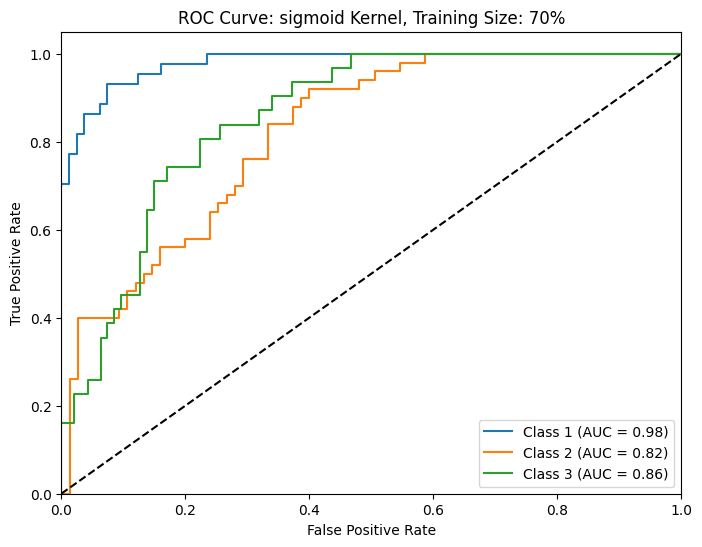

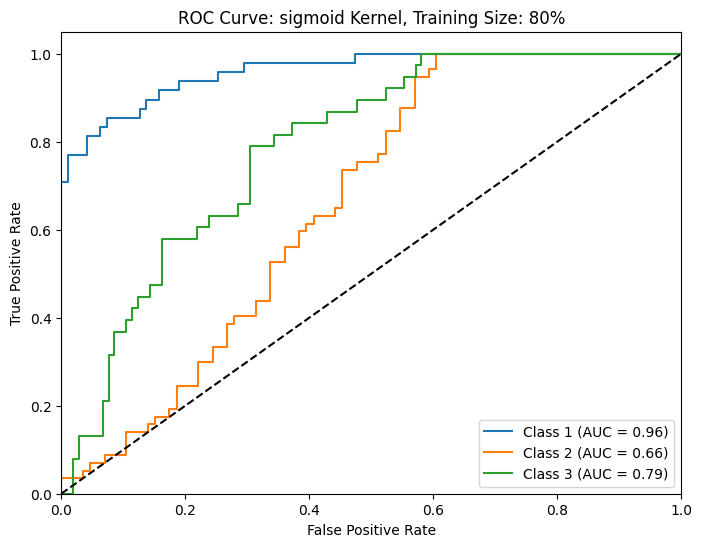

In [ ]:
from sklearn.metrics import roc_curve, auc

# Since this is a multi-class problem, we'll use a One-vs-Rest (OvR) approach for ROC curves
for model_data in trained_models:
    model = model_data["Model"]
    X_test = model_data["X_test"]
    y_test = model_data["y_test"]
    kernel_name = model_data["Kernel"]
    training_size = model_data["Training size"]

    plt.figure(figsize=(8, 6)) # Create a new figure for each plot

    # Get predicted probabilities for each class
    y_prob = model.predict_proba(X_test)

    # Compute ROC curve and AUC for each class using OvR
    fpr = dict()
    tpr = dict()
    roc_auc = dict()
    n_classes = len(np.unique(y_test))

    for i in range(n_classes):
        fpr[i], tpr[i], _ = roc_curve(y_test, y_prob[:, i], pos_label=i+1)
        roc_auc[i] = auc(fpr[i], tpr[i])

    # Plot ROC curve for each class
    for i in range(n_classes):
        plt.plot(fpr[i], tpr[i], label=f'Class {i+1} (AUC = {roc_auc[i]:.2f})')

    plt.plot([0, 1], [0, 1], 'k--') # Plot random chance line
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.05])
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title(f'ROC Curve: {kernel_name} Kernel, Training Size: {training_size}%') # Add title for each plot
    plt.legend(loc="lower right")
    plt.show()

### Calculate values for different test size using PCA-reduced data

In [ ]:
results_pca = []
confusion_matrices_pca = []

for kernel_name, kernel in kernels.items():
  for size in training_sizes:
   X_train_pca, X_test_pca, y_train, y_test = train_test_split(X_pca_reduced, y, test_size=size, random_state=42)
   svc_pca = SVC(kernel=kernel, probability=True, random_state=42) # Add probability=True
   svc_pca.fit(X_train_pca, y_train.values.ravel())
   y_pred_pca = svc_pca.predict(X_test_pca)

   acc_pca = accuracy_score(y_test, y_pred_pca)
   precision_pca = precision_score(y_test, y_pred_pca, average='weighted', zero_division=0) # Calculate weighted precision, handle zero division
   recall_pca = recall_score(y_test, y_pred_pca, average='weighted') # Calculate weighted recall
   f1_pca = f1_score(y_test, y_pred_pca, average='weighted') # Calculate weighted F1-score


   cm_pca = confusion_matrix(y_test, y_pred_pca) # Calculate confusion matrix

   results_pca.append({
       "Training size":int (size*100),
       "Accuracy":acc_pca,
       "Precision": precision_pca,
       "Recall": recall_pca,
       "F1-score": f1_pca,
       "Kernel":kernel_name
   })
   confusion_matrices_pca.append({ # Store confusion matrix with metadata
       "Training size":int (size*100),
       "Kernel":kernel_name,
       "Confusion Matrix":cm_pca
   })

### Print Accuracy, Precision, Recall, and F1-score Table and Graphs for PCA-Reduced Data

,Training size,Accuracy,Precision,Recall,F1-score,Kernel
0,50,0.988764,0.989085,0.988764,0.988715,linear
1,60,0.953271,0.956072,0.953271,0.953166,linear
2,70,0.960000,0.962150,0.960000,0.960011,linear
3,80,0.951049,0.954736,0.951049,0.950406,linear
4,50,0.876404,0.906617,0.876404,0.874846,polynomial
5,60,0.869159,0.892997,0.869159,0.869891,polynomial
6,70,0.880000,0.900444,0.880000,0.879207,polynomial
7,80,0.825175,0.870248,0.825175,0.825552,polynomial
8,50,0.977528,0.978777,0.977528,0.977632,gaussian
9,60,0.981308,0.982139,0.981308,0.981370,gaussian


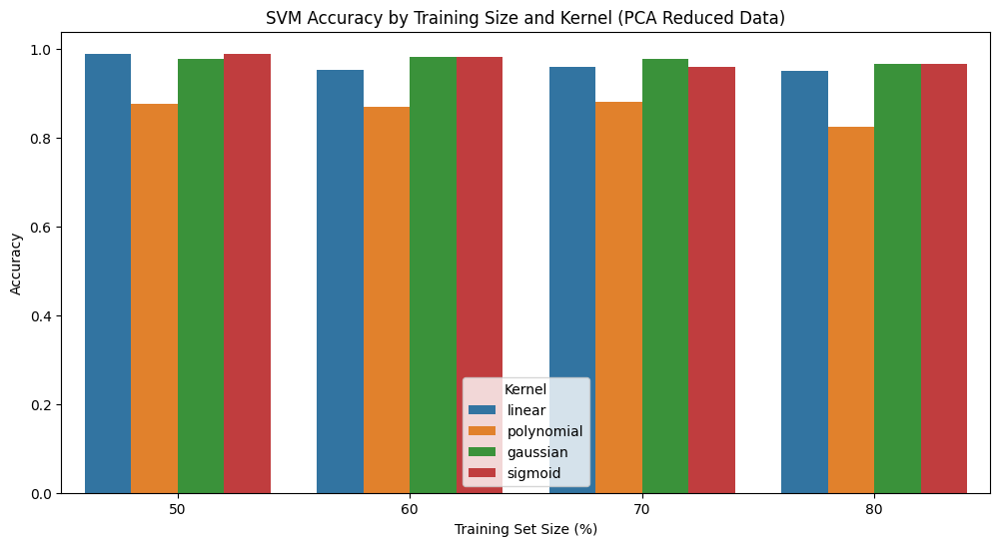

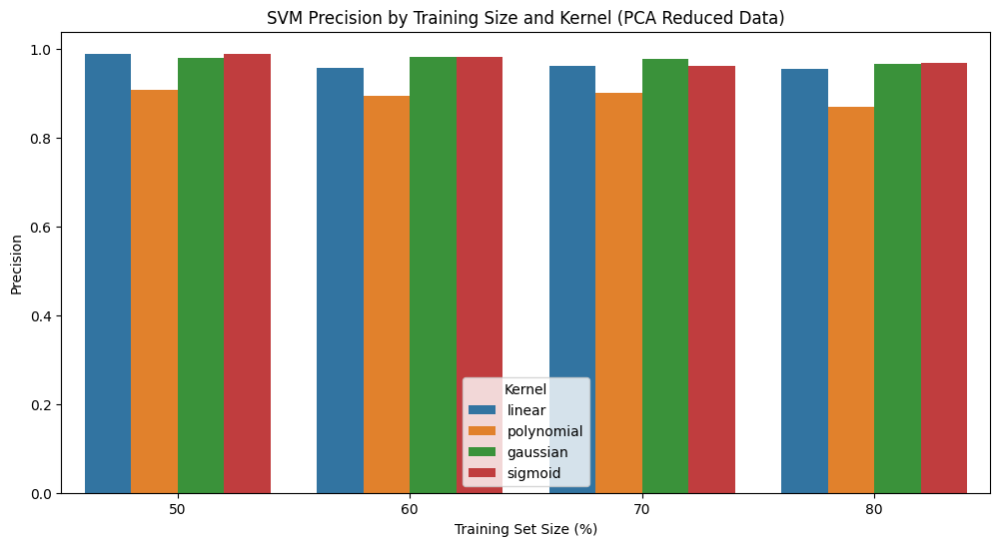

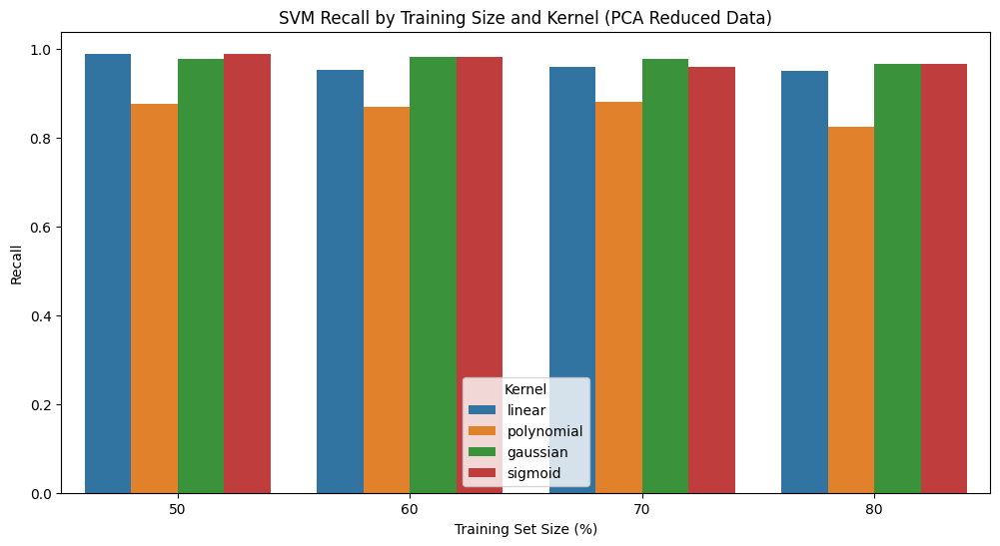

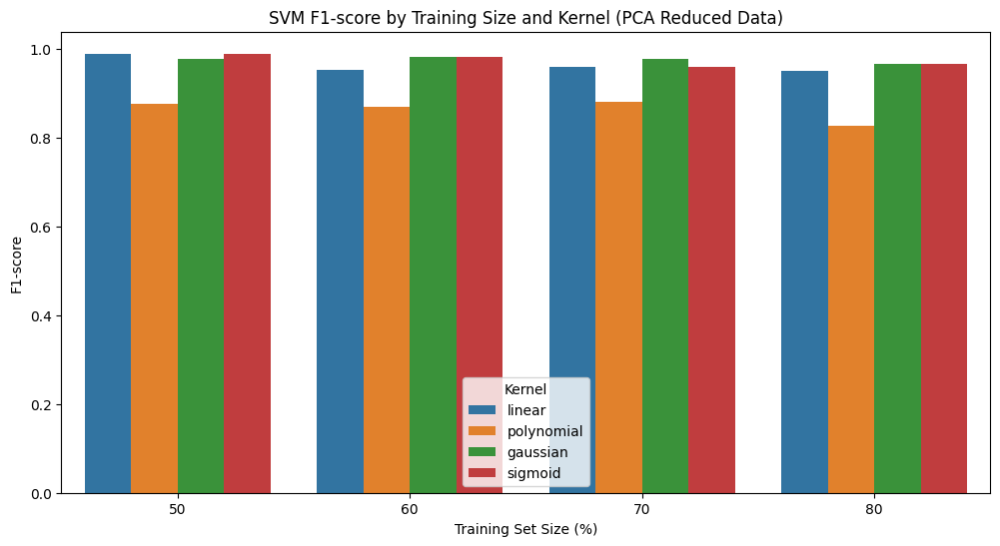

In [ ]:
df_pca = pd.DataFrame(results_pca)
display(df_pca) # Display the DataFrame as a table

# Plot Accuracy
plt.figure(figsize=(12, 6)) # Increase figure size
sns.barplot(data=df_pca, x='Training size', y='Accuracy', hue='Kernel')
plt.title('SVM Accuracy by Training Size and Kernel (PCA Reduced Data)') # Add title
plt.xlabel('Training Set Size (%)') # Add x-axis label
plt.ylabel('Accuracy') # Add y-axis label
plt.show()

# Plot Precision
plt.figure(figsize=(12, 6)) # Increase figure size
sns.barplot(data=df_pca, x='Training size', y='Precision', hue='Kernel')
plt.title('SVM Precision by Training Size and Kernel (PCA Reduced Data)') # Add title
plt.xlabel('Training Set Size (%)') # Add x-axis label
plt.ylabel('Precision') # Add y-axis label
plt.show()

# Plot Recall
plt.figure(figsize=(12, 6)) # Increase figure size
sns.barplot(data=df_pca, x='Training size', y='Recall', hue='Kernel')
plt.title('SVM Recall by Training Size and Kernel (PCA Reduced Data)') # Add title
plt.xlabel('Training Set Size (%)') # Add x-axis label
plt.ylabel('Recall') # Add y-axis label
plt.show()

# Plot F1-score
plt.figure(figsize=(12, 6)) # Increase figure size
sns.barplot(data=df_pca, x='Training size', y='F1-score', hue='Kernel')
plt.title('SVM F1-score by Training Size and Kernel (PCA Reduced Data)') # Add title
plt.xlabel('Training Set Size (%)') # Add x-axis label
plt.ylabel('F1-score') # Add y-axis label
plt.show()

### Show Confusion Matrices for PCA-Reduced Data

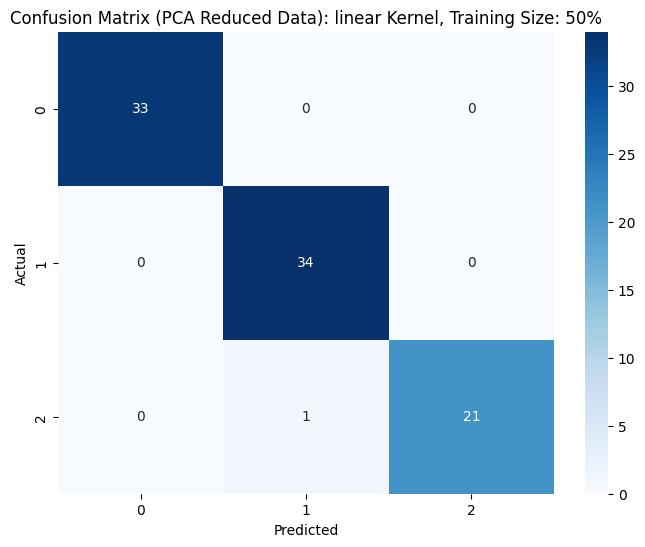

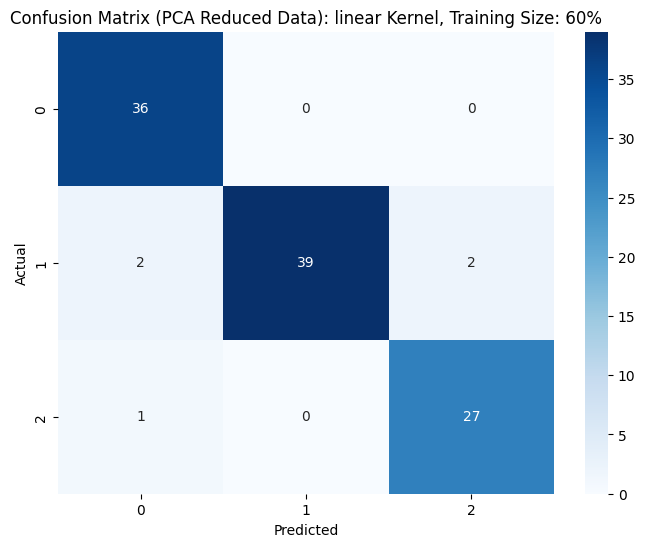

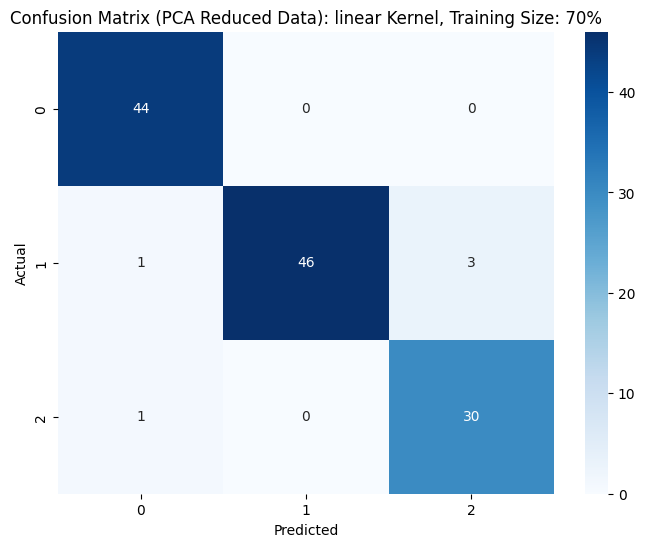

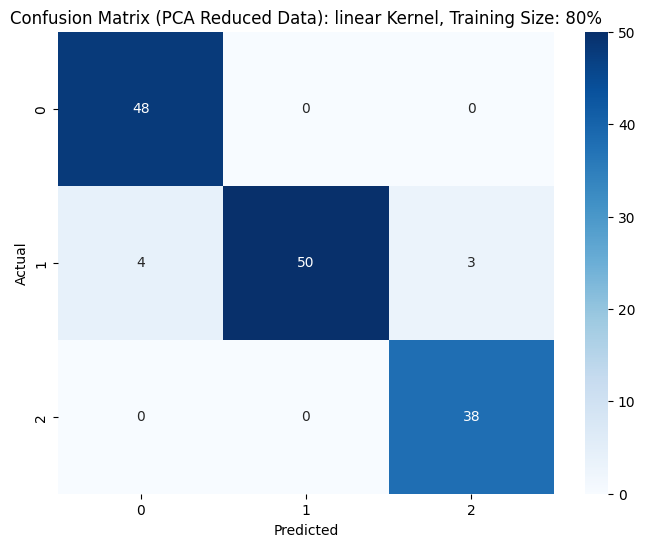

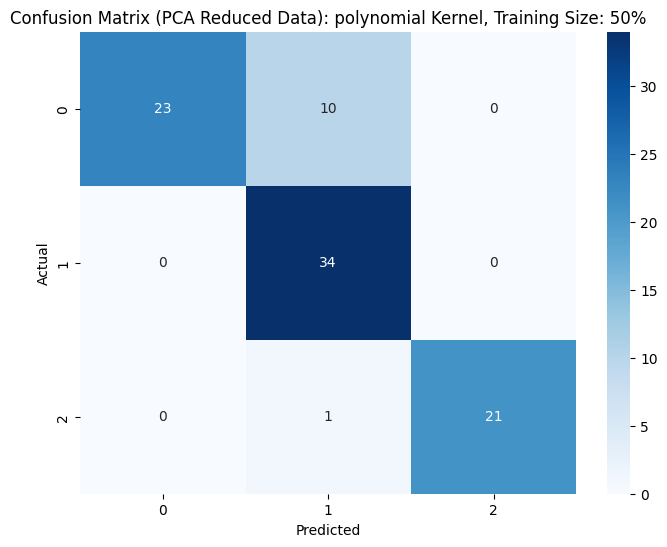

...

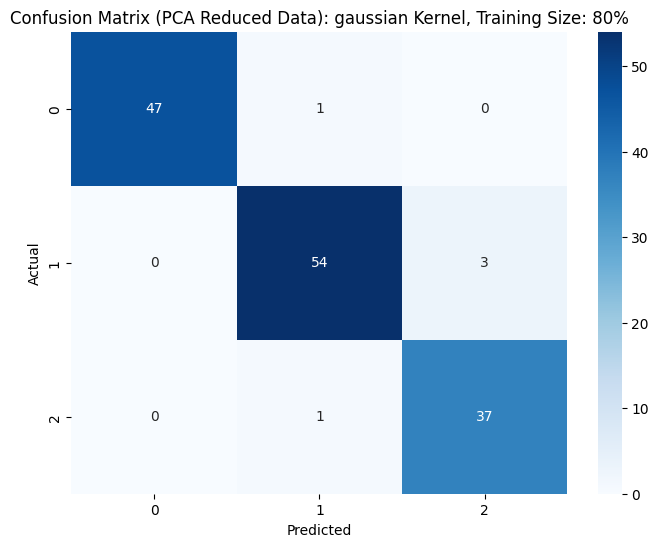

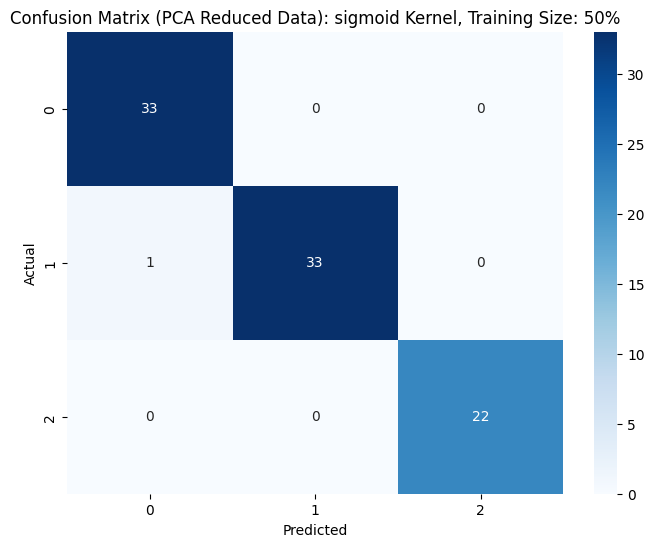

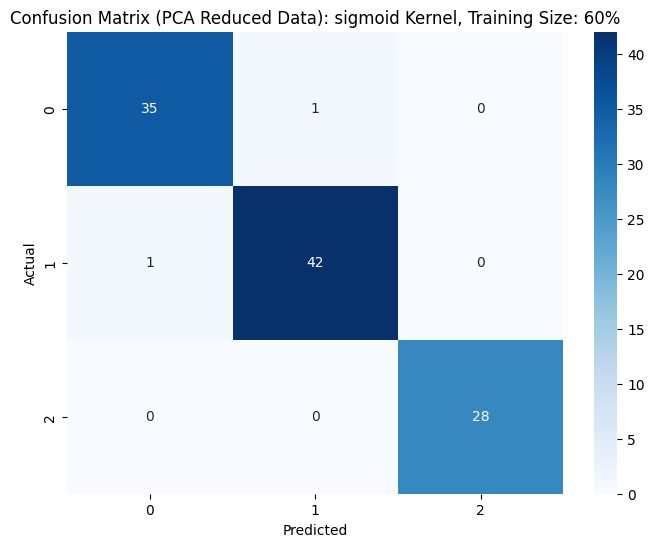

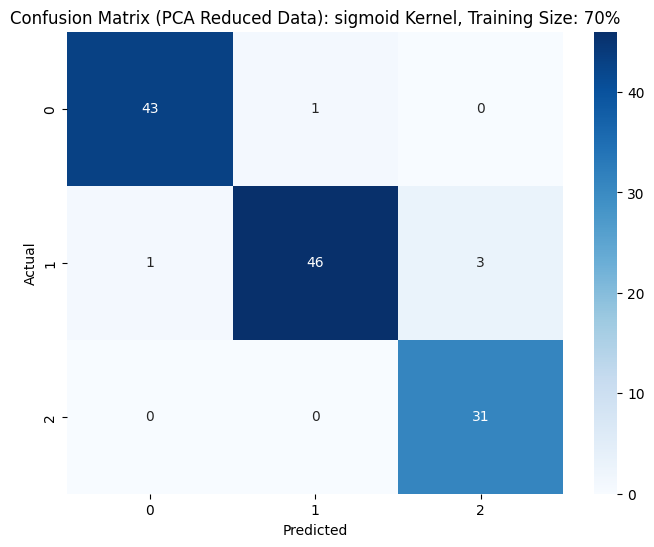

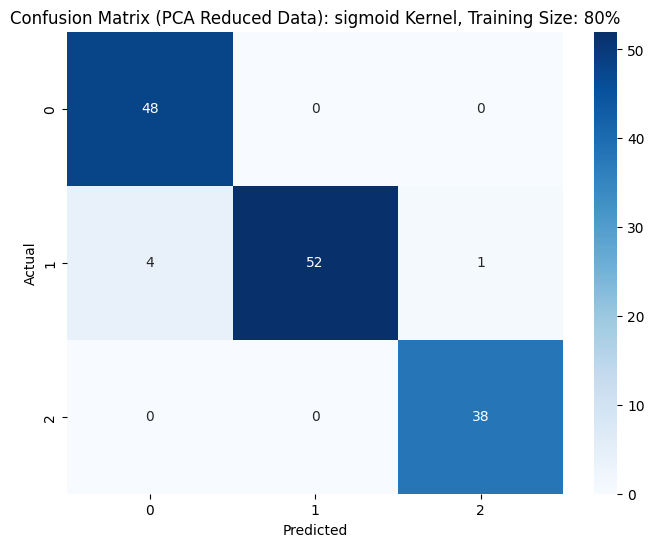

In [ ]:
for cm_data in confusion_matrices_pca:
    cm = cm_data["Confusion Matrix"]
    kernel_name = cm_data["Kernel"]
    training_size = cm_data["Training size"]

    plt.figure(figsize=(8, 6))
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues')
    plt.title(f'Confusion Matrix (PCA Reduced Data): {kernel_name} Kernel, Training Size: {training_size}%')
    plt.xlabel('Predicted')
    plt.ylabel('Actual')
    plt.show()

## MLP

### Calculate values for different test size

In [ ]:
from sklearn.neural_network import MLPClassifier
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, confusion_matrix
import matplotlib.pyplot as plt
import seaborn as sns

training_sizes = [0.5, 0.6, 0.7, 0.8]

results_mlp = []
confusion_matrices_mlp = []
trained_models_mlp = []

for size in training_sizes:
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=size, random_state=42)

    # Initialize MLPClassifier
    # You might need to tune the hyperparameters like hidden_layer_sizes, activation, solver, etc.
    mlp = MLPClassifier(max_iter=1500, momentum=0.7, learning_rate_init=0.0005) # Increased max_iter

    mlp.fit(X_train, y_train.values.ravel())
    y_pred = mlp.predict(X_test)

    acc = accuracy_score(y_test, y_pred)
    precision = precision_score(y_test, y_pred, average='weighted', zero_division=0)
    recall = recall_score(y_test, y_pred, average='weighted')
    f1 = f1_score(y_test, y_pred, average='weighted')

    cm = confusion_matrix(y_test, y_pred)

    results_mlp.append({
        "Training size": int(size * 100),
        "Accuracy": acc,
        "Precision": precision,
        "Recall": recall,
        "F1-score": f1
    })
    confusion_matrices_mlp.append({
        "Training size": int(size * 100),
        "Confusion Matrix": cm
    })
    trained_models_mlp.append({ # Store the trained model with metadata
      "Training size":int (size*100),
      "Model": mlp,
      "X_test": X_test,
      "y_test": y_test
    })

### Print Evalution Table and Graphs

,Training size,Accuracy,Precision,Recall,F1-score
0,50,0.584270,0.525580,0.584270,0.506239
1,60,0.943925,0.947556,0.943925,0.944307
2,70,0.936000,0.937158,0.936000,0.936255
3,80,0.629371,0.559791,0.629371,0.580560


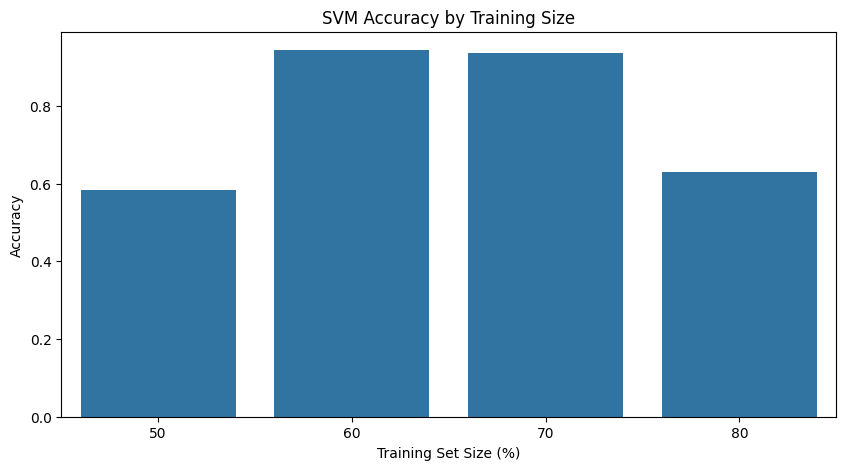

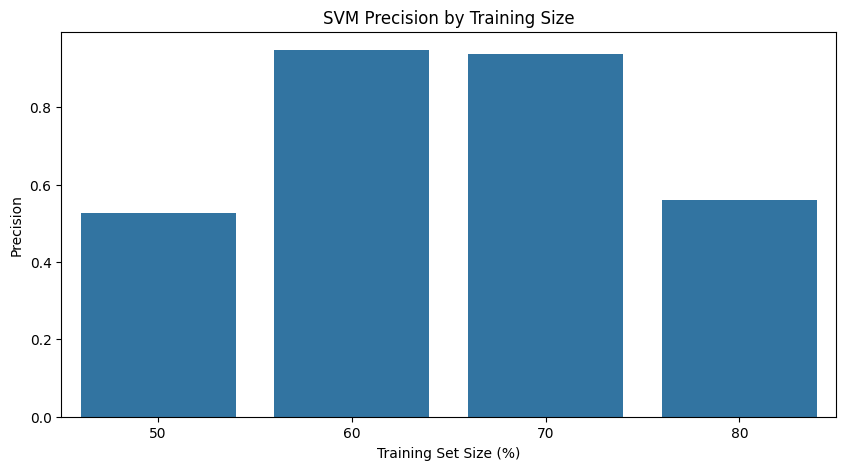

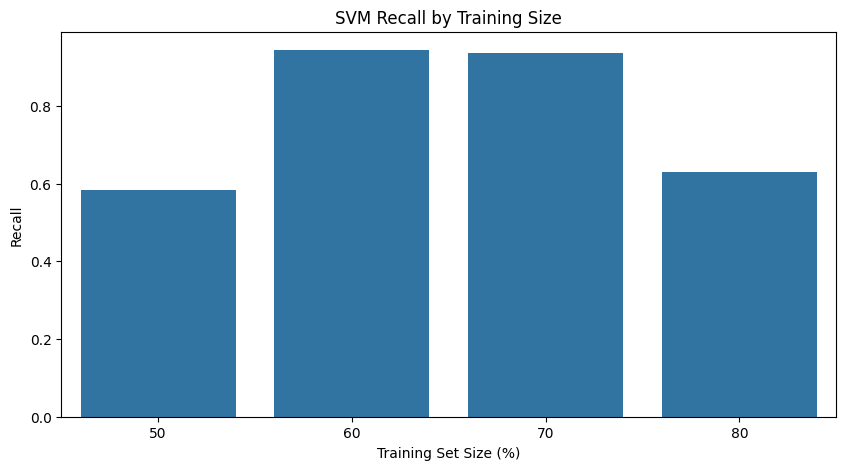

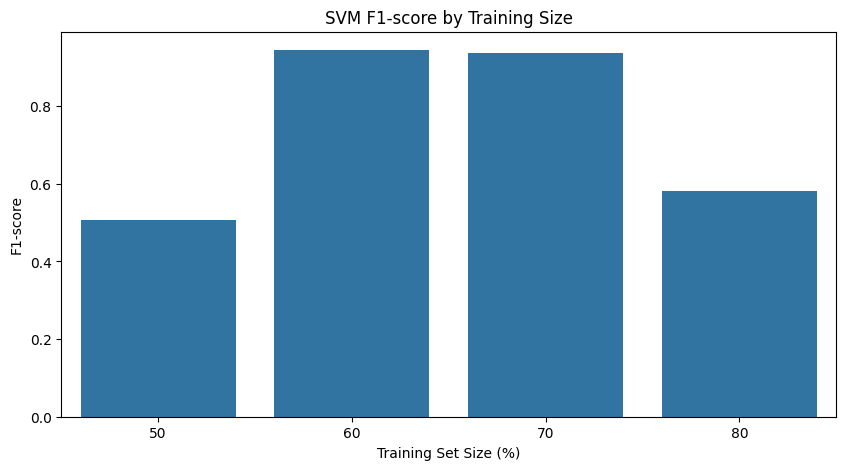

In [ ]:
df = pd.DataFrame(results_mlp)
display(df) # Display the DataFrame as a table

# Plot Accuracy
plt.figure(figsize=(10, 5)) # Increase figure size
sns.barplot(data=df, x='Training size', y='Accuracy')
plt.title('SVM Accuracy by Training Size') # Add title
plt.xlabel('Training Set Size (%)') # Add x-axis label
plt.ylabel('Accuracy') # Add y-axis label
plt.show()

# Plot Precision
plt.figure(figsize=(10, 5)) # Increase figure size
sns.barplot(data=df, x='Training size', y='Precision')
plt.title('SVM Precision by Training Size') # Add title
plt.xlabel('Training Set Size (%)') # Add x-axis label
plt.ylabel('Precision') # Add y-axis label
plt.show()

# Plot Recall
plt.figure(figsize=(10, 5)) # Increase figure size
sns.barplot(data=df, x='Training size', y='Recall')
plt.title('SVM Recall by Training Size') # Add title
plt.xlabel('Training Set Size (%)') # Add x-axis label
plt.ylabel('Recall') # Add y-axis label
plt.show()

# Plot F1-score
plt.figure(figsize=(10, 5)) # Increase figure size
sns.barplot(data=df, x='Training size', y='F1-score')
plt.title('SVM F1-score by Training Size') # Add title
plt.xlabel('Training Set Size (%)') # Add x-axis label
plt.ylabel('F1-score') # Add y-axis label
plt.show()

### Show Confusion Matrices

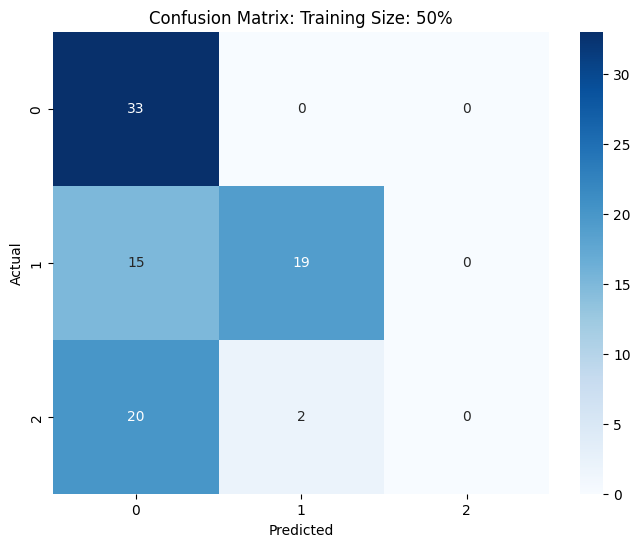

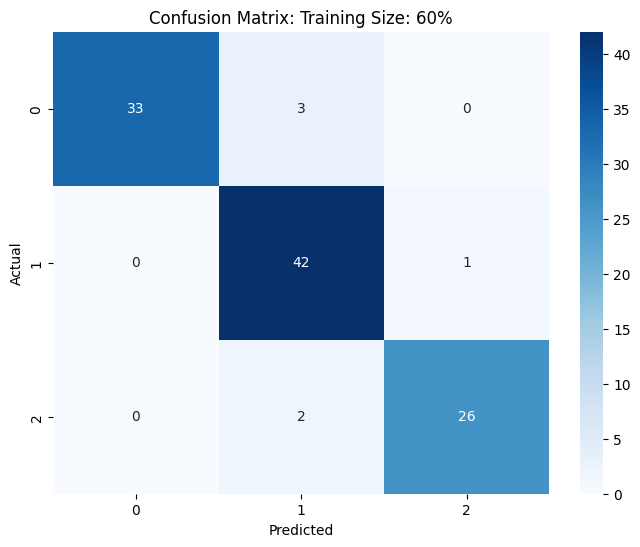

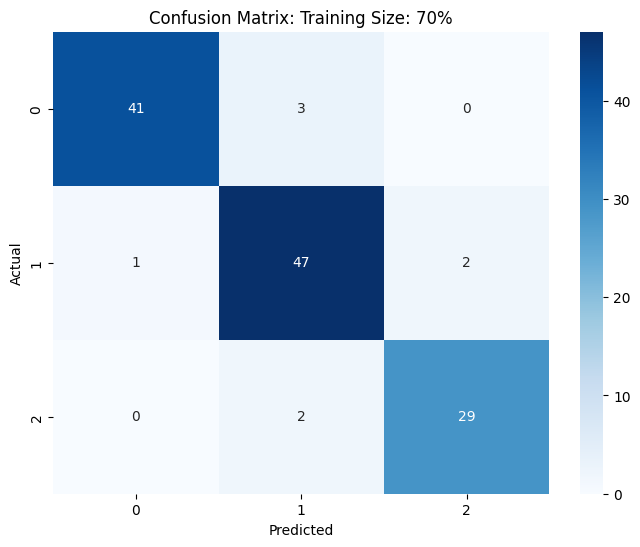

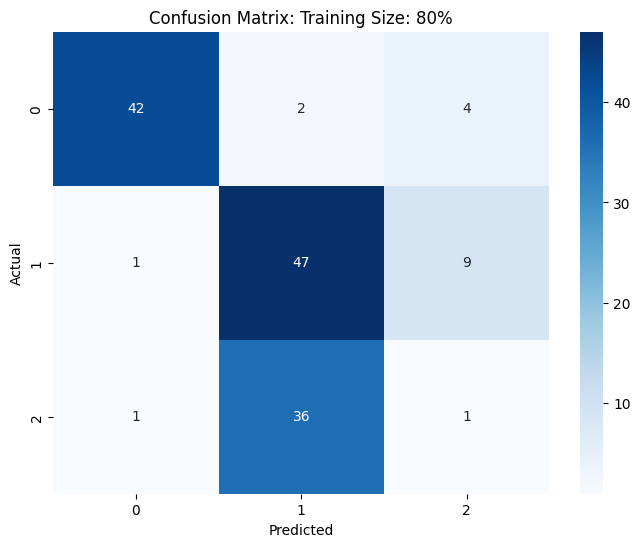

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

for cm_data in confusion_matrices_mlp:
    cm = cm_data["Confusion Matrix"]
    training_size = cm_data["Training size"]

    plt.figure(figsize=(8, 6))
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues')
    plt.title(f'Confusion Matrix: Training Size: {training_size}%')
    plt.xlabel('Predicted')
    plt.ylabel('Actual')
    plt.show()

### Training and Loss generation curve

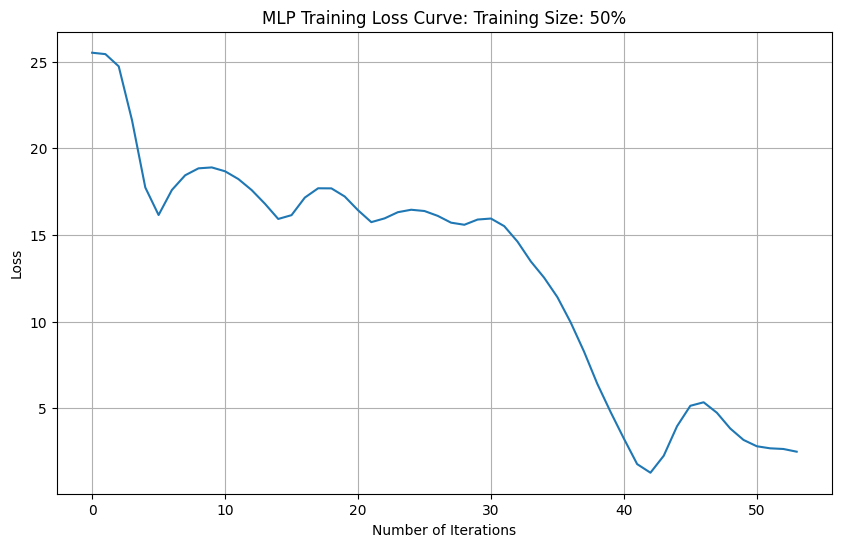

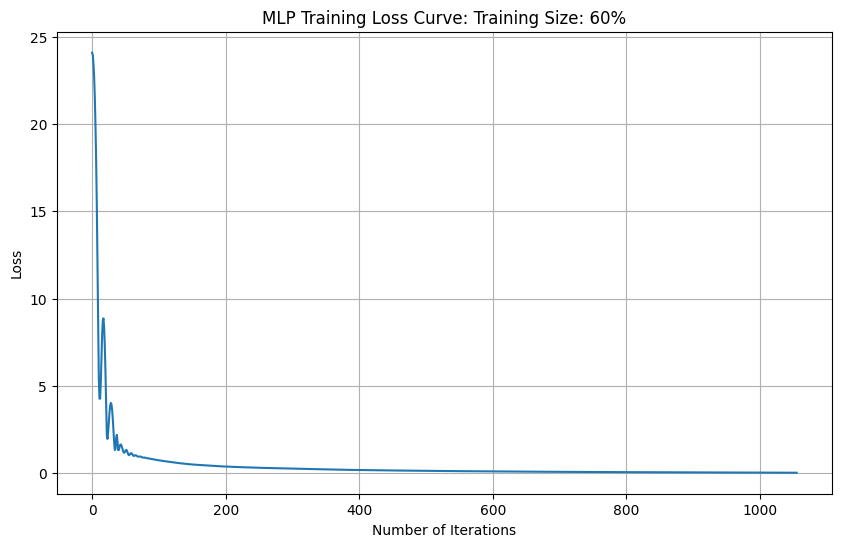

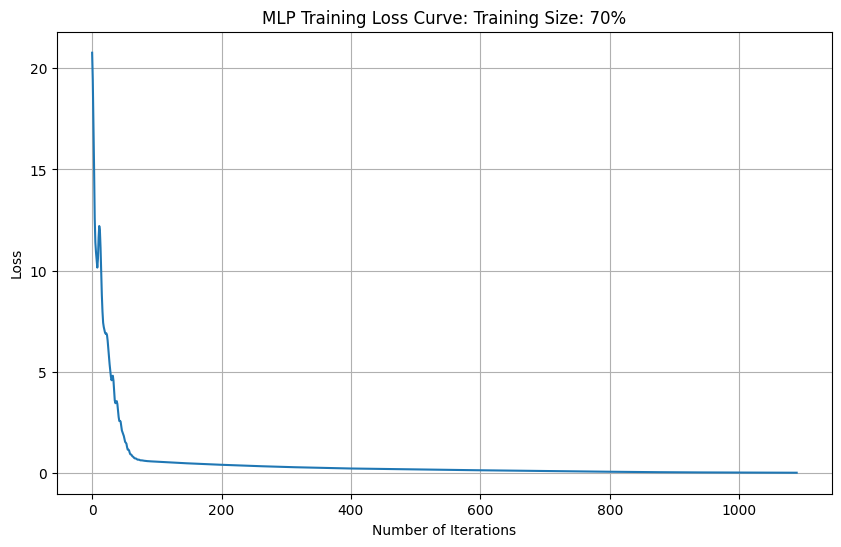

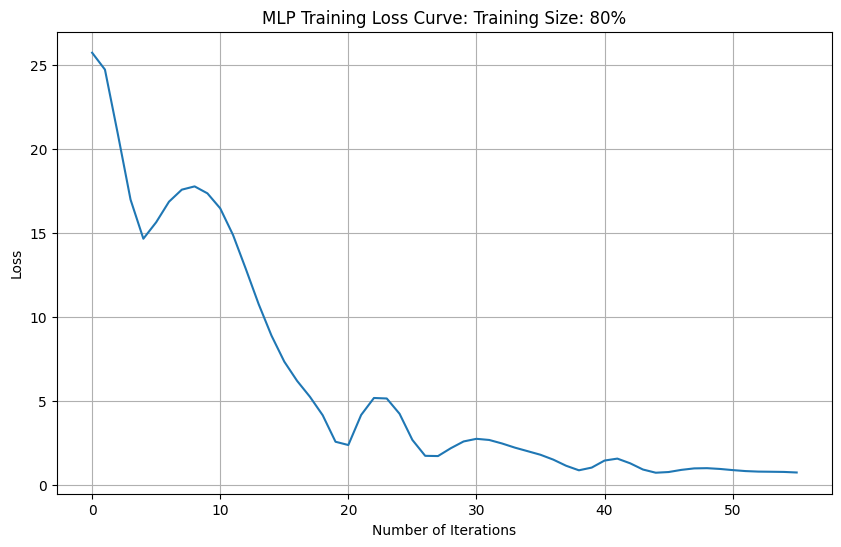

In [ ]:
# Plot training loss curve for each trained MLP model
for model_data in trained_models_mlp:
    model = model_data["Model"]
    training_size = model_data["Training size"]

    plt.figure(figsize=(10, 6))
    plt.plot(model.loss_curve_)
    plt.title(f'MLP Training Loss Curve: Training Size: {training_size}%')
    plt.xlabel('Number of Iterations')
    plt.ylabel('Loss')
    plt.grid(True)
    plt.show()

### ROC and AOC curve

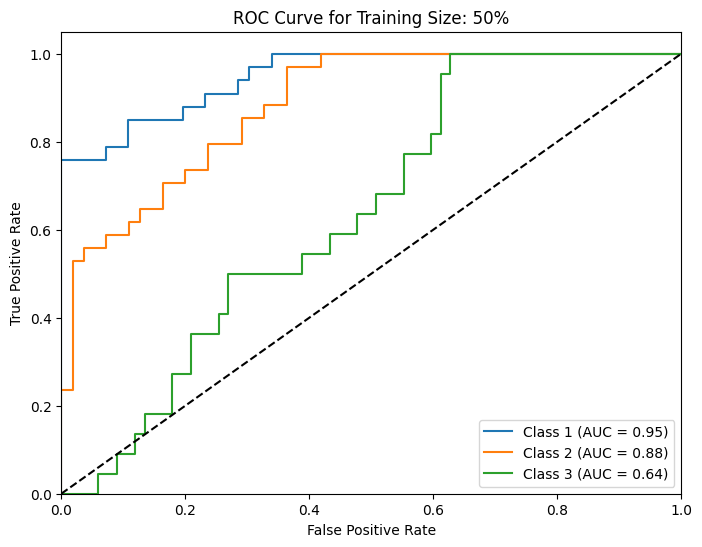

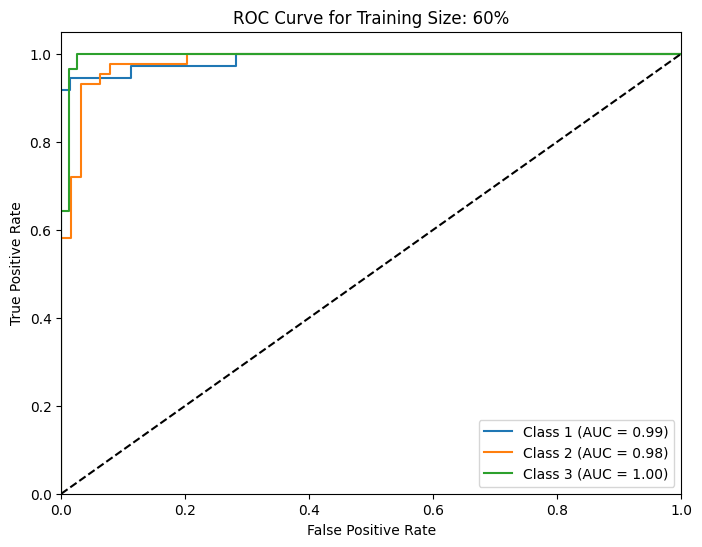

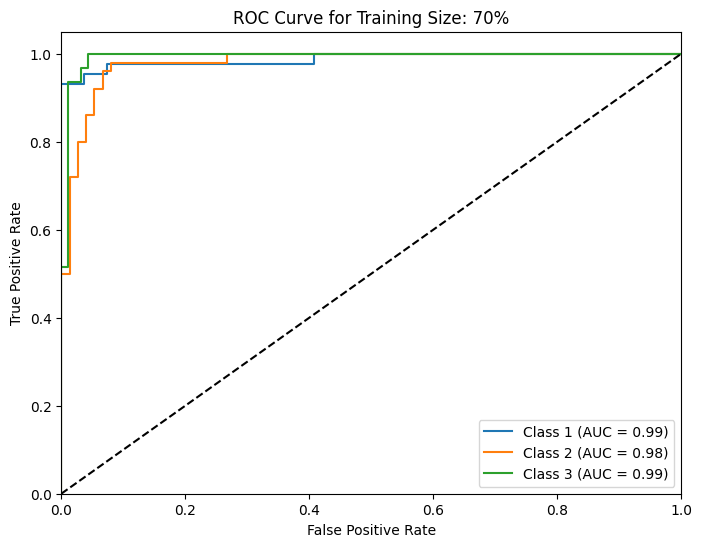

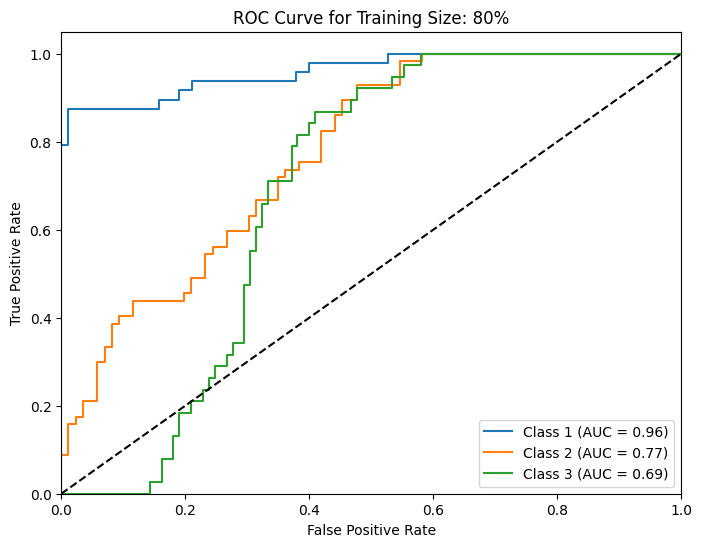

In [ ]:
from sklearn.metrics import roc_curve, auc

# Since this is a multi-class problem, we'll use a One-vs-Rest (OvR) approach for ROC curves
for model_data in trained_models_mlp:
    model = model_data["Model"]
    X_test = model_data["X_test"]
    y_test = model_data["y_test"]
    training_size = model_data["Training size"]

    plt.figure(figsize=(8, 6)) # Create a new figure for each plot

    # Get predicted probabilities for each class
    y_prob = model.predict_proba(X_test)

    # Compute ROC curve and AUC for each class using OvR
    fpr = dict()
    tpr = dict()
    roc_auc = dict()
    n_classes = len(np.unique(y_test))

    for i in range(n_classes):
        fpr[i], tpr[i], _ = roc_curve(y_test, y_prob[:, i], pos_label=i+1)
        roc_auc[i] = auc(fpr[i], tpr[i])

    # Plot ROC curve for each class
    for i in range(n_classes):
        plt.plot(fpr[i], tpr[i], label=f'Class {i+1} (AUC = {roc_auc[i]:.2f})')

    plt.plot([0, 1], [0, 1], 'k--') # Plot random chance line
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.05])
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title(f'ROC Curve for Training Size: {training_size}%') # Add title for each plot
    plt.legend(loc="lower right")
    plt.show()

### MLP with PCA-Reduced Data

In [ ]:
# Apply the existing PCA transformation to the scaled data
X_pca_reduced_mlp = pca.fit_transform(X_scaled)

print(f"\nOriginal number of features: {X.shape[1]}")
print(f"Reduced number of features after PCA: {X_pca_reduced_mlp.shape[1]}")
print("\nData after PCA for Random Forest:")
display(pd.DataFrame(X_pca_reduced_mlp).head())


Original number of features: 13
Reduced number of features after PCA: 10

Data after PCA for Random Forest:


,0,1,2,3,4,5,6,7,8,9
0,3.316751,1.443463,-0.165739,-0.215631,0.693043,0.223880,0.596427,-0.065139,-0.641443,1.020956
1,2.209465,-0.333393,-2.026457,-0.291358,-0.257655,0.927120,0.053776,-1.024416,0.308847,0.159701
2,2.516740,1.031151,0.982819,0.724902,-0.251033,-0.549276,0.424205,0.344216,1.177834,0.113361
3,3.757066,2.756372,-0.176192,0.567983,-0.311842,-0.114431,-0.383337,-0.643593,-0.052544,0.239413
4,1.008908,0.869831,2.026688,-0.409766,0.298458,0.406520,0.444074,-0.416700,-0.326819,-0.078366


### Calculate MLP performance with PCA-Reduced Data for different test sizes

In [ ]:
results_mlp_pca = []
confusion_matrices_mlp_pca = []
trained_models_mlp_pca = []


for size in training_sizes:
  X_train_pca_mlp, X_test_pca_mlp, y_train, y_test = train_test_split(X_pca_reduced_mlp, y, test_size=size, random_state=42)
  mlp_pca = MLPClassifier(max_iter=1500, momentum=0.7, learning_rate_init=0.0005)

  mlp_pca.fit(X_train_pca_mlp, y_train.values.ravel())
  y_pred_pca_mlp = mlp_pca.predict(X_test_pca_mlp)

  acc_pca_mlp = accuracy_score(y_test, y_pred_pca_mlp)
  precision_pca_mlp = precision_score(y_test, y_pred_pca_mlp, average='weighted', zero_division=0)
  recall_pca_mlp = recall_score(y_test, y_pred_pca_mlp, average='weighted')
  f1_pca_mlp = f1_score(y_test, y_pred_pca_mlp, average='weighted')

  cm_pca_mlp = confusion_matrix(y_test, y_pred_pca_mlp)

  results_mlp_pca.append({
      "Training size":int (size*100),
      "Accuracy":acc_pca_mlp,
      "Precision": precision_pca_mlp,
      "Recall": recall_pca_mlp,
      "F1-score": f1_pca_mlp
  })

  confusion_matrices_mlp_pca.append({
      "Training size":int (size*100),
      "Confusion Matrix":cm_pca_mlp
  })

  trained_models_mlp_pca.append({
      "Training size":int (size*100),
      "Model": mlp_pca
  })



### Print MLP Performance Table and Graphs with PCA-Reduced Data

,Training size,Accuracy,Precision,Recall,F1-score
0,50,0.988764,0.989085,0.988764,0.988759
1,60,0.971963,0.972986,0.971963,0.972054
2,70,0.968000,0.969784,0.968000,0.968181
3,80,0.937063,0.943280,0.937063,0.936004


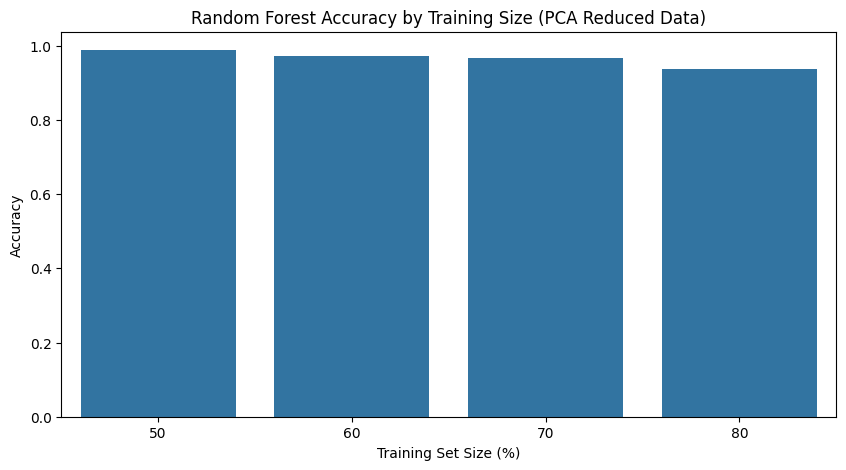

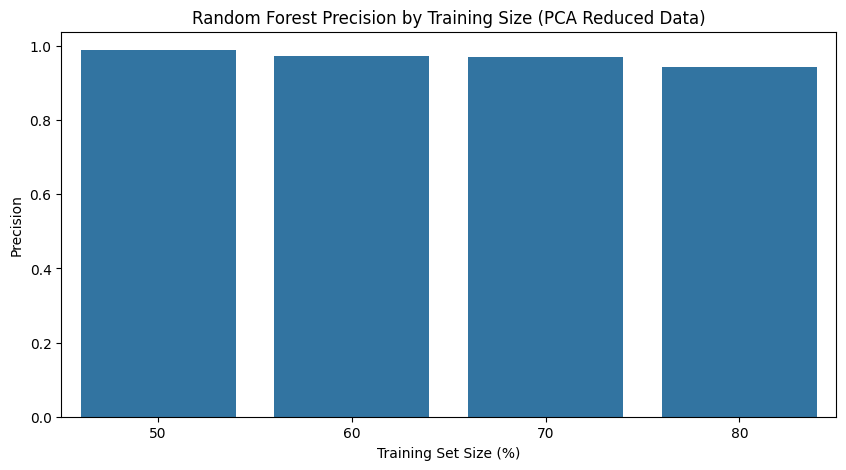

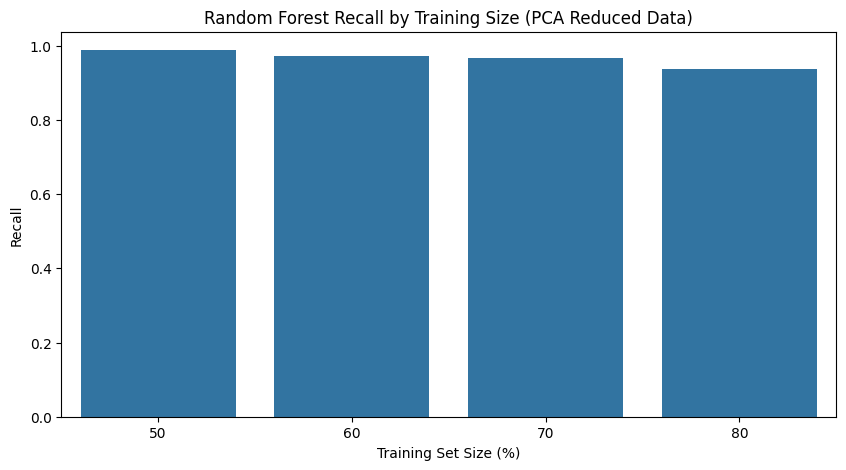

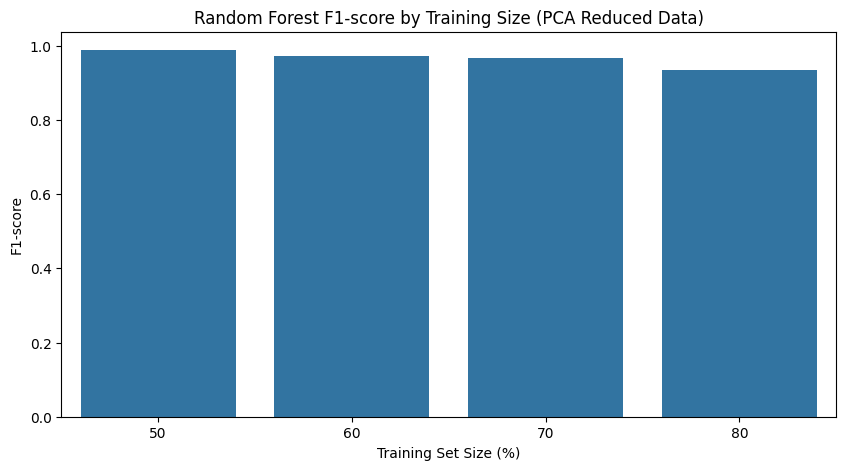

In [ ]:
df_mlp_pca = pd.DataFrame(results_mlp_pca)
display(df_mlp_pca)

# Plot Accuracy
plt.figure(figsize=(10, 5))
sns.barplot(data=df_mlp_pca, x='Training size', y='Accuracy')
plt.title('Random Forest Accuracy by Training Size (PCA Reduced Data)')
plt.xlabel('Training Set Size (%)')
plt.ylabel('Accuracy')
plt.show()

# Plot Precision
plt.figure(figsize=(10, 5))
sns.barplot(data=df_mlp_pca, x='Training size', y='Precision')
plt.title('Random Forest Precision by Training Size (PCA Reduced Data)')
plt.xlabel('Training Set Size (%)')
plt.ylabel('Precision')
plt.show()

# Plot Recall
plt.figure(figsize=(10, 5))
sns.barplot(data=df_mlp_pca, x='Training size', y='Recall')
plt.title('Random Forest Recall by Training Size (PCA Reduced Data)')
plt.xlabel('Training Set Size (%)')
plt.ylabel('Recall')
plt.show()

# Plot F1-score
plt.figure(figsize=(10, 5))
sns.barplot(data=df_mlp_pca, x='Training size', y='F1-score')
plt.title('Random Forest F1-score by Training Size (PCA Reduced Data)')
plt.xlabel('Training Set Size (%)')
plt.ylabel('F1-score')
plt.show()



### Show Confusion Matrices for MLP with PCA-Reduced Data

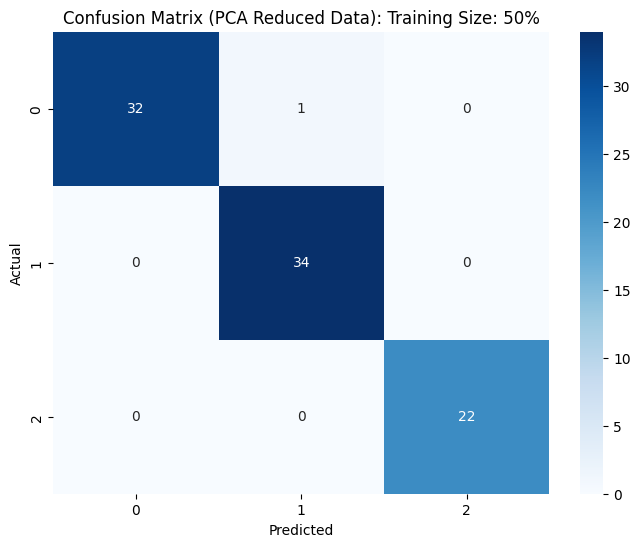

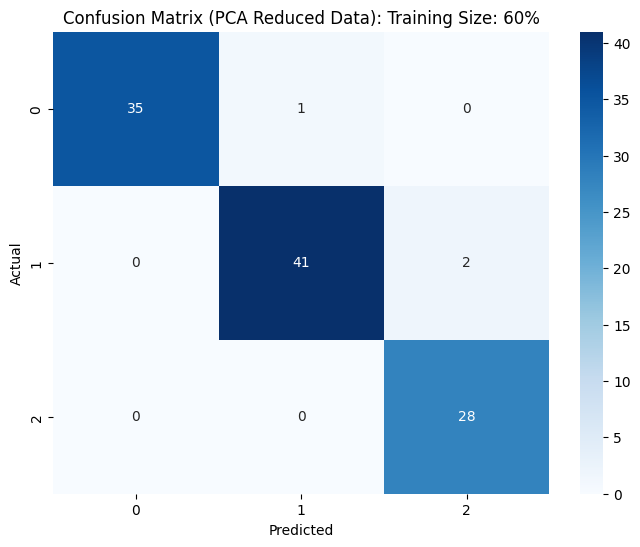

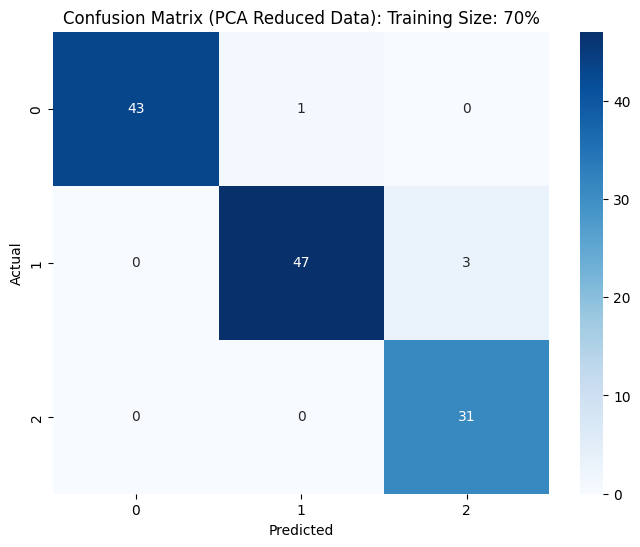

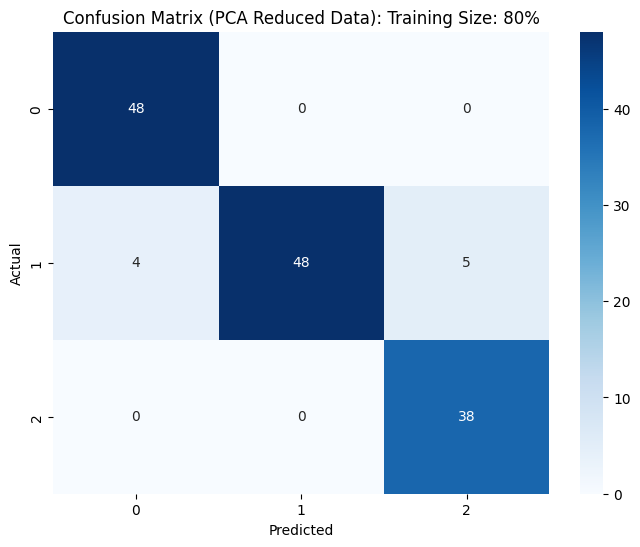

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

for cm_data in confusion_matrices_mlp_pca:
    cm = cm_data["Confusion Matrix"]
    training_size = cm_data["Training size"]

    plt.figure(figsize=(8, 6))
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues')
    plt.title(f'Confusion Matrix (PCA Reduced Data): Training Size: {training_size}%')
    plt.xlabel('Predicted')
    plt.ylabel('Actual')
    plt.show()

### Training Loss generation curve with PCA-Reduced Data

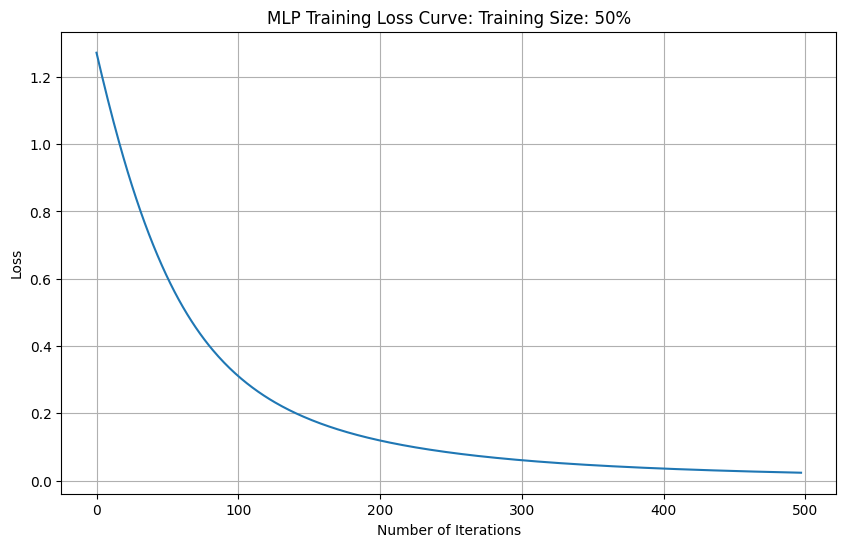

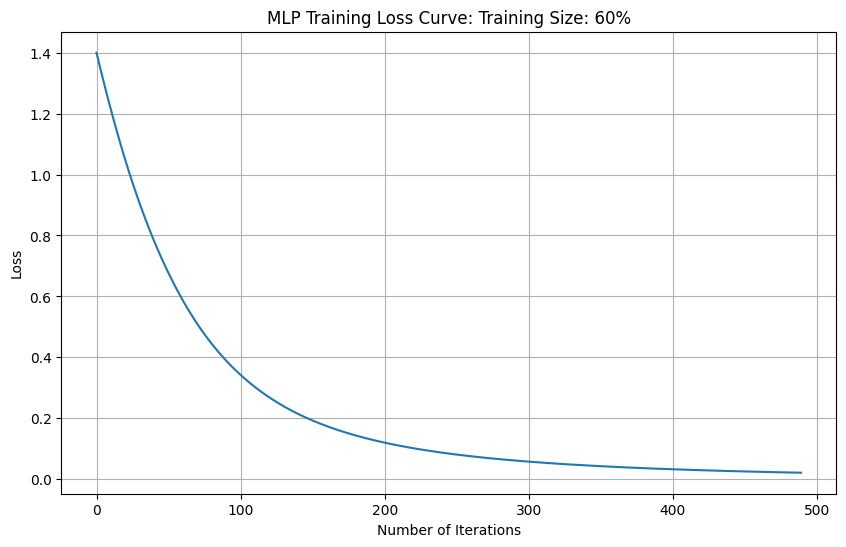

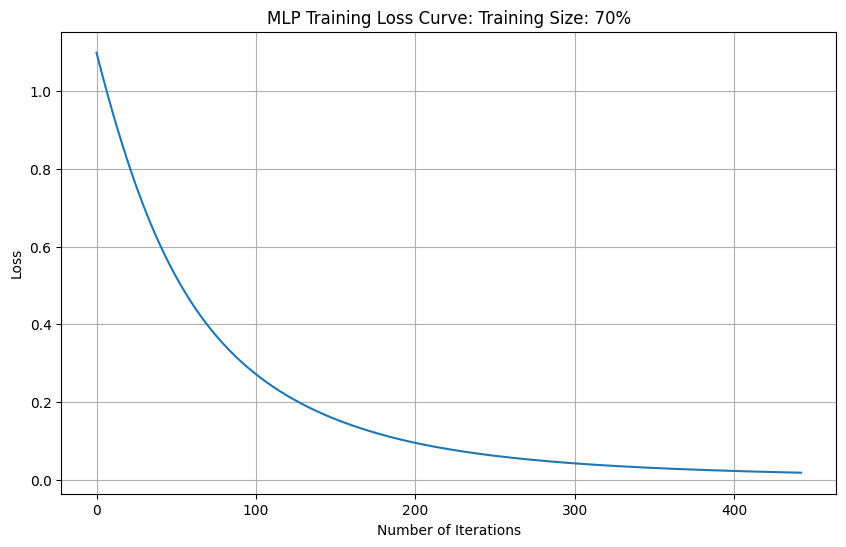

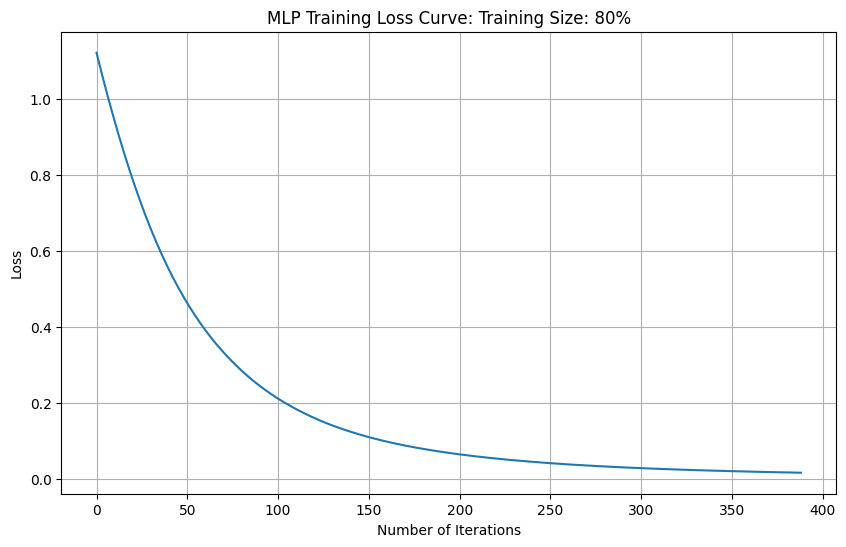

In [ ]:
# Plot training loss curve for each trained MLP model
for model_data in trained_models_mlp_pca:
    model = model_data["Model"]
    training_size = model_data["Training size"]

    plt.figure(figsize=(10, 6))
    plt.plot(model.loss_curve_)
    plt.title(f'MLP Training Loss Curve: Training Size: {training_size}%')
    plt.xlabel('Number of Iterations')
    plt.ylabel('Loss')
    plt.grid(True)
    plt.show()

## Random Forest

### Calculate values for different test size

In [ ]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix, precision_score, recall_score, f1_score
import matplotlib.pyplot as plt
import seaborn as sns

training_sizes = [0.5, 0.6, 0.7, 0.8]

results_rf = []
confusion_matrices_rf = []
trained_models_rf = [] # Add a list to store trained models


for size in training_sizes:
  X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=size, random_state=42)
  rf = RandomForestClassifier(random_state=42)


  rf.fit(X_train, y_train.values.ravel())
  y_pred_test = rf.predict(X_test)
  y_pred_train = rf.predict(X_train)


  acc_test = accuracy_score(y_test, y_pred_test)
  precision_test = precision_score(y_test, y_pred_test, average='weighted', zero_division=0) # Calculate weighted precision, handle zero division
  recall_test = recall_score(y_test, y_pred_test, average='weighted') # Calculate weighted recall
  f1_test = f1_score(y_test, y_pred_test, average='weighted') # Calculate weighted F1-score

  acc_train = accuracy_score(y_train, y_pred_train)
  precision_train = precision_score(y_train, y_pred_train, average='weighted', zero_division=0)
  recall_train = recall_score(y_train, y_pred_train, average='weighted')
  f1_train = f1_score(y_train, y_pred_train, average='weighted')


  cm = confusion_matrix(y_test, y_pred_test) # Calculate confusion matrix

  results_rf.append({
      "Training size":int (size*100),
      "Accuracy":acc_test,
      "Precision": precision_test,
      "Recall": recall_test,
      "F1-score": f1_test
  })

  confusion_matrices_rf.append({ # Store confusion matrix with metadata
      "Training size":int (size*100),
      "Confusion Matrix":cm
  })

  trained_models_rf.append({ # Store the trained model with metadata
      "Training size":int (size*100),
      "Model": rf,
      "X_test": X_test,
      "y_test": y_test
  })

### Print Evalution Table and Graphs

,Training size,Accuracy,Precision,Recall,F1-score
0,50,0.977528,0.978777,0.977528,0.977498
1,60,0.934579,0.934670,0.934579,0.934515
2,70,0.952000,0.952117,0.952000,0.951798
3,80,0.951049,0.952787,0.951049,0.950976


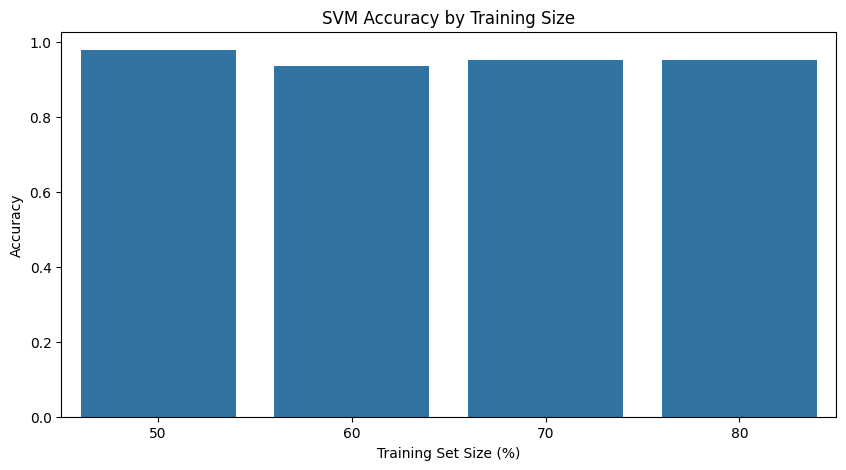

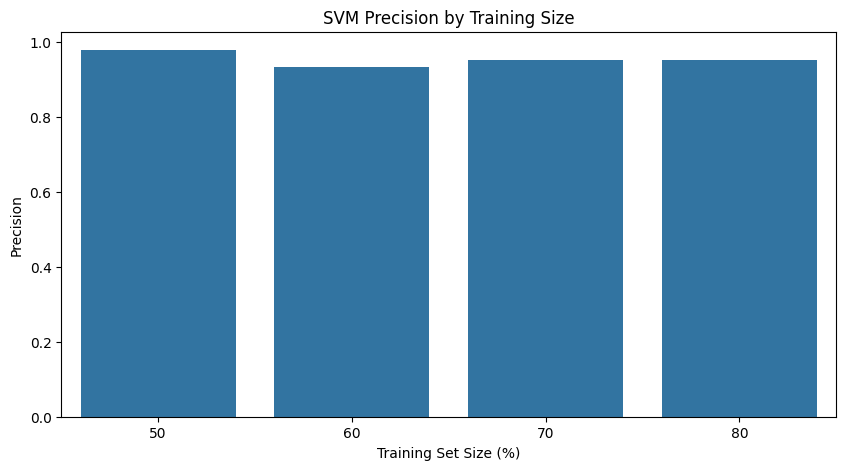

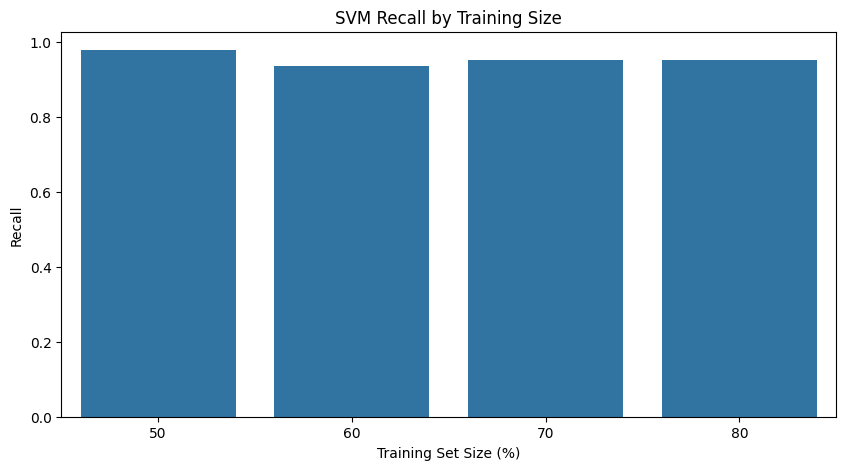

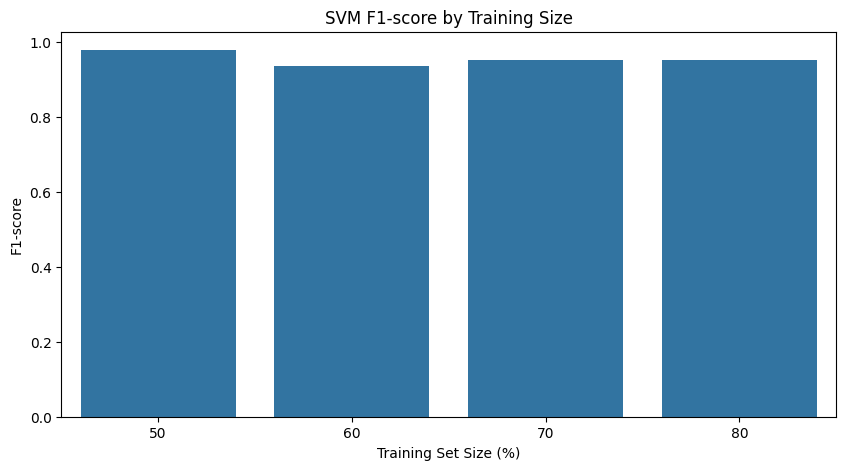

In [ ]:
df = pd.DataFrame(results_rf)
display(df) # Display the DataFrame as a table

# Plot Accuracy
plt.figure(figsize=(10, 5)) # Increase figure size
sns.barplot(data=df, x='Training size', y='Accuracy')
plt.title('SVM Accuracy by Training Size') # Add title
plt.xlabel('Training Set Size (%)') # Add x-axis label
plt.ylabel('Accuracy') # Add y-axis label
plt.show()

# Plot Precision
plt.figure(figsize=(10, 5)) # Increase figure size
sns.barplot(data=df, x='Training size', y='Precision')
plt.title('SVM Precision by Training Size') # Add title
plt.xlabel('Training Set Size (%)') # Add x-axis label
plt.ylabel('Precision') # Add y-axis label
plt.show()

# Plot Recall
plt.figure(figsize=(10, 5)) # Increase figure size
sns.barplot(data=df, x='Training size', y='Recall')
plt.title('SVM Recall by Training Size') # Add title
plt.xlabel('Training Set Size (%)') # Add x-axis label
plt.ylabel('Recall') # Add y-axis label
plt.show()

# Plot F1-score
plt.figure(figsize=(10, 5)) # Increase figure size
sns.barplot(data=df, x='Training size', y='F1-score')
plt.title('SVM F1-score by Training Size') # Add title
plt.xlabel('Training Set Size (%)') # Add x-axis label
plt.ylabel('F1-score') # Add y-axis label
plt.show()

### Show Confusion Matrices

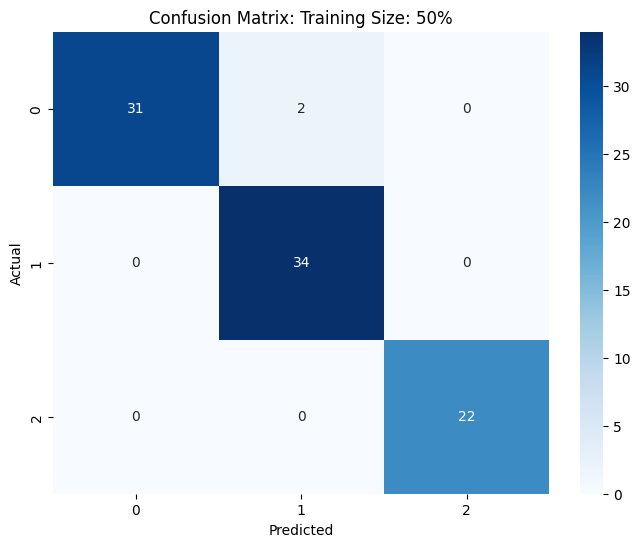

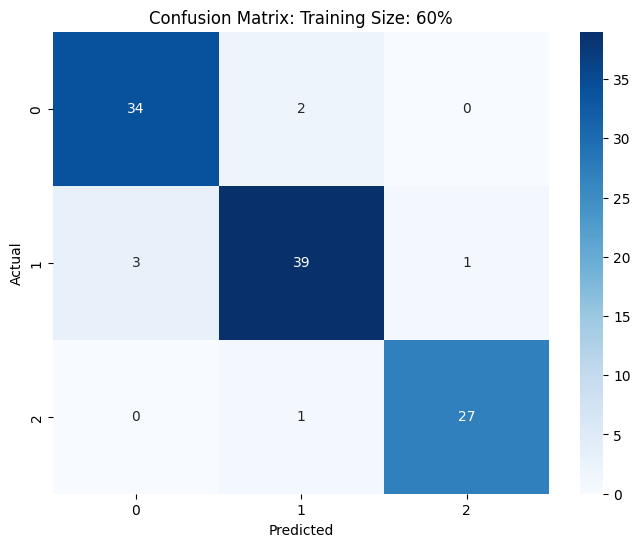

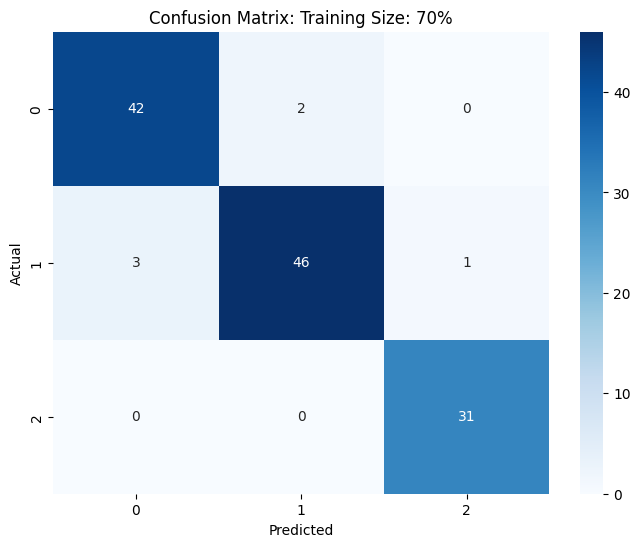

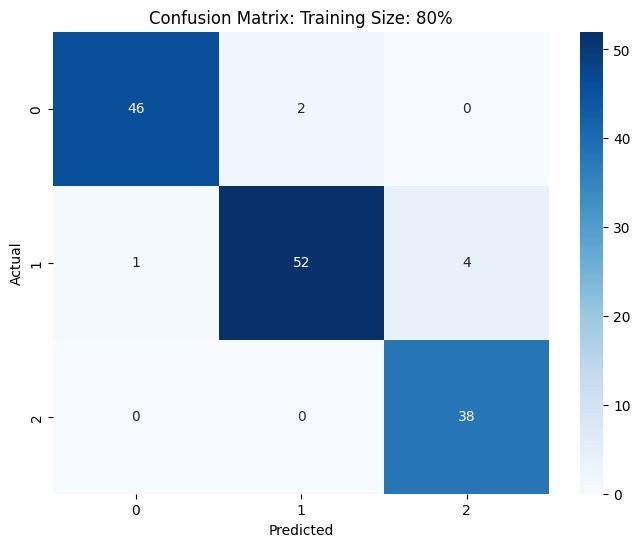

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

for cm_data in confusion_matrices_rf:
    cm = cm_data["Confusion Matrix"]
    training_size = cm_data["Training size"]

    plt.figure(figsize=(8, 6))
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues')
    plt.title(f'Confusion Matrix: Training Size: {training_size}%')
    plt.xlabel('Predicted')
    plt.ylabel('Actual')
    plt.show()

### ROC and AOC curve

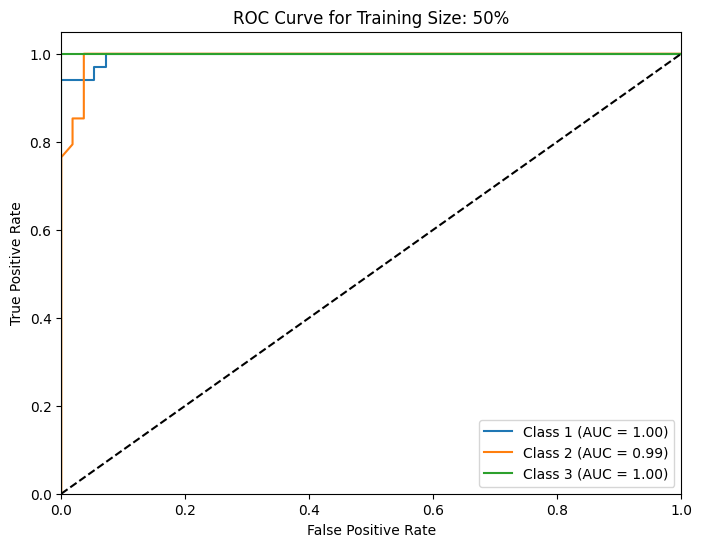

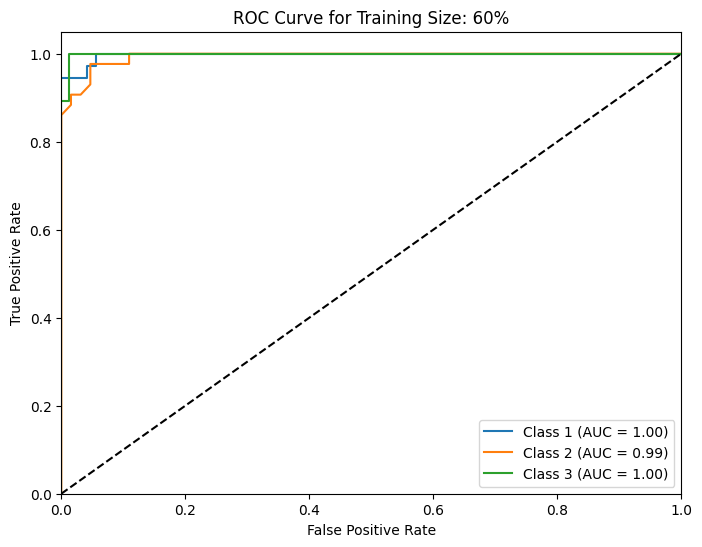

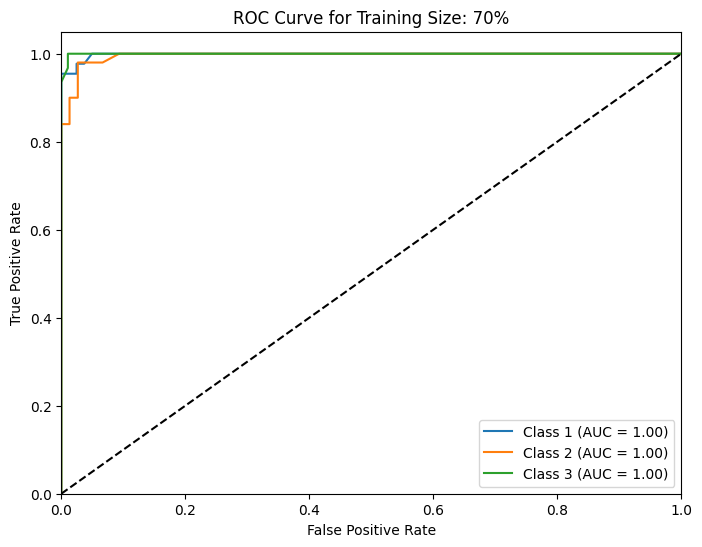

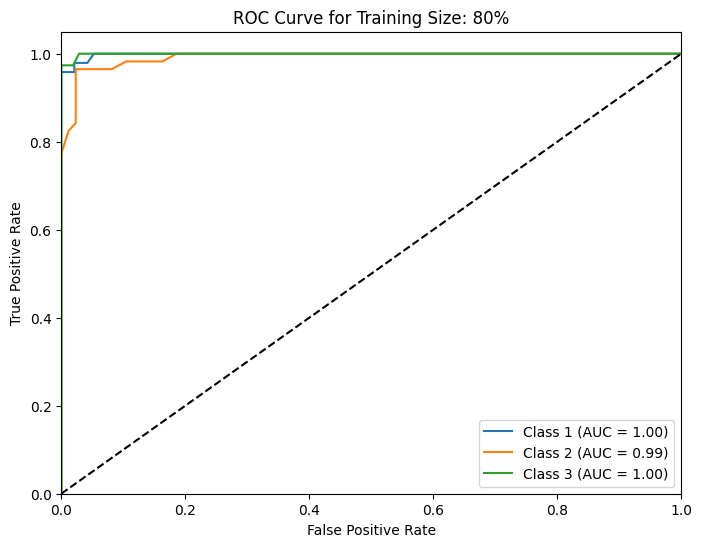

In [ ]:
from sklearn.metrics import roc_curve, auc

# Since this is a multi-class problem, we'll use a One-vs-Rest (OvR) approach for ROC curves
for model_data in trained_models_rf:
    model = model_data["Model"]
    X_test = model_data["X_test"]
    y_test = model_data["y_test"]
    training_size = model_data["Training size"]

    plt.figure(figsize=(8, 6)) # Create a new figure for each plot

    # Get predicted probabilities for each class
    y_prob = model.predict_proba(X_test)

    # Compute ROC curve and AUC for each class using OvR
    fpr = dict()
    tpr = dict()
    roc_auc = dict()
    n_classes = len(np.unique(y_test))

    for i in range(n_classes):
        fpr[i], tpr[i], _ = roc_curve(y_test, y_prob[:, i], pos_label=i+1)
        roc_auc[i] = auc(fpr[i], tpr[i])

    # Plot ROC curve for each class
    for i in range(n_classes):
        plt.plot(fpr[i], tpr[i], label=f'Class {i+1} (AUC = {roc_auc[i]:.2f})')

    plt.plot([0, 1], [0, 1], 'k--') # Plot random chance line
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.05])
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title(f'ROC Curve for Training Size: {training_size}%') # Add title for each plot
    plt.legend(loc="lower right")
    plt.show()

### Random Forest with PCA-Reduced Data

In [ ]:
# Apply the existing PCA transformation to the scaled data
X_pca_reduced_rf = pca.fit_transform(X_scaled)

print(f"\nOriginal number of features: {X.shape[1]}")
print(f"Reduced number of features after PCA: {X_pca_reduced_rf.shape[1]}")
print("\nData after PCA for Random Forest:")
display(pd.DataFrame(X_pca_reduced_rf).head())


Original number of features: 13
Reduced number of features after PCA: 10

Data after PCA for Random Forest:


,0,1,2,3,4,5,6,7,8,9
0,3.316751,1.443463,-0.165739,-0.215631,0.693043,0.223880,0.596427,-0.065139,-0.641443,1.020956
1,2.209465,-0.333393,-2.026457,-0.291358,-0.257655,0.927120,0.053776,-1.024416,0.308847,0.159701
2,2.516740,1.031151,0.982819,0.724902,-0.251033,-0.549276,0.424205,0.344216,1.177834,0.113361
3,3.757066,2.756372,-0.176192,0.567983,-0.311842,-0.114431,-0.383337,-0.643593,-0.052544,0.239413
4,1.008908,0.869831,2.026688,-0.409766,0.298458,0.406520,0.444074,-0.416700,-0.326819,-0.078366


### Calculate Random Forest performance with PCA-Reduced Data for different test sizes

In [ ]:
results_rf_pca = []
confusion_matrices_rf_pca = []


for size in training_sizes:
  X_train_pca_rf, X_test_pca_rf, y_train, y_test = train_test_split(X_pca_reduced_rf, y, test_size=size, random_state=42)
  rf_pca = RandomForestClassifier(random_state=42)

  rf_pca.fit(X_train_pca_rf, y_train.values.ravel())
  y_pred_pca_rf = rf_pca.predict(X_test_pca_rf)

  acc_pca_rf = accuracy_score(y_test, y_pred_pca_rf)
  precision_pca_rf = precision_score(y_test, y_pred_pca_rf, average='weighted', zero_division=0)
  recall_pca_rf = recall_score(y_test, y_pred_pca_rf, average='weighted')
  f1_pca_rf = f1_score(y_test, y_pred_pca_rf, average='weighted')

  cm_pca_rf = confusion_matrix(y_test, y_pred_pca_rf)

  results_rf_pca.append({
      "Training size":int (size*100),
      "Accuracy":acc_pca_rf,
      "Precision": precision_pca_rf,
      "Recall": recall_pca_rf,
      "F1-score": f1_pca_rf
  })

  confusion_matrices_rf_pca.append({
      "Training size":int (size*100),
      "Confusion Matrix":cm_pca_rf
  })



### Print Random Forest Performance Table and Graphs with PCA-Reduced Data

,Training size,Accuracy,Precision,Recall,F1-score
0,50,0.966292,0.966583,0.966292,0.966277
1,60,0.962617,0.963637,0.962617,0.962677
2,70,0.952000,0.951878,0.952000,0.951834
3,80,0.944056,0.943992,0.944056,0.943736


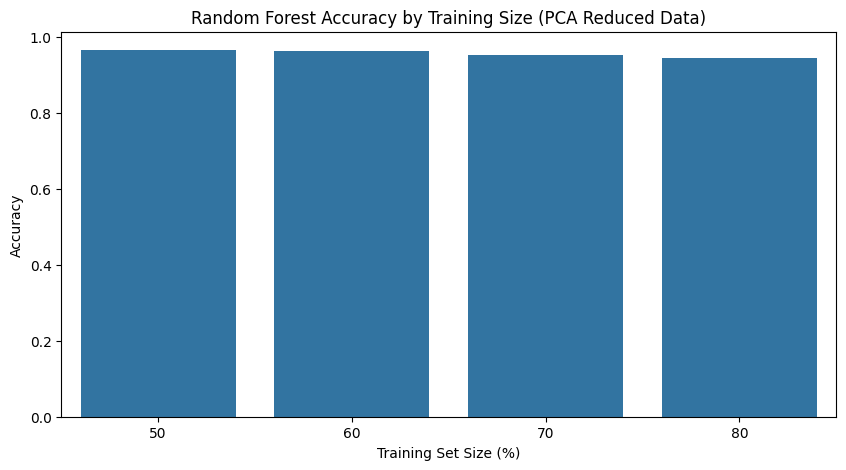

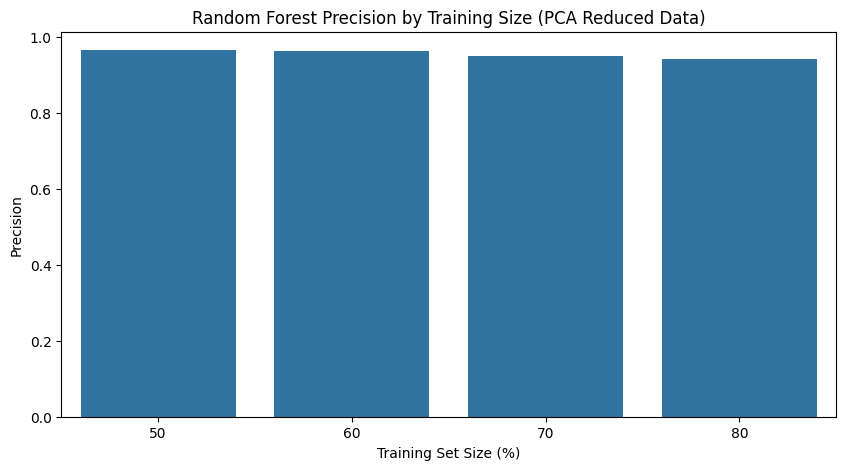

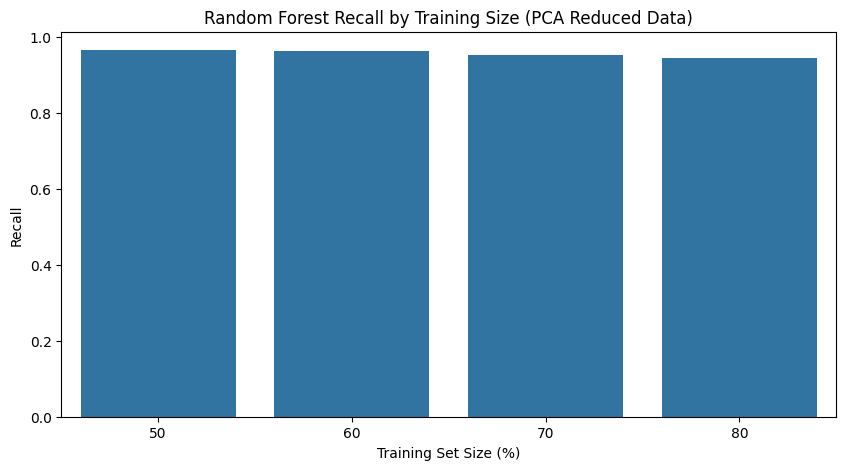

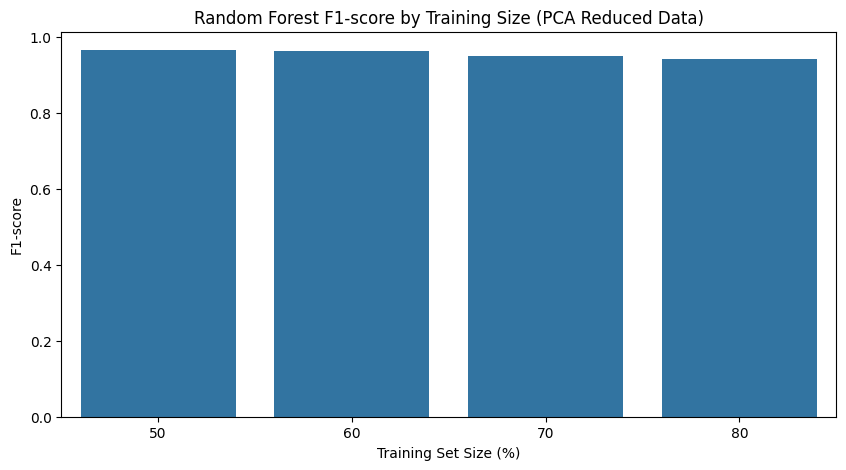

In [ ]:
df_rf_pca = pd.DataFrame(results_rf_pca)
display(df_rf_pca)

# Plot Accuracy
plt.figure(figsize=(10, 5))
sns.barplot(data=df_rf_pca, x='Training size', y='Accuracy')
plt.title('Random Forest Accuracy by Training Size (PCA Reduced Data)')
plt.xlabel('Training Set Size (%)')
plt.ylabel('Accuracy')
plt.show()

# Plot Precision
plt.figure(figsize=(10, 5))
sns.barplot(data=df_rf_pca, x='Training size', y='Precision')
plt.title('Random Forest Precision by Training Size (PCA Reduced Data)')
plt.xlabel('Training Set Size (%)')
plt.ylabel('Precision')
plt.show()

# Plot Recall
plt.figure(figsize=(10, 5))
sns.barplot(data=df_rf_pca, x='Training size', y='Recall')
plt.title('Random Forest Recall by Training Size (PCA Reduced Data)')
plt.xlabel('Training Set Size (%)')
plt.ylabel('Recall')
plt.show()

# Plot F1-score
plt.figure(figsize=(10, 5))
sns.barplot(data=df_rf_pca, x='Training size', y='F1-score')
plt.title('Random Forest F1-score by Training Size (PCA Reduced Data)')
plt.xlabel('Training Set Size (%)')
plt.ylabel('F1-score')
plt.show()



### Show Confusion Matrices for Random Forest with PCA-Reduced Data

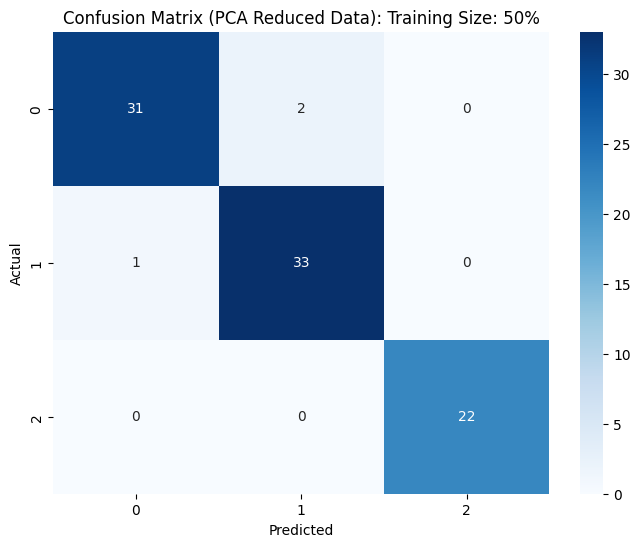

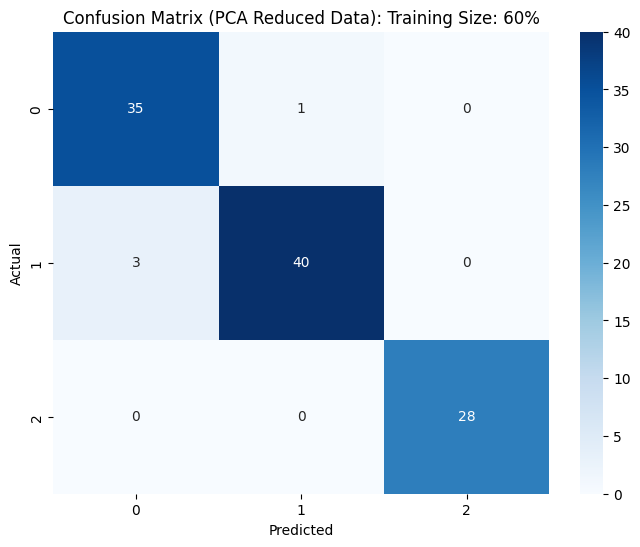

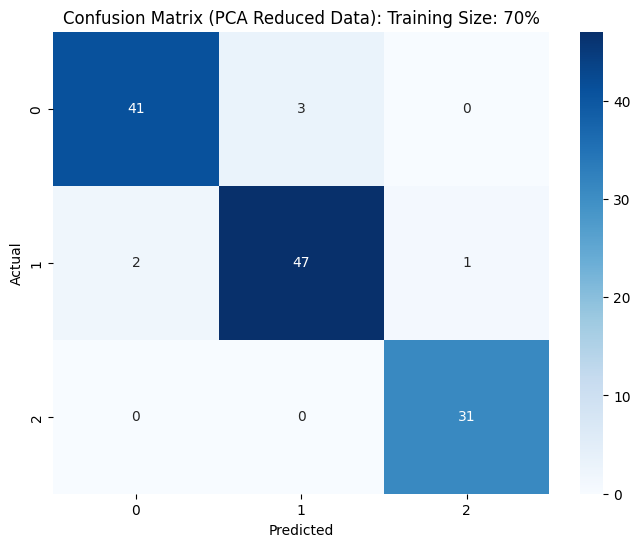

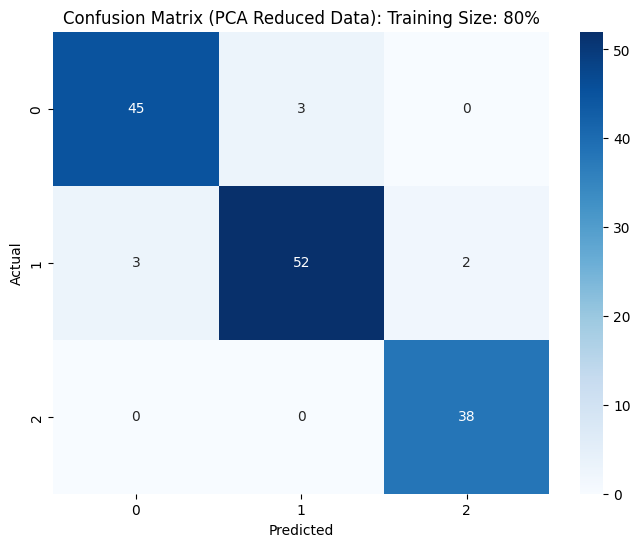

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

for cm_data in confusion_matrices_rf_pca:
    cm = cm_data["Confusion Matrix"]
    training_size = cm_data["Training size"]

    plt.figure(figsize=(8, 6))
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues')
    plt.title(f'Confusion Matrix (PCA Reduced Data): Training Size: {training_size}%')
    plt.xlabel('Predicted')
    plt.ylabel('Actual')
    plt.show()

# Hand Written Digit Dataset

## Prepare Dataset

In [ ]:
from ucimlrepo import fetch_ucirepo

# fetch dataset
digits = fetch_ucirepo(id=80)

In [ ]:
X = digits.data.features
y = digits.data.targets

In [ ]:
X

,Attribute1,Attribute2,Attribute3,Attribute4,Attribute5,Attribute6,Attribute7,Attribute8,Attribute9,Attribute10,...,Attribute55,Attribute56,Attribute57,Attribute58,Attribute59,Attribute60,Attribute61,Attribute62,Attribute63,Attribute64
0,0,1,6,15,12,1,0,0,0,7,...,0,0,0,0,6,14,7,1,0,0
1,0,0,10,16,6,0,0,0,0,7,...,3,0,0,0,10,16,15,3,0,0
2,0,0,8,15,16,13,0,0,0,1,...,0,0,0,0,9,14,0,0,0,0
3,0,0,0,3,11,16,0,0,0,0,...,0,0,0,0,0,1,15,2,0,0
4,0,0,5,14,4,0,0,0,0,0,...,12,0,0,0,4,12,14,7,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5615,0,0,4,10,13,6,0,0,0,1,...,4,0,0,0,2,14,15,9,0,0
5616,0,0,6,16,13,11,1,0,0,0,...,1,0,0,0,6,16,14,6,0,0
5617,0,0,1,11,15,1,0,0,0,0,...,0,0,0,0,2,9,13,6,0,0
5618,0,0,2,10,7,0,0,0,0,0,...,2,0,0,0,5,12,16,12,0,0


In [ ]:
y

,class
0,0
1,0
2,7
3,4
4,6
...,...
5615,9
5616,0
5617,8
5618,9


## Principal Component Analysis (PCA)

Explained variance ratio by each component: [1.16058580e-01 1.01701536e-01 7.80219607e-02 5.83857531e-02
 4.87287824e-02 4.44316461e-02 3.85877681e-02 3.39688103e-02
 2.84702728e-02 2.66407663e-02 2.57952555e-02 2.39640483e-02
 2.29641894e-02 2.09663662e-02 1.98540773e-02 1.92591302e-02
 1.83958755e-02 1.79110669e-02 1.61101921e-02 1.53670187e-02
 1.44033255e-02 1.35133284e-02 1.26344227e-02 1.13733091e-02
 1.02700335e-02 1.01363699e-02 9.84299671e-03 9.24277181e-03
 8.78744597e-03 8.23774719e-03 8.05148259e-03 7.30720466e-03
 7.12056062e-03 6.30496265e-03 6.16040321e-03 6.03570820e-03
 5.55208908e-03 5.13331216e-03 4.94934613e-03 4.52420547e-03
 4.38713196e-03 4.10618712e-03 3.93404572e-03 3.51002669e-03
 3.44296187e-03 3.27169186e-03 3.15703391e-03 2.87722127e-03
 2.65990842e-03 2.60422421e-03 2.50353416e-03 2.41975789e-03
 2.21433164e-03 2.06632155e-03 1.89531541e-03 1.84897966e-03
 1.67357847e-03 1.57841578e-03 1.43360959e-03 1.26219371e-03
 1.04637788e-03 9.43029486e-04 1.47912361

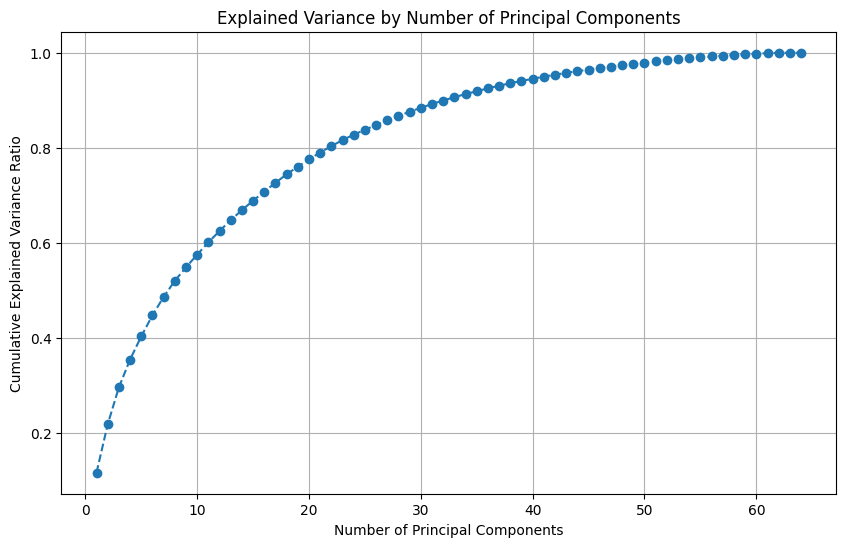

In [ ]:
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA

# Standardize the data before applying PCA
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

# Apply PCA
pca = PCA()
X_pca = pca.fit_transform(X_scaled)

# Explained variance ratio
explained_variance_ratio = pca.explained_variance_ratio_
print("Explained variance ratio by each component:", explained_variance_ratio)

# Cumulative explained variance
cumulative_explained_variance = np.cumsum(explained_variance_ratio)
print("Cumulative explained variance:", cumulative_explained_variance)

# Plot explained variance
plt.figure(figsize=(10, 6))
plt.plot(range(1, len(explained_variance_ratio) + 1), cumulative_explained_variance, marker='o', linestyle='--')
plt.title('Explained Variance by Number of Principal Components')
plt.xlabel('Number of Principal Components')
plt.ylabel('Cumulative Explained Variance Ratio')
plt.grid(True)
plt.show()

Based on the cumulative explained variance plot, you can decide how many principal components to retain to capture a desired amount of variance. For example, to retain 95% of the variance, you would choose the number of components where the cumulative explained variance is close to 0.95.

Let's apply PCA with a chosen number of components (e.g., based on the plot).

In [ ]:
# Choose the number of components (e.g., to retain 95% variance)
# Based on the plot, let's assume we choose 10 components to retain most of the variance
n_components = 50 # You can change this based on your analysis of the plot

pca = PCA(n_components=n_components)
X_pca_reduced = pca.fit_transform(X_scaled)

print(f"\nOriginal number of features: {X.shape[1]}")
print(f"Reduced number of features after PCA: {X_pca_reduced.shape[1]}")
print("\nData after PCA:")
display(pd.DataFrame(X_pca_reduced).head())


Original number of features: 64
Reduced number of features after PCA: 50

Data after PCA:


,0,1,2,3,4,5,6,7,8,9,...,40,41,42,43,44,45,46,47,48,49
0,-0.296633,-1.446450,-3.863044,-3.223597,0.773631,0.631849,0.163733,0.474708,-1.085103,-0.027994,...,0.517559,0.494320,0.042024,-0.919845,-0.181330,-0.604761,0.116663,-0.247460,0.112606,-0.090206
1,-0.156717,-3.065688,-5.811656,-3.232099,1.064670,0.031353,0.270302,2.091832,-1.487364,-0.998295,...,0.754699,-0.204192,-0.292517,-0.300754,-0.441550,-0.082849,0.587194,0.018828,0.014534,0.211886
2,-0.753929,3.261949,0.779656,-1.108976,0.311024,-0.814548,-4.307315,0.841364,-1.166513,-0.126725,...,-0.572788,-0.060109,0.004906,0.315338,0.331871,0.927054,-0.313190,-0.748029,-0.148217,-0.039561
3,-4.226579,1.900320,-0.441486,1.329548,-0.149220,2.710149,2.128209,0.206327,-1.659819,0.573584,...,0.943616,-0.845965,-0.179062,0.466753,0.564706,0.060870,0.027984,0.323670,-0.110900,-1.064628
4,0.582983,-3.490539,-1.602212,-1.052587,-1.360737,0.406474,-0.662578,-2.572619,0.341349,0.066232,...,0.094542,0.086006,0.098118,0.760049,-0.532223,0.368102,0.162075,0.593148,-0.220887,-0.314977


## SVM

### Different SVM models

In [ ]:
from sklearn.svm import SVC
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix, precision_score, recall_score, f1_score
import matplotlib.pyplot as plt
import seaborn as sns


training_sizes = [0.5, 0.6, 0.7, 0.8]
kernels = {
    'linear': 'linear',
    'polynomial': 'poly',
    'gaussian': 'rbf',
    'sigmoid': 'sigmoid'
}

### Calculate values for different test size

In [ ]:
results = []
confusion_matrices = []
trained_models = [] # Add a list to store trained models

for kernel_name, kernel in kernels.items():
  for size in training_sizes:
   X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=size, random_state=42)
   svc = SVC(kernel=kernel, probability=True, random_state=42) # Add probability=True
   svc.fit(X_train, y_train.values.ravel())
   y_pred = svc.predict(X_test)

   acc = accuracy_score(y_test, y_pred)
   precision = precision_score(y_test, y_pred, average='weighted', zero_division=0) # Calculate weighted precision, handle zero division
   recall = recall_score(y_test, y_pred, average='weighted') # Calculate weighted recall
   f1 = f1_score(y_test, y_pred, average='weighted') # Calculate weighted F1-score


   cm = confusion_matrix(y_test, y_pred) # Calculate confusion matrix

   results.append({
       "Training size":int (size*100),
       "Accuracy":acc,
       "Precision": precision,
       "Recall": recall,
       "F1-score": f1,
       "Kernel":kernel_name
   })
   confusion_matrices.append({ # Store confusion matrix with metadata
       "Training size":int (size*100),
       "Kernel":kernel_name,
       "Confusion Matrix":cm
   })
   trained_models.append({ # Store the trained model with metadata
       "Training size":int (size*100),
       "Kernel":kernel_name,
       "Model": svc,
       "X_test": X_test,
       "y_test": y_test
   })

### Print Evalution Table and Graphs

,Training size,Accuracy,Precision,Recall,F1-score,Kernel
0,50,0.972954,0.973049,0.972954,0.972962,linear
1,60,0.974792,0.974869,0.974792,0.974799,linear
2,70,0.971530,0.971745,0.971530,0.971538,linear
3,80,0.968194,0.968383,0.968194,0.968173,linear
4,50,0.985053,0.985087,0.985053,0.985055,polynomial
5,60,0.986655,0.986672,0.986655,0.986647,polynomial
6,70,0.985765,0.985794,0.985765,0.985765,polynomial
7,80,0.979760,0.979809,0.979760,0.979765,polynomial
8,50,0.986121,0.986187,0.986121,0.986130,gaussian
9,60,0.983096,0.983148,0.983096,0.983091,gaussian


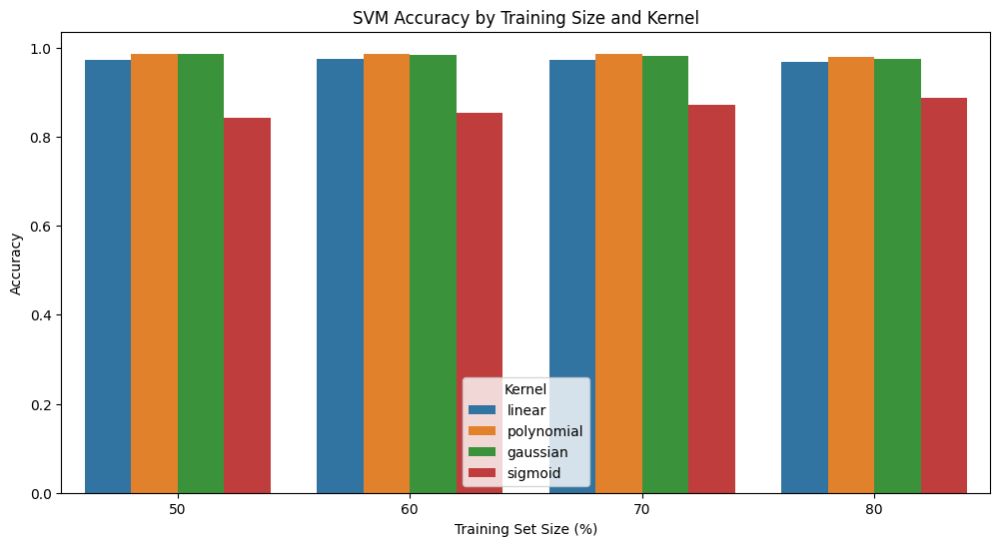

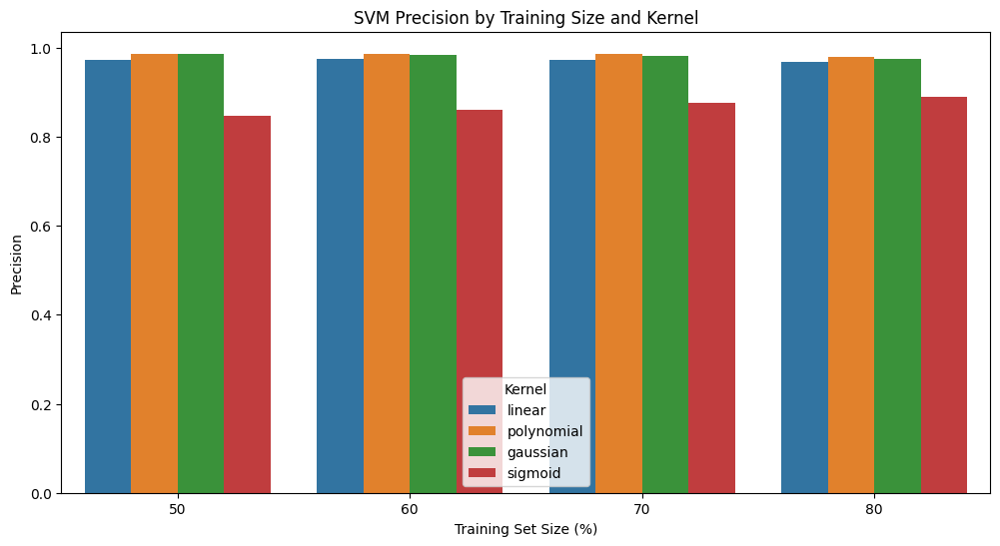

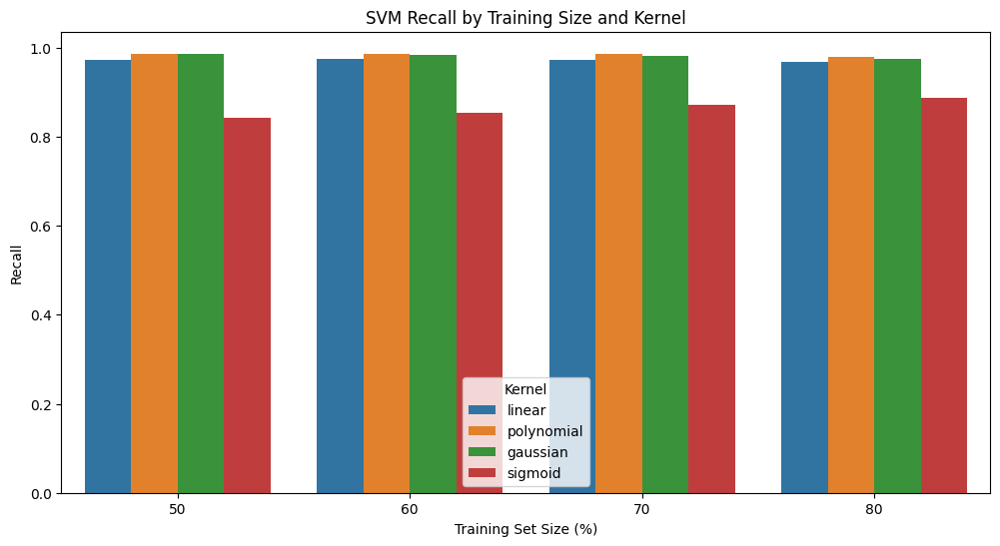

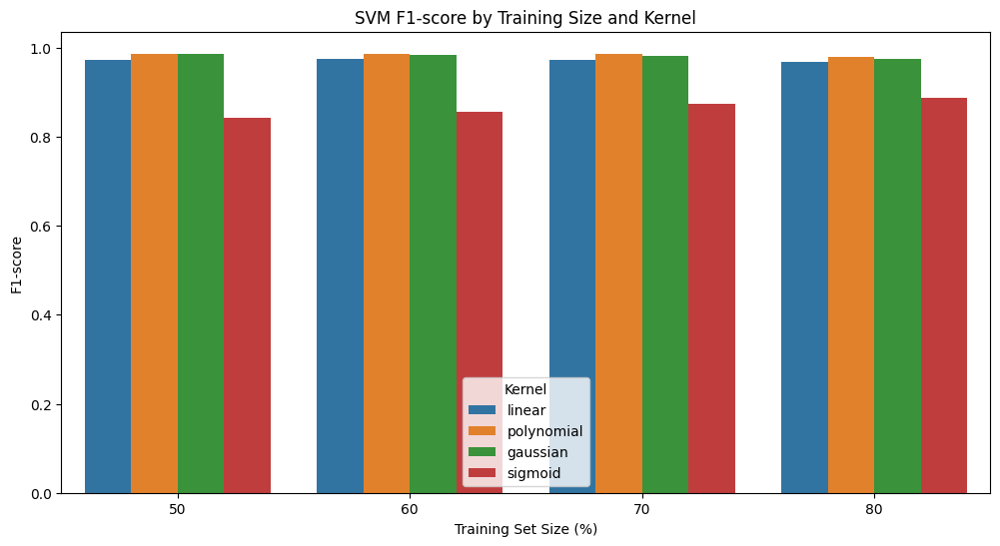

In [ ]:
df = pd.DataFrame(results)
display(df) # Display the DataFrame as a table

# Plot Accuracy
plt.figure(figsize=(12, 6)) # Increase figure size
sns.barplot(data=df, x='Training size', y='Accuracy', hue='Kernel')
plt.title('SVM Accuracy by Training Size and Kernel') # Add title
plt.xlabel('Training Set Size (%)') # Add x-axis label
plt.ylabel('Accuracy') # Add y-axis label
plt.show()

# Plot Precision
plt.figure(figsize=(12, 6)) # Increase figure size
sns.barplot(data=df, x='Training size', y='Precision', hue='Kernel')
plt.title('SVM Precision by Training Size and Kernel') # Add title
plt.xlabel('Training Set Size (%)') # Add x-axis label
plt.ylabel('Precision') # Add y-axis label
plt.show()

# Plot Recall
plt.figure(figsize=(12, 6)) # Increase figure size
sns.barplot(data=df, x='Training size', y='Recall', hue='Kernel')
plt.title('SVM Recall by Training Size and Kernel') # Add title
plt.xlabel('Training Set Size (%)') # Add x-axis label
plt.ylabel('Recall') # Add y-axis label
plt.show()

# Plot F1-score
plt.figure(figsize=(12, 6)) # Increase figure size
sns.barplot(data=df, x='Training size', y='F1-score', hue='Kernel')
plt.title('SVM F1-score by Training Size and Kernel') # Add title
plt.xlabel('Training Set Size (%)') # Add x-axis label
plt.ylabel('F1-score') # Add y-axis label
plt.show()

### Show Confusion Matrices

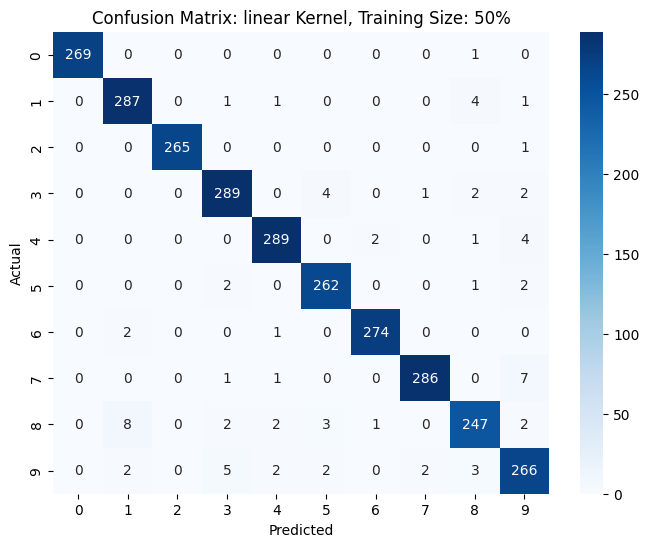

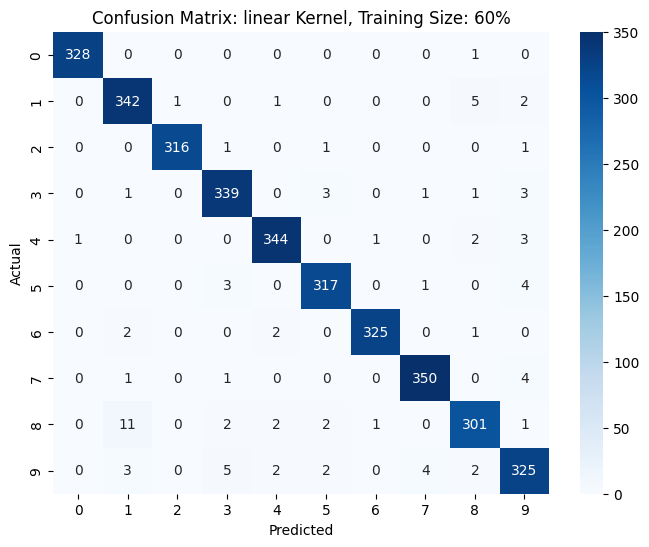

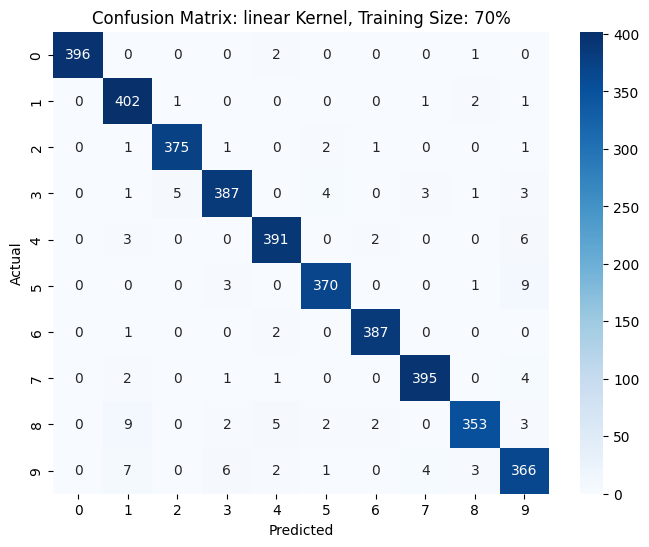

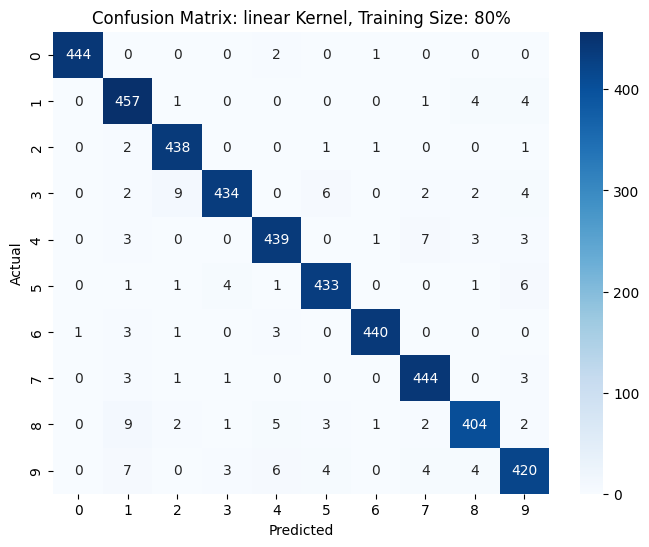

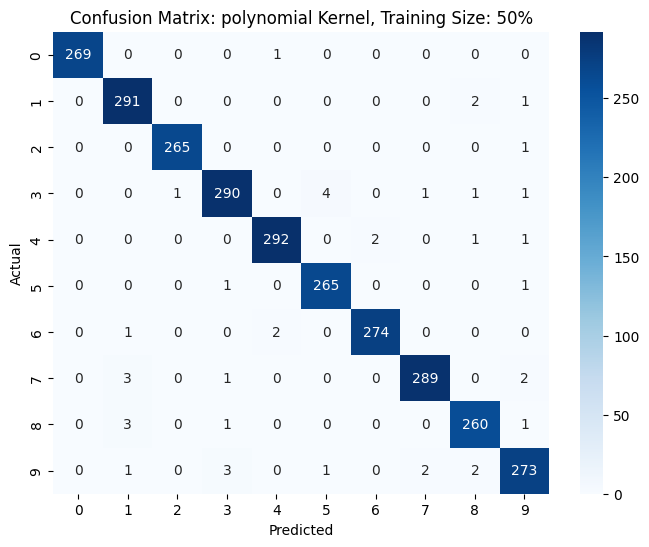

...

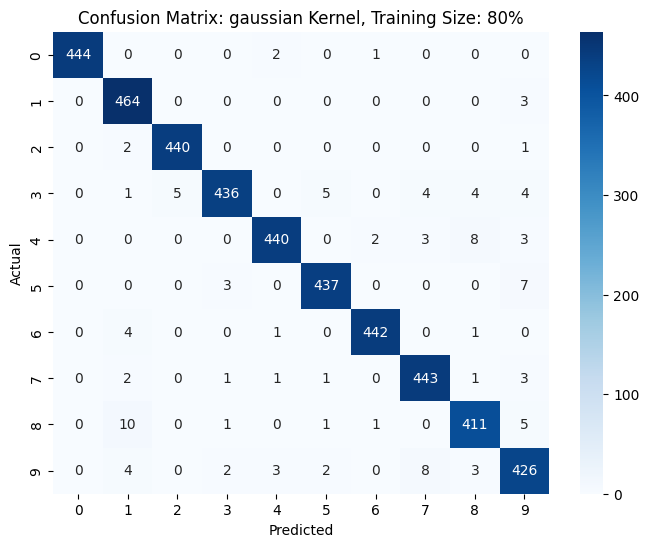

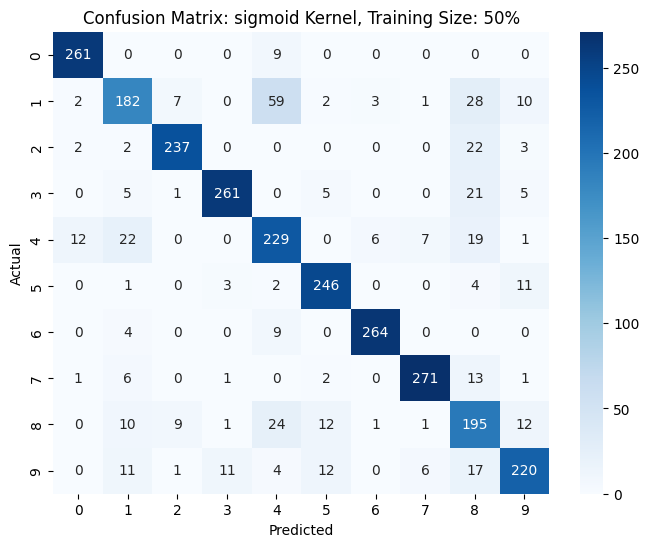

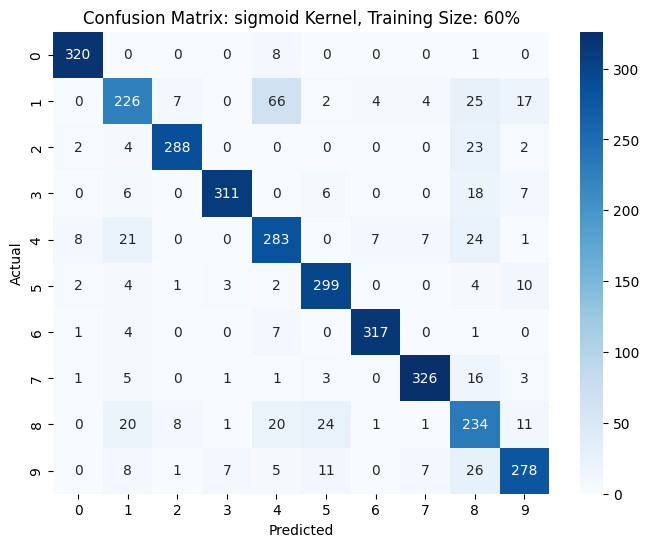

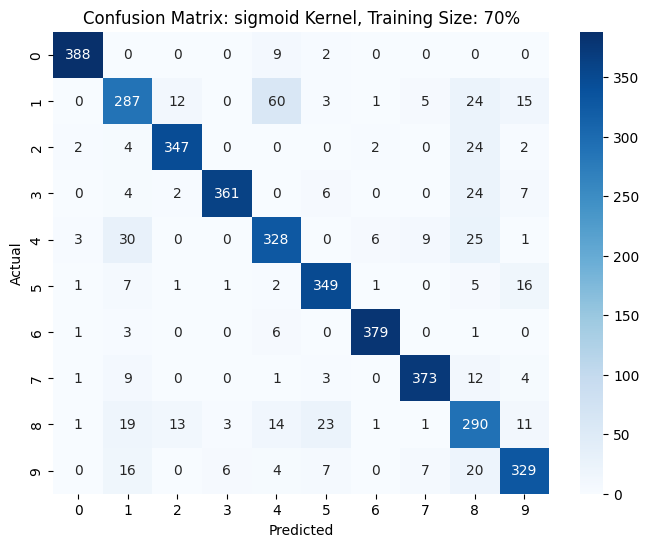

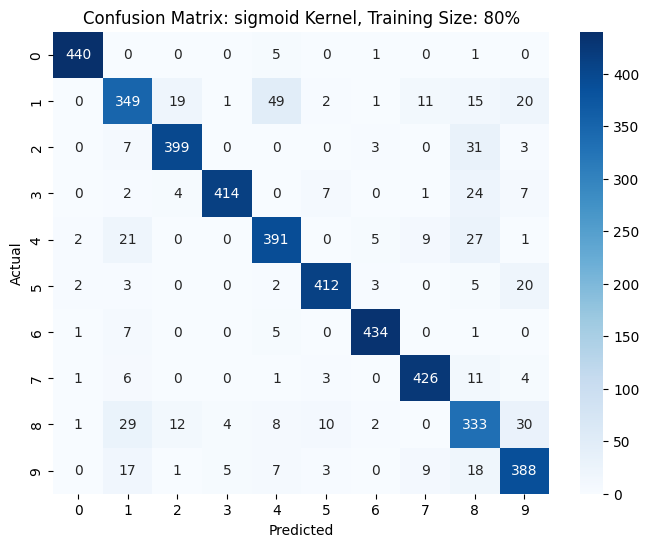

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

for cm_data in confusion_matrices:
    cm = cm_data["Confusion Matrix"]
    kernel_name = cm_data["Kernel"]
    training_size = cm_data["Training size"]

    plt.figure(figsize=(8, 6))
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues')
    plt.title(f'Confusion Matrix: {kernel_name} Kernel, Training Size: {training_size}%')
    plt.xlabel('Predicted')
    plt.ylabel('Actual')
    plt.show()

### ROC and AOC curve

/usr/local/lib/python3.12/dist-packages/sklearn/metrics/_ranking.py:1188: UndefinedMetricWarning: No positive samples in y_true, true positive value should be meaningless
  warnings.warn(


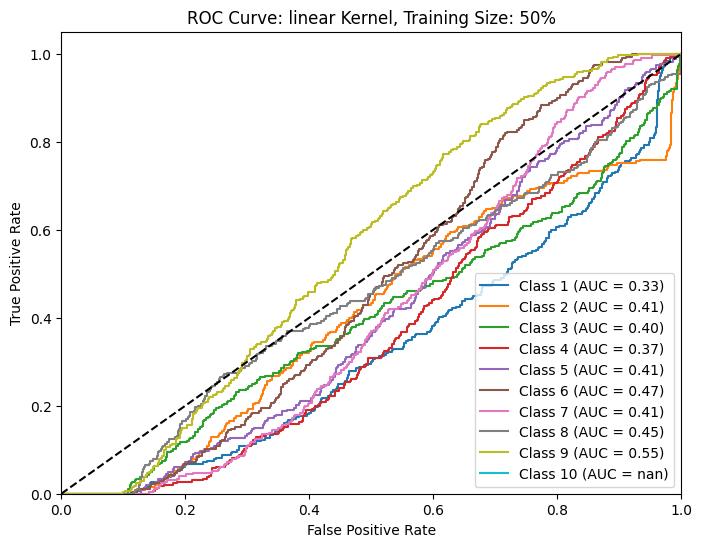

/usr/local/lib/python3.12/dist-packages/sklearn/metrics/_ranking.py:1188: UndefinedMetricWarning: No positive samples in y_true, true positive value should be meaningless
  warnings.warn(


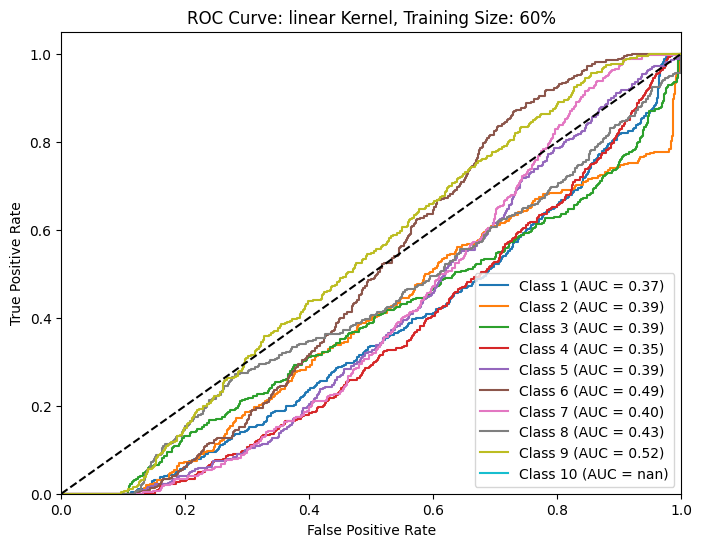

/usr/local/lib/python3.12/dist-packages/sklearn/metrics/_ranking.py:1188: UndefinedMetricWarning: No positive samples in y_true, true positive value should be meaningless
  warnings.warn(


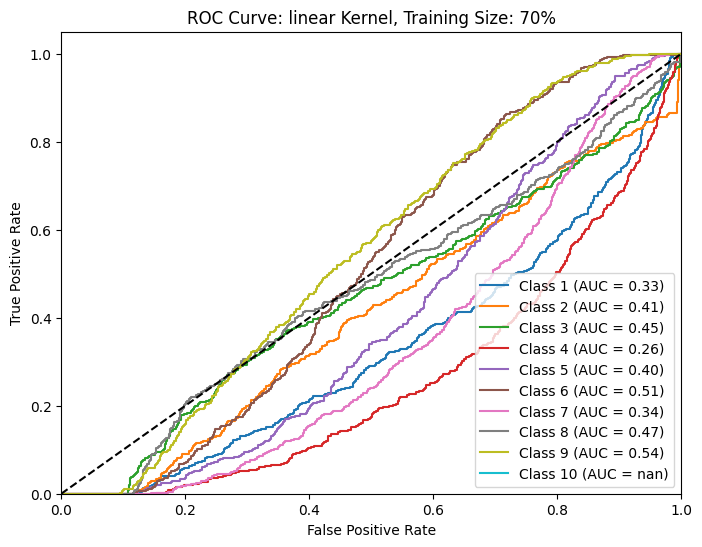

/usr/local/lib/python3.12/dist-packages/sklearn/metrics/_ranking.py:1188: UndefinedMetricWarning: No positive samples in y_true, true positive value should be meaningless
  warnings.warn(


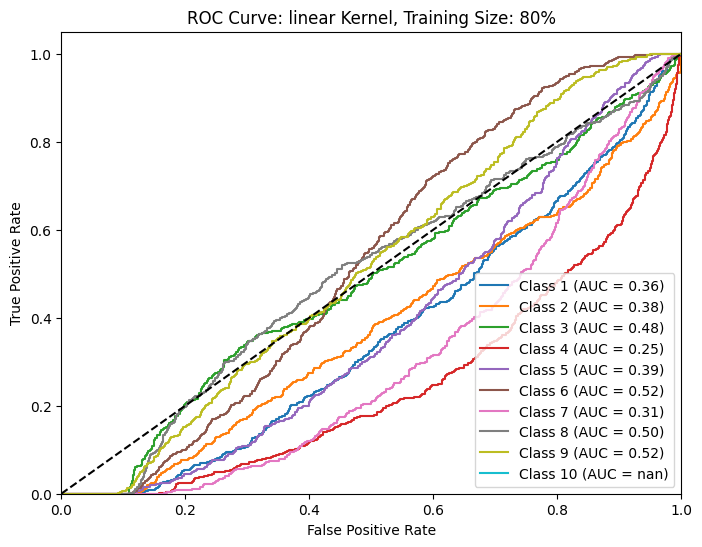

/usr/local/lib/python3.12/dist-packages/sklearn/metrics/_ranking.py:1188: UndefinedMetricWarning: No positive samples in y_true, true positive value should be meaningless
  warnings.warn(


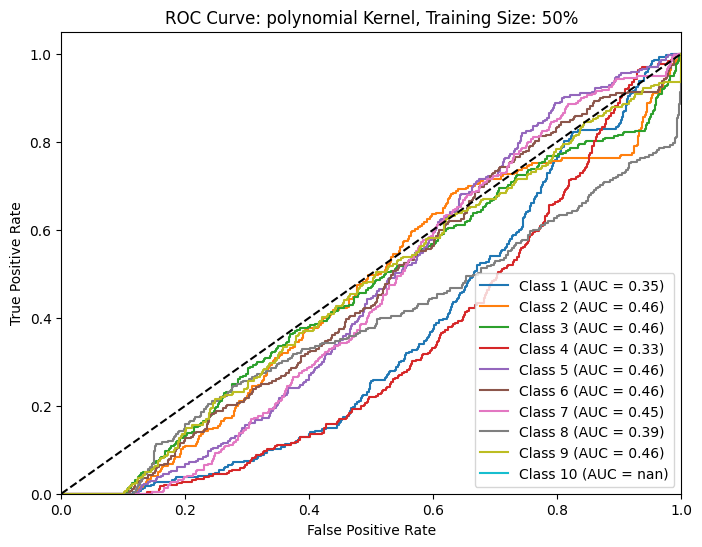

/usr/local/lib/python3.12/dist-packages/sklearn/metrics/_ranking.py:1188: UndefinedMetricWarning: No positive samples in y_true, true positive value should be meaningless
  warnings.warn(


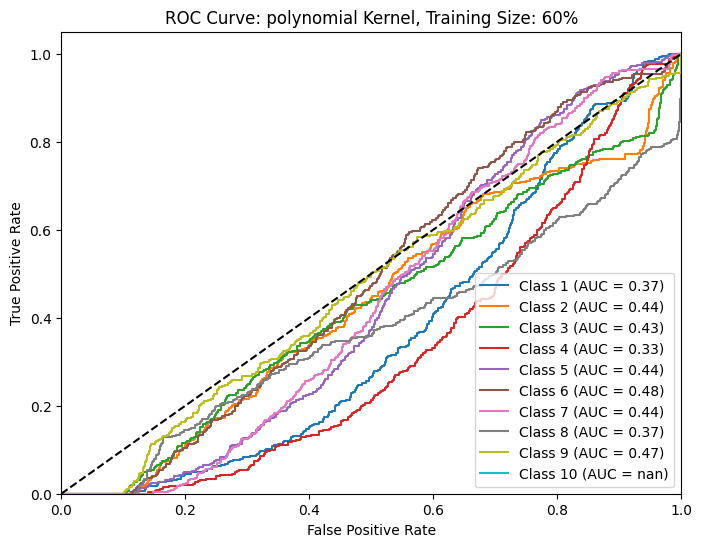

/usr/local/lib/python3.12/dist-packages/sklearn/metrics/_ranking.py:1188: UndefinedMetricWarning: No positive samples in y_true, true positive value should be meaningless
  warnings.warn(


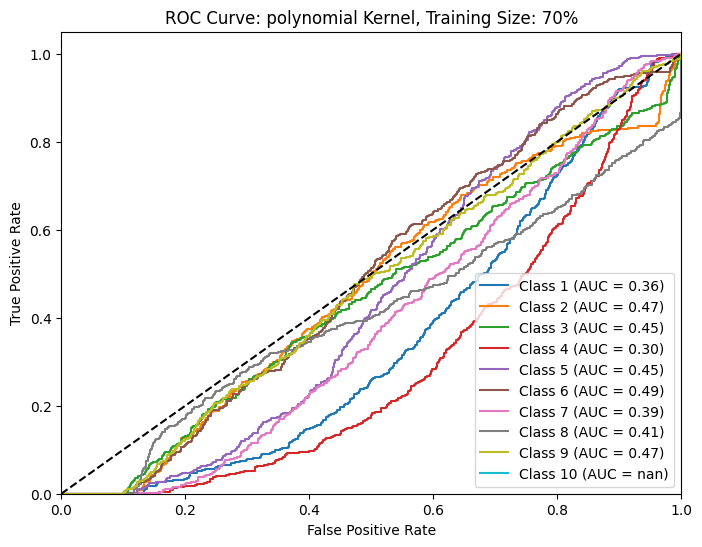

/usr/local/lib/python3.12/dist-packages/sklearn/metrics/_ranking.py:1188: UndefinedMetricWarning: No positive samples in y_true, true positive value should be meaningless
  warnings.warn(


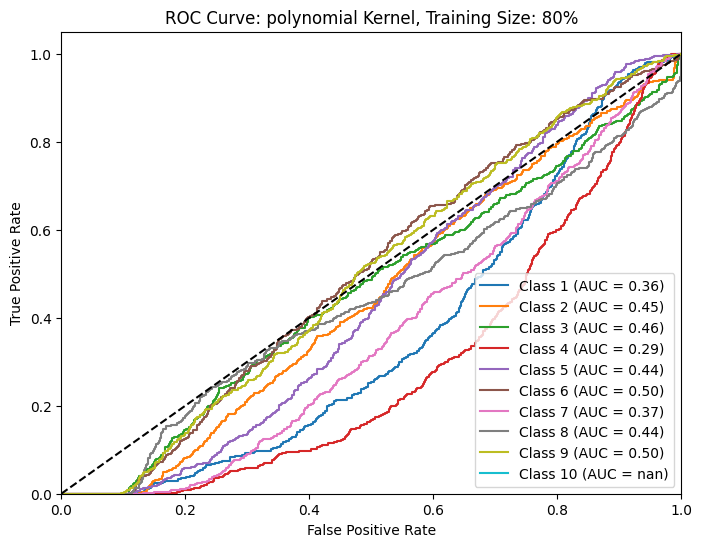

/usr/local/lib/python3.12/dist-packages/sklearn/metrics/_ranking.py:1188: UndefinedMetricWarning: No positive samples in y_true, true positive value should be meaningless
  warnings.warn(


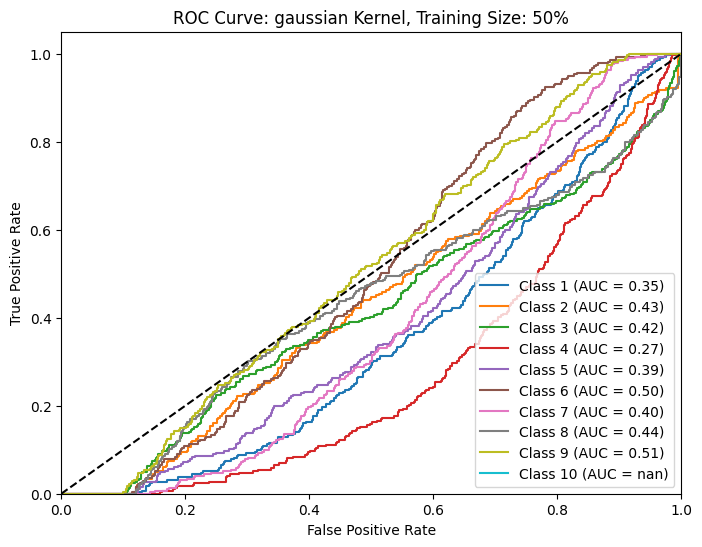

/usr/local/lib/python3.12/dist-packages/sklearn/metrics/_ranking.py:1188: UndefinedMetricWarning: No positive samples in y_true, true positive value should be meaningless
  warnings.warn(


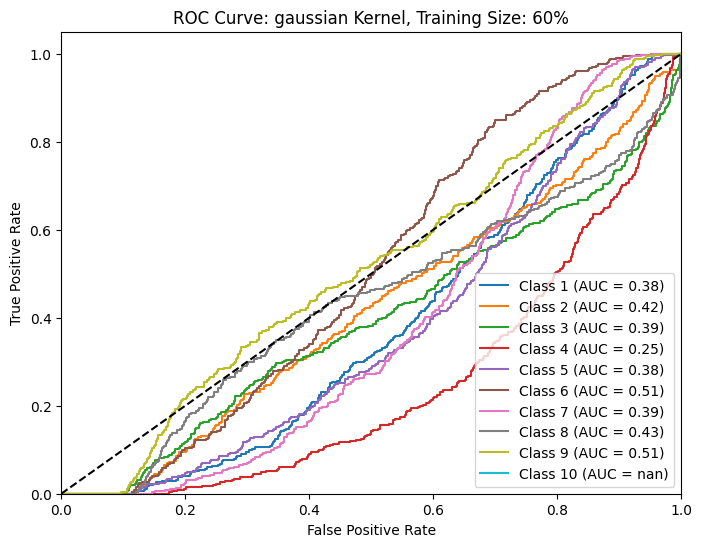

/usr/local/lib/python3.12/dist-packages/sklearn/metrics/_ranking.py:1188: UndefinedMetricWarning: No positive samples in y_true, true positive value should be meaningless
  warnings.warn(


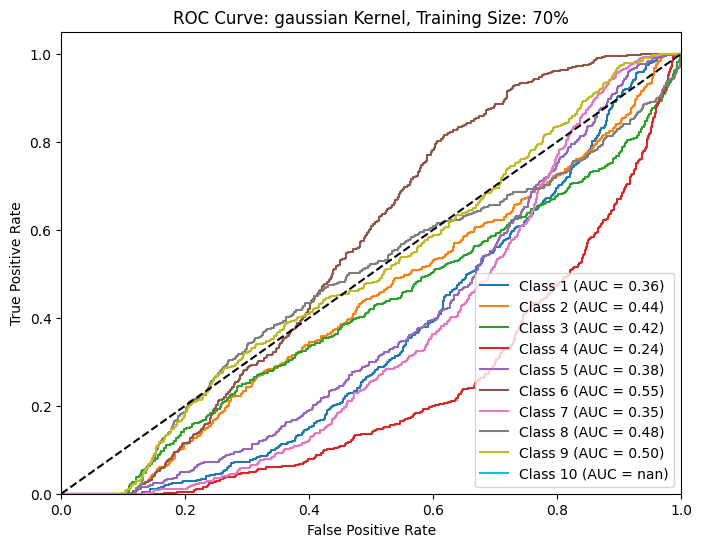

/usr/local/lib/python3.12/dist-packages/sklearn/metrics/_ranking.py:1188: UndefinedMetricWarning: No positive samples in y_true, true positive value should be meaningless
  warnings.warn(


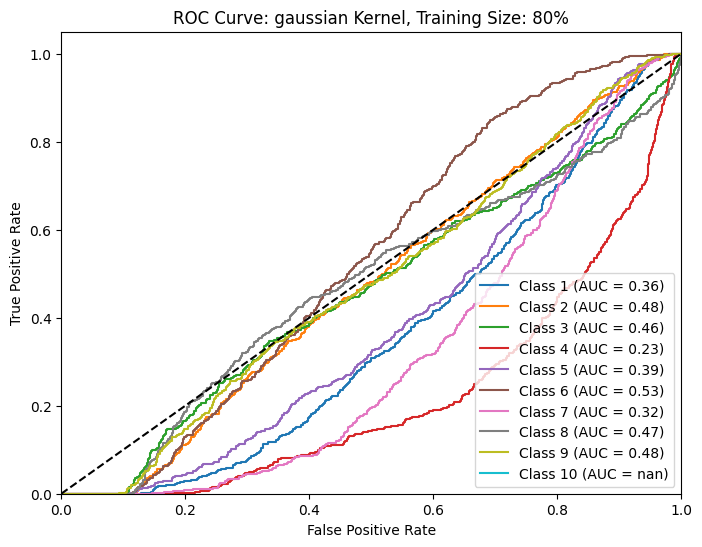

/usr/local/lib/python3.12/dist-packages/sklearn/metrics/_ranking.py:1188: UndefinedMetricWarning: No positive samples in y_true, true positive value should be meaningless
  warnings.warn(


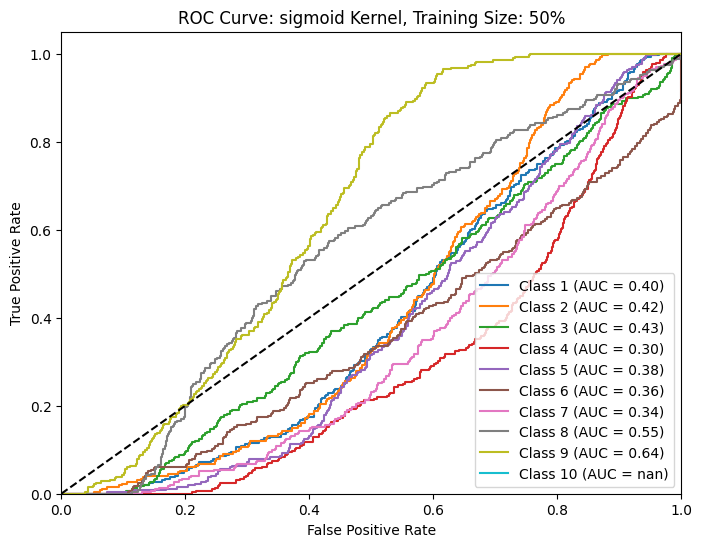

/usr/local/lib/python3.12/dist-packages/sklearn/metrics/_ranking.py:1188: UndefinedMetricWarning: No positive samples in y_true, true positive value should be meaningless
  warnings.warn(


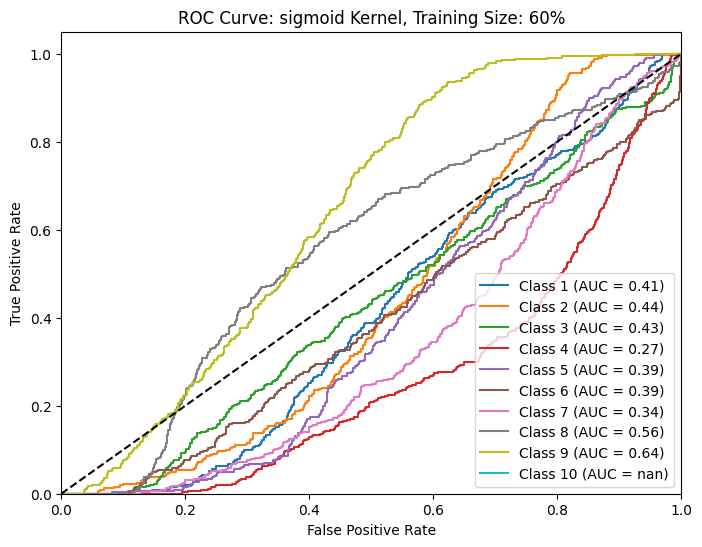

/usr/local/lib/python3.12/dist-packages/sklearn/metrics/_ranking.py:1188: UndefinedMetricWarning: No positive samples in y_true, true positive value should be meaningless
  warnings.warn(


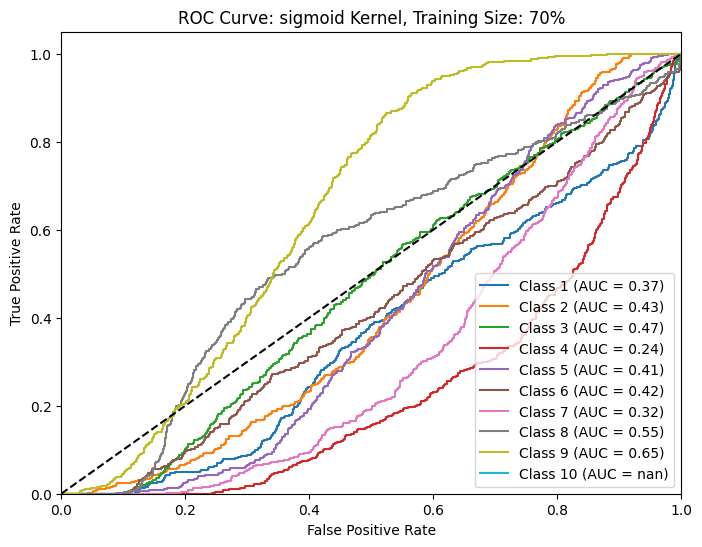

/usr/local/lib/python3.12/dist-packages/sklearn/metrics/_ranking.py:1188: UndefinedMetricWarning: No positive samples in y_true, true positive value should be meaningless
  warnings.warn(


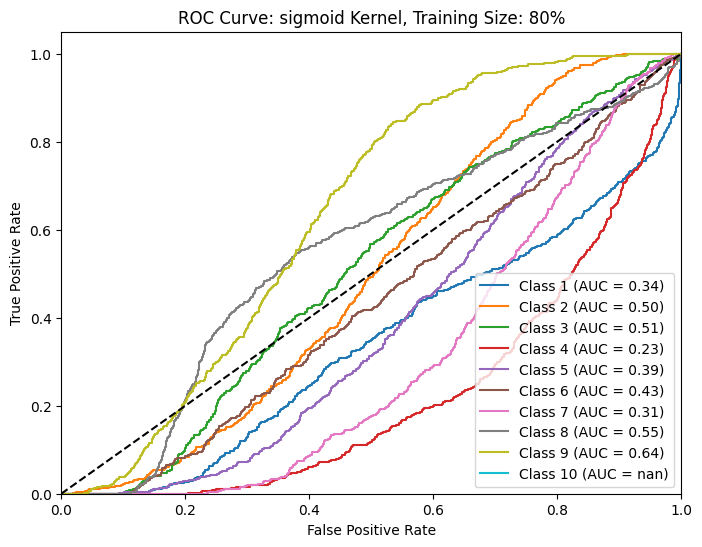

In [ ]:
from sklearn.metrics import roc_curve, auc

# Since this is a multi-class problem, we'll use a One-vs-Rest (OvR) approach for ROC curves
for model_data in trained_models:
    model = model_data["Model"]
    X_test = model_data["X_test"]
    y_test = model_data["y_test"]
    kernel_name = model_data["Kernel"]
    training_size = model_data["Training size"]

    plt.figure(figsize=(8, 6)) # Create a new figure for each plot

    # Get predicted probabilities for each class
    y_prob = model.predict_proba(X_test)

    # Compute ROC curve and AUC for each class using OvR
    fpr = dict()
    tpr = dict()
    roc_auc = dict()
    n_classes = len(np.unique(y_test))

    for i in range(n_classes):
        fpr[i], tpr[i], _ = roc_curve(y_test, y_prob[:, i], pos_label=i+1)
        roc_auc[i] = auc(fpr[i], tpr[i])

    # Plot ROC curve for each class
    for i in range(n_classes):
        plt.plot(fpr[i], tpr[i], label=f'Class {i+1} (AUC = {roc_auc[i]:.2f})')

    plt.plot([0, 1], [0, 1], 'k--') # Plot random chance line
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.05])
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title(f'ROC Curve: {kernel_name} Kernel, Training Size: {training_size}%') # Add title for each plot
    plt.legend(loc="lower right")
    plt.show()

### Calculate values for different test size using PCA-reduced data

In [ ]:
results_pca = []
confusion_matrices_pca = []

for kernel_name, kernel in kernels.items():
  for size in training_sizes:
   X_train_pca, X_test_pca, y_train, y_test = train_test_split(X_pca_reduced, y, test_size=size, random_state=42)
   svc_pca = SVC(kernel=kernel, probability=True, random_state=42) # Add probability=True
   svc_pca.fit(X_train_pca, y_train.values.ravel())
   y_pred_pca = svc_pca.predict(X_test_pca)

   acc_pca = accuracy_score(y_test, y_pred_pca)
   precision_pca = precision_score(y_test, y_pred_pca, average='weighted', zero_division=0) # Calculate weighted precision, handle zero division
   recall_pca = recall_score(y_test, y_pred_pca, average='weighted') # Calculate weighted recall
   f1_pca = f1_score(y_test, y_pred_pca, average='weighted') # Calculate weighted F1-score


   cm_pca = confusion_matrix(y_test, y_pred_pca) # Calculate confusion matrix

   results_pca.append({
       "Training size":int (size*100),
       "Accuracy":acc_pca,
       "Precision": precision_pca,
       "Recall": recall_pca,
       "F1-score": f1_pca,
       "Kernel":kernel_name
   })
   confusion_matrices_pca.append({ # Store confusion matrix with metadata
       "Training size":int (size*100),
       "Kernel":kernel_name,
       "Confusion Matrix":cm_pca
   })

### Print Accuracy, Precision, Recall, and F1-score Table and Graphs for PCA-Reduced Data

,Training size,Accuracy,Precision,Recall,F1-score,Kernel
0,50,0.970819,0.970937,0.970819,0.970850,linear
1,60,0.972716,0.972695,0.972716,0.972687,linear
2,70,0.968734,0.968882,0.968734,0.968751,linear
3,80,0.966192,0.966314,0.966192,0.966197,linear
4,50,0.964413,0.968400,0.964413,0.965236,polynomial
5,60,0.962930,0.967787,0.962930,0.963943,polynomial
6,70,0.956279,0.963473,0.956279,0.957801,polynomial
7,80,0.927491,0.948847,0.927491,0.932636,polynomial
8,50,0.980427,0.980517,0.980427,0.980437,gaussian
9,60,0.977165,0.977299,0.977165,0.977172,gaussian


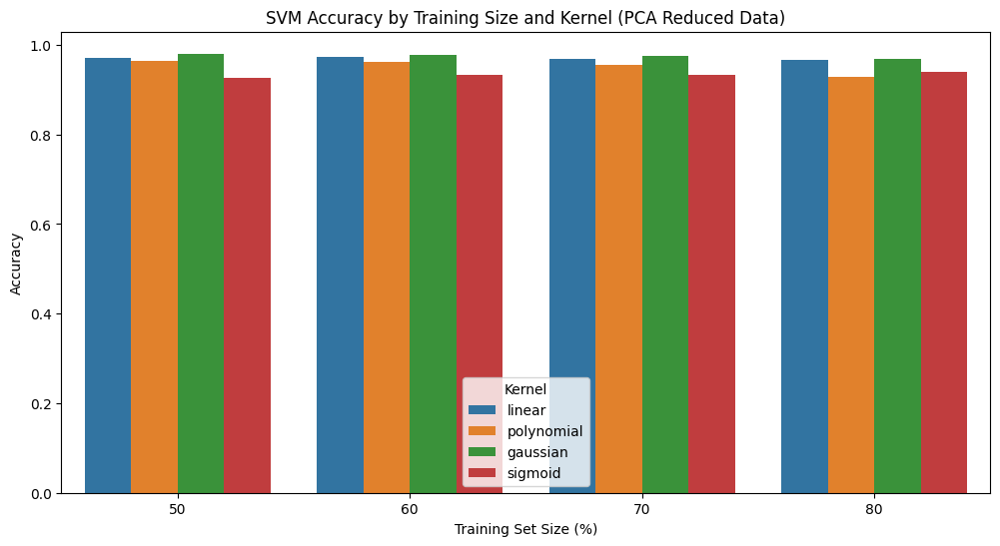

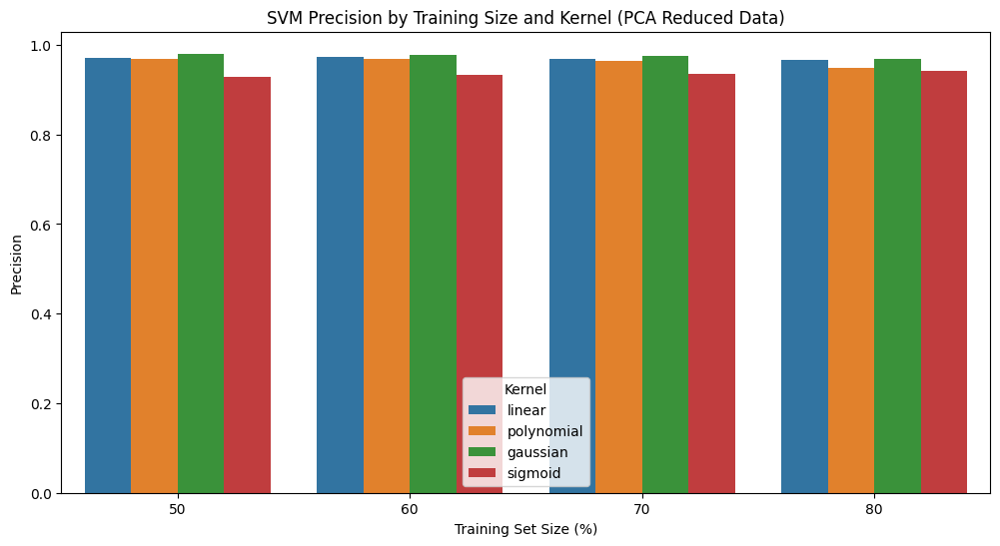

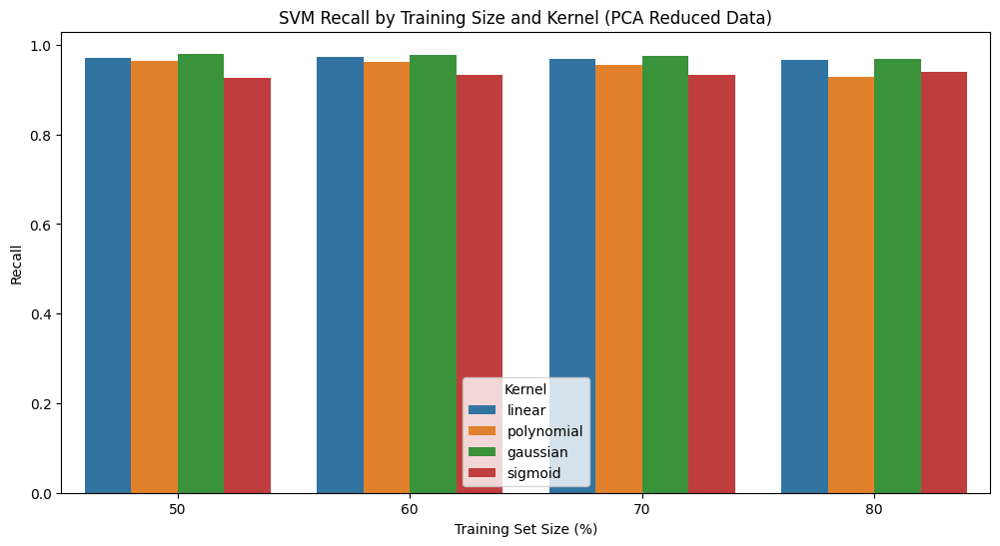

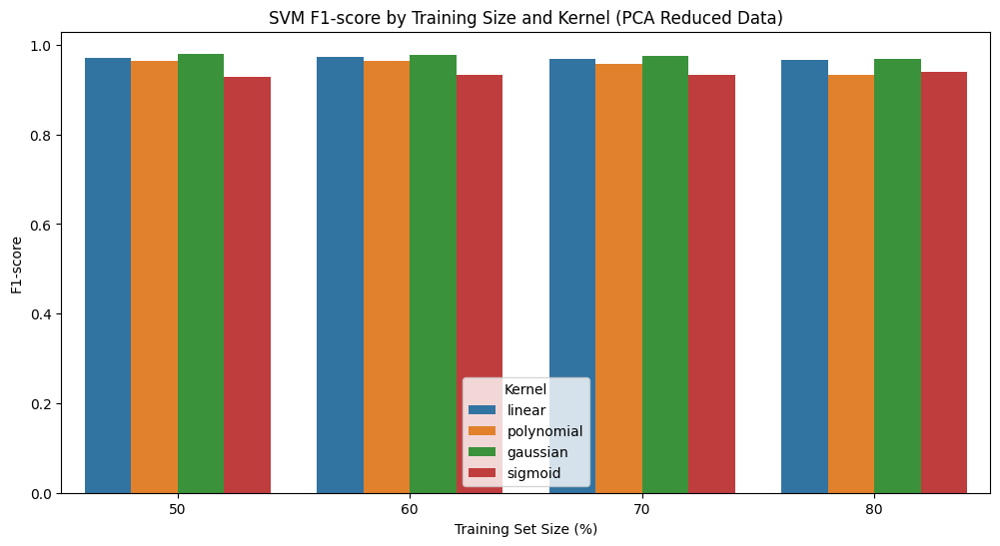

In [ ]:
df_pca = pd.DataFrame(results_pca)
display(df_pca) # Display the DataFrame as a table

# Plot Accuracy
plt.figure(figsize=(12, 6)) # Increase figure size
sns.barplot(data=df_pca, x='Training size', y='Accuracy', hue='Kernel')
plt.title('SVM Accuracy by Training Size and Kernel (PCA Reduced Data)') # Add title
plt.xlabel('Training Set Size (%)') # Add x-axis label
plt.ylabel('Accuracy') # Add y-axis label
plt.show()

# Plot Precision
plt.figure(figsize=(12, 6)) # Increase figure size
sns.barplot(data=df_pca, x='Training size', y='Precision', hue='Kernel')
plt.title('SVM Precision by Training Size and Kernel (PCA Reduced Data)') # Add title
plt.xlabel('Training Set Size (%)') # Add x-axis label
plt.ylabel('Precision') # Add y-axis label
plt.show()

# Plot Recall
plt.figure(figsize=(12, 6)) # Increase figure size
sns.barplot(data=df_pca, x='Training size', y='Recall', hue='Kernel')
plt.title('SVM Recall by Training Size and Kernel (PCA Reduced Data)') # Add title
plt.xlabel('Training Set Size (%)') # Add x-axis label
plt.ylabel('Recall') # Add y-axis label
plt.show()

# Plot F1-score
plt.figure(figsize=(12, 6)) # Increase figure size
sns.barplot(data=df_pca, x='Training size', y='F1-score', hue='Kernel')
plt.title('SVM F1-score by Training Size and Kernel (PCA Reduced Data)') # Add title
plt.xlabel('Training Set Size (%)') # Add x-axis label
plt.ylabel('F1-score') # Add y-axis label
plt.show()

### Show Confusion Matrices for PCA-Reduced Data

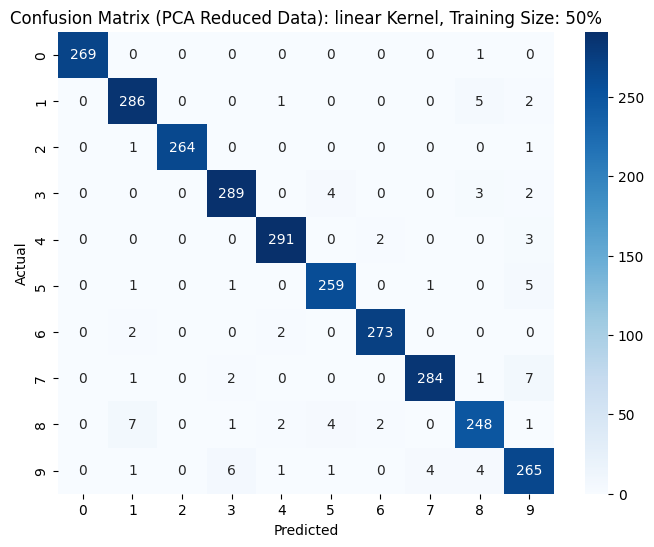

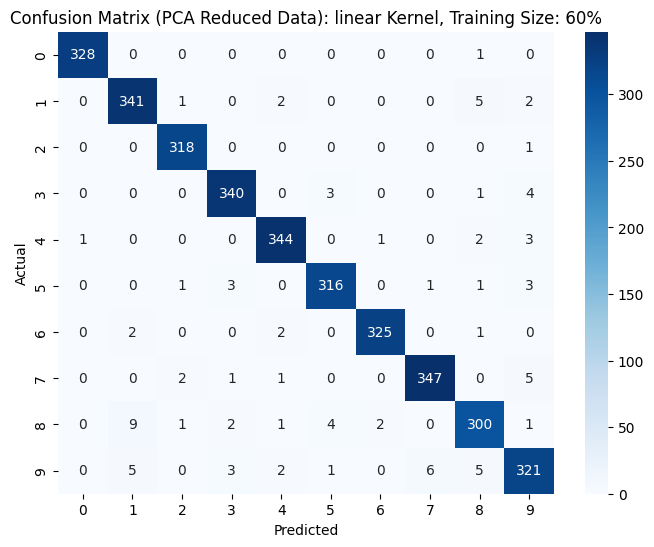

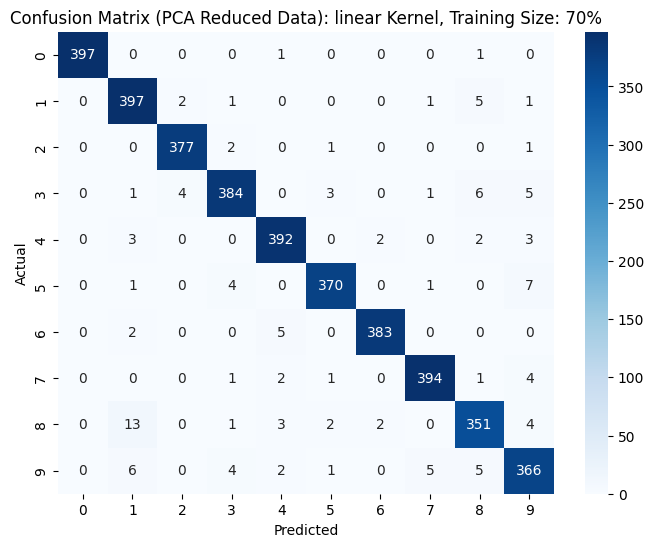

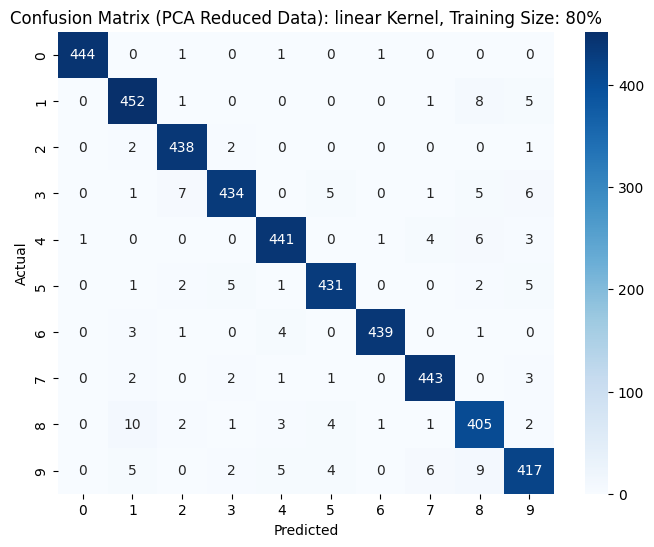

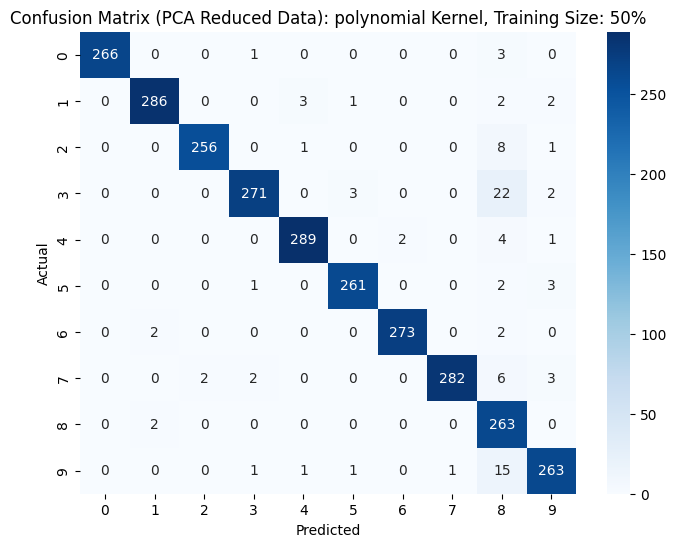

...

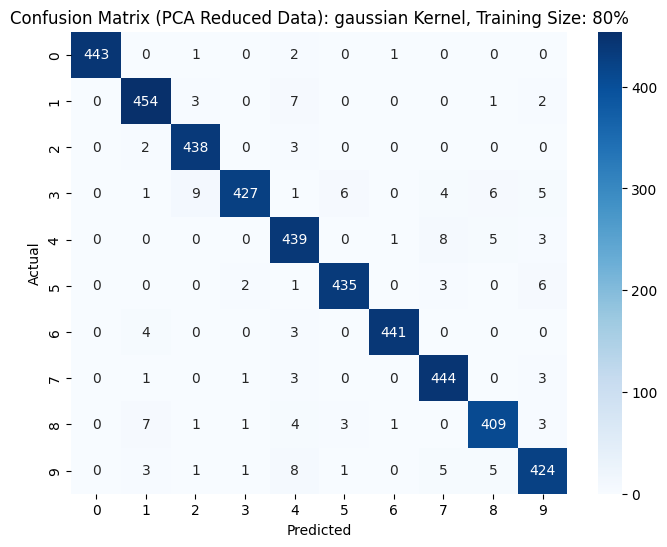

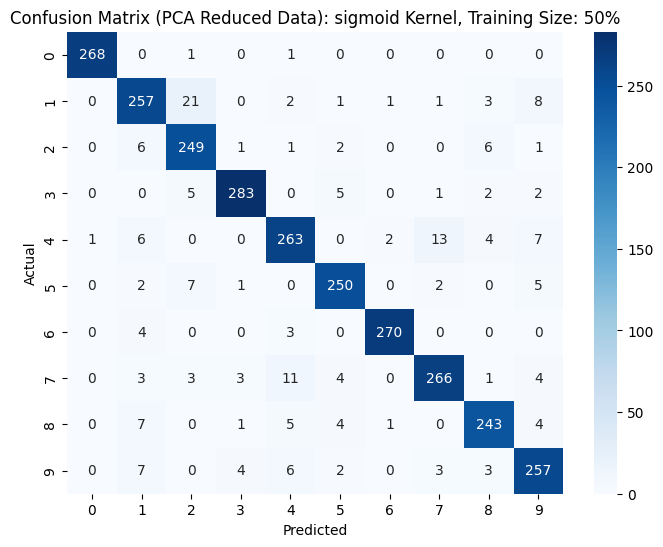

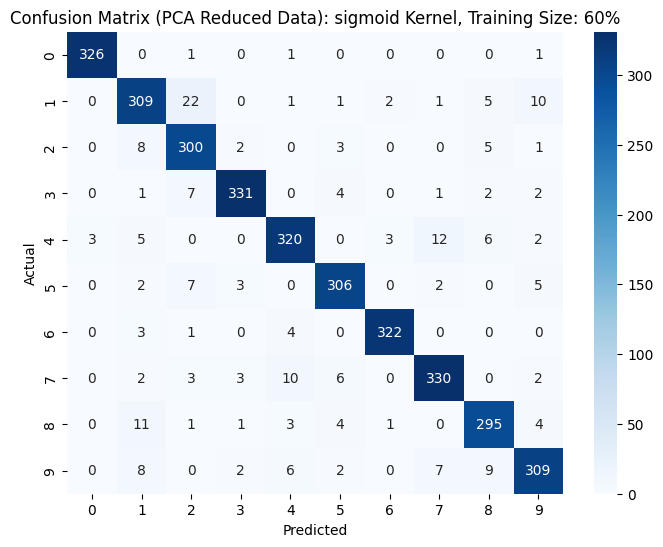

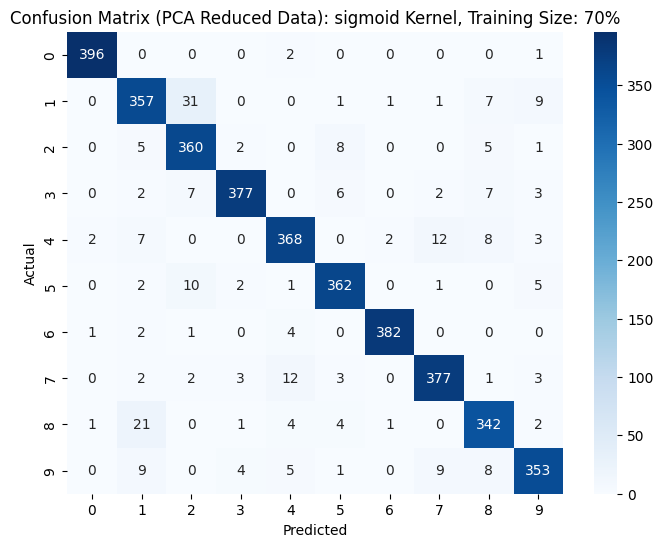

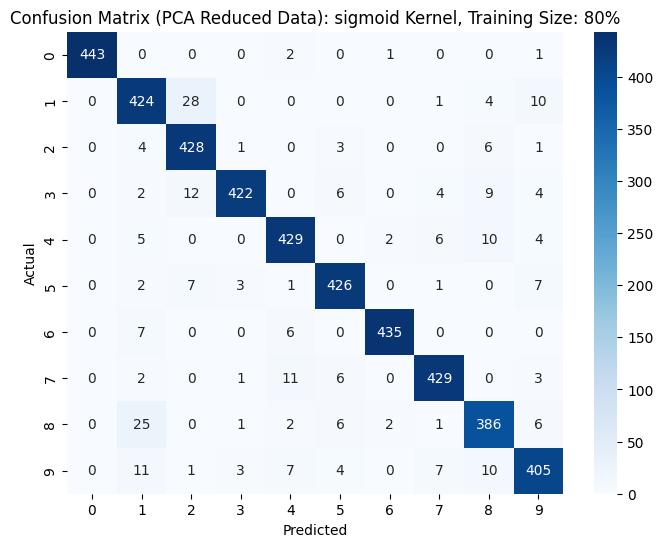

In [ ]:
for cm_data in confusion_matrices_pca:
    cm = cm_data["Confusion Matrix"]
    kernel_name = cm_data["Kernel"]
    training_size = cm_data["Training size"]

    plt.figure(figsize=(8, 6))
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues')
    plt.title(f'Confusion Matrix (PCA Reduced Data): {kernel_name} Kernel, Training Size: {training_size}%')
    plt.xlabel('Predicted')
    plt.ylabel('Actual')
    plt.show()

## MLP

### Calculate values for different test size

In [ ]:
from sklearn.neural_network import MLPClassifier
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, confusion_matrix
import matplotlib.pyplot as plt
import seaborn as sns

training_sizes = [0.5, 0.6, 0.7, 0.8]

results_mlp = []
confusion_matrices_mlp = []
trained_models_mlp = []

for size in training_sizes:
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=size, random_state=42)

    # Initialize MLPClassifier
    # You might need to tune the hyperparameters like hidden_layer_sizes, activation, solver, etc.
    mlp = MLPClassifier(max_iter=1000)

    mlp.fit(X_train, y_train.values.ravel())
    y_pred = mlp.predict(X_test)

    acc = accuracy_score(y_test, y_pred)
    precision = precision_score(y_test, y_pred, average='weighted', zero_division=0)
    recall = recall_score(y_test, y_pred, average='weighted')
    f1 = f1_score(y_test, y_pred, average='weighted')

    cm = confusion_matrix(y_test, y_pred)

    results_mlp.append({
        "Training size": int(size * 100),
        "Accuracy": acc,
        "Precision": precision,
        "Recall": recall,
        "F1-score": f1
    })
    confusion_matrices_mlp.append({
        "Training size": int(size * 100),
        "Confusion Matrix": cm
    })
    trained_models_mlp.append({ # Store the trained model with metadata
      "Training size":int (size*100),
      "Model": mlp,
      "X_test": X_test,
      "y_test": y_test
    })

### Print Evalution Table and Graphs

,Training size,Accuracy,Precision,Recall,F1-score
0,50,0.975089,0.975259,0.975089,0.975121
1,60,0.969158,0.969391,0.969158,0.969207
2,70,0.961617,0.961873,0.961617,0.961637
3,80,0.958852,0.959329,0.958852,0.958933


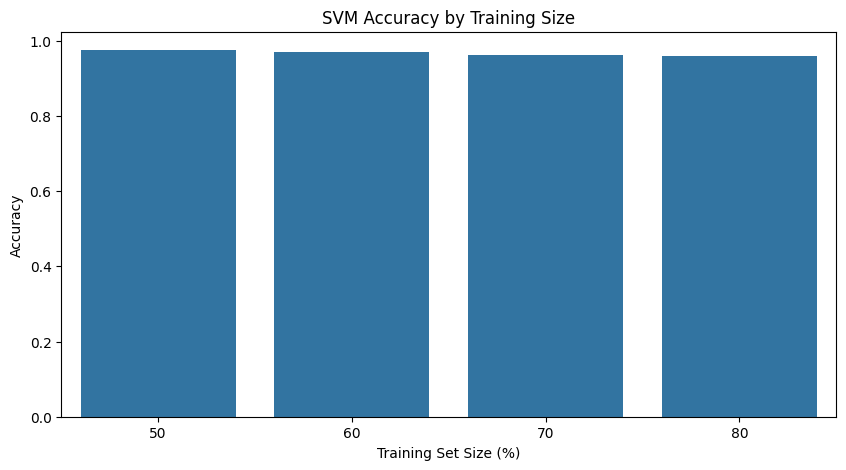

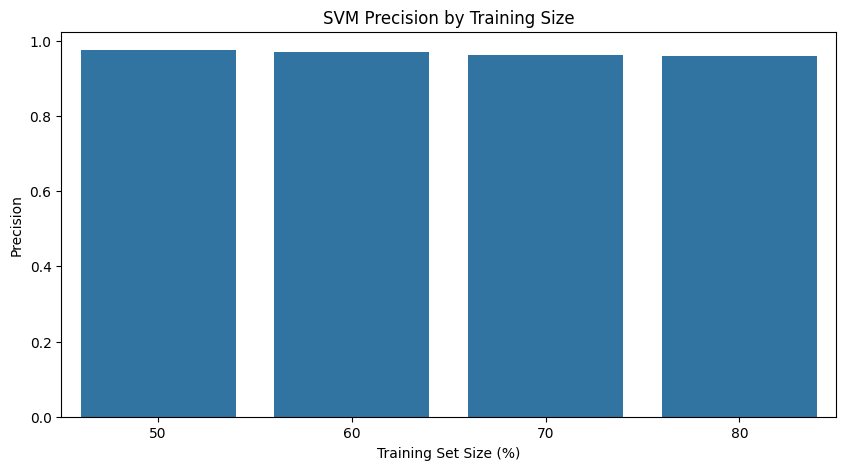

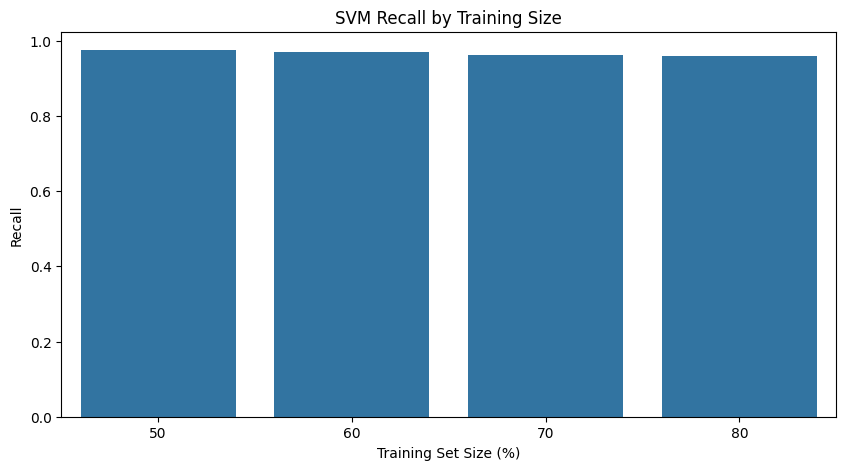

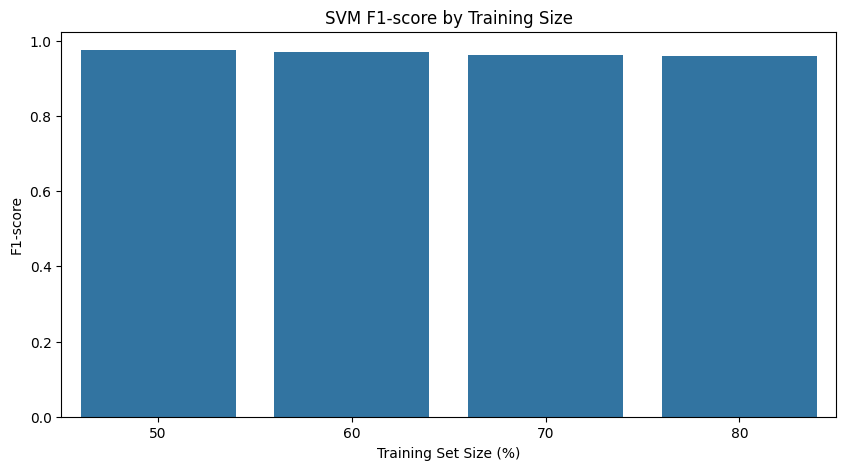

In [ ]:
df = pd.DataFrame(results_mlp)
display(df) # Display the DataFrame as a table

# Plot Accuracy
plt.figure(figsize=(10, 5)) # Increase figure size
sns.barplot(data=df, x='Training size', y='Accuracy')
plt.title('SVM Accuracy by Training Size') # Add title
plt.xlabel('Training Set Size (%)') # Add x-axis label
plt.ylabel('Accuracy') # Add y-axis label
plt.show()

# Plot Precision
plt.figure(figsize=(10, 5)) # Increase figure size
sns.barplot(data=df, x='Training size', y='Precision')
plt.title('SVM Precision by Training Size') # Add title
plt.xlabel('Training Set Size (%)') # Add x-axis label
plt.ylabel('Precision') # Add y-axis label
plt.show()

# Plot Recall
plt.figure(figsize=(10, 5)) # Increase figure size
sns.barplot(data=df, x='Training size', y='Recall')
plt.title('SVM Recall by Training Size') # Add title
plt.xlabel('Training Set Size (%)') # Add x-axis label
plt.ylabel('Recall') # Add y-axis label
plt.show()

# Plot F1-score
plt.figure(figsize=(10, 5)) # Increase figure size
sns.barplot(data=df, x='Training size', y='F1-score')
plt.title('SVM F1-score by Training Size') # Add title
plt.xlabel('Training Set Size (%)') # Add x-axis label
plt.ylabel('F1-score') # Add y-axis label
plt.show()

### Show Confusion Matrices

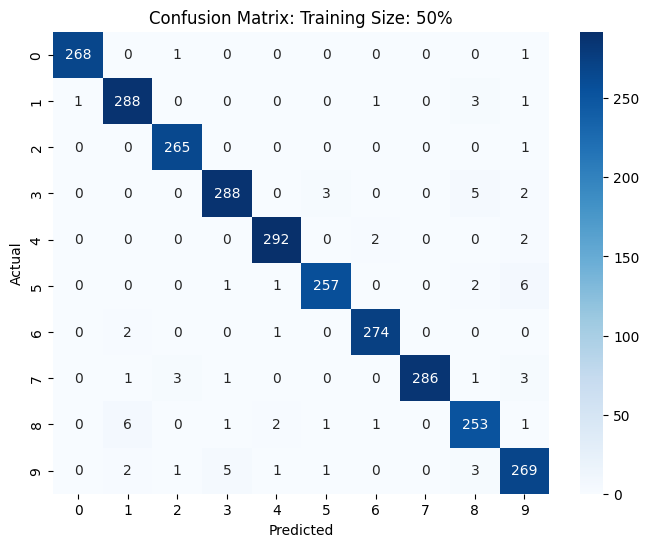

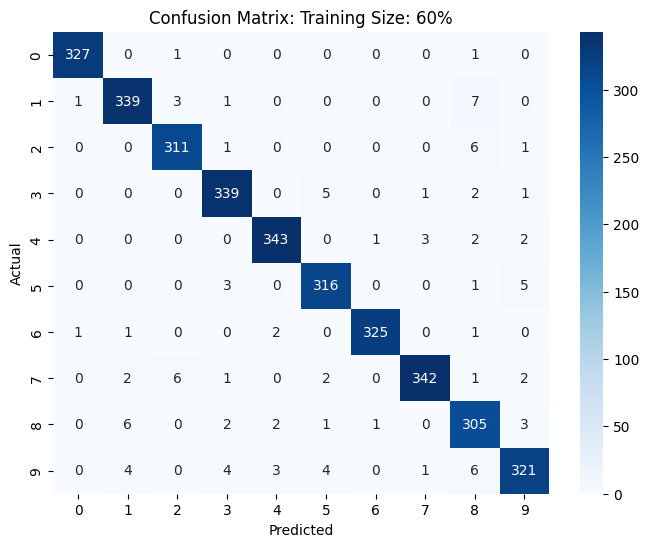

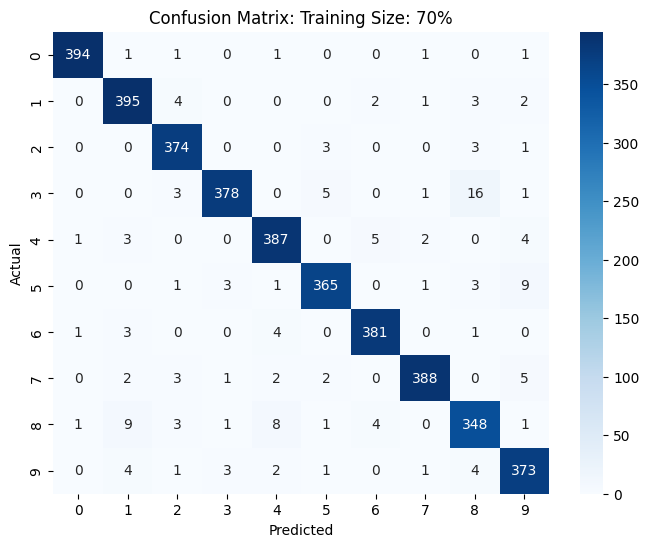

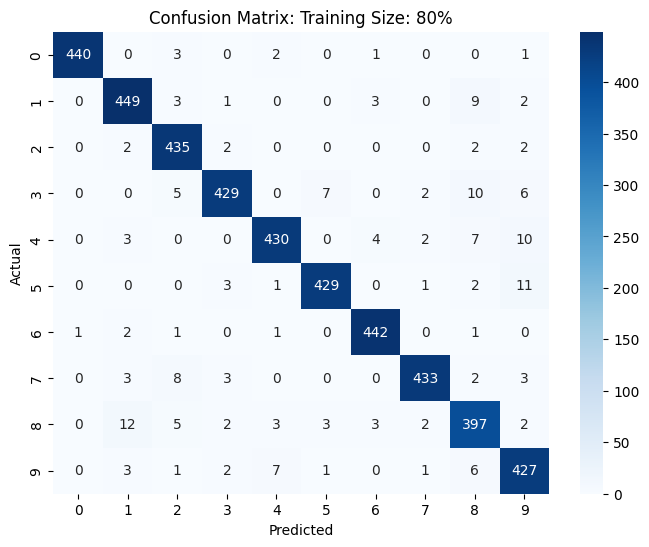

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

for cm_data in confusion_matrices_mlp:
    cm = cm_data["Confusion Matrix"]
    training_size = cm_data["Training size"]

    plt.figure(figsize=(8, 6))
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues')
    plt.title(f'Confusion Matrix: Training Size: {training_size}%')
    plt.xlabel('Predicted')
    plt.ylabel('Actual')
    plt.show()

### Training Loss generation curve

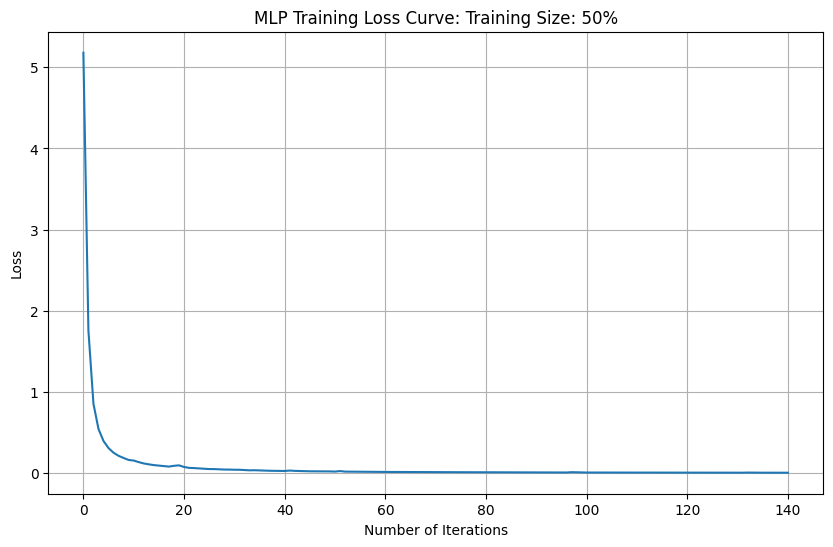

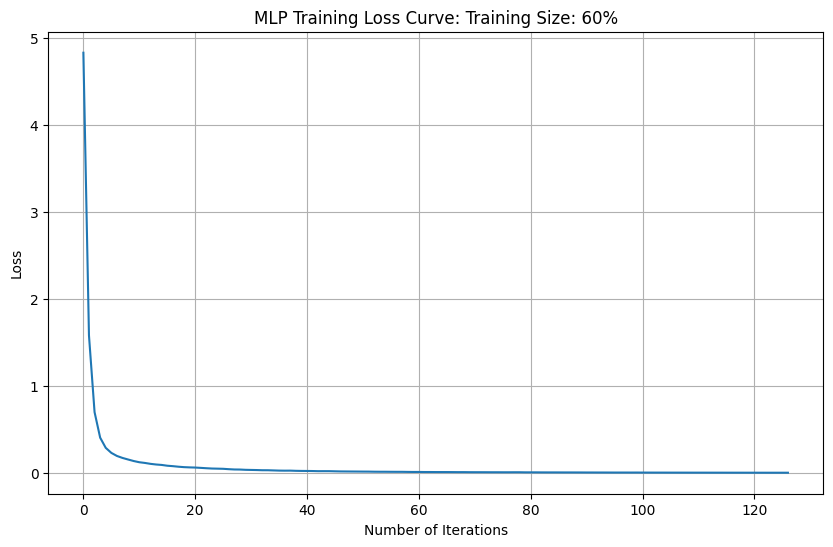

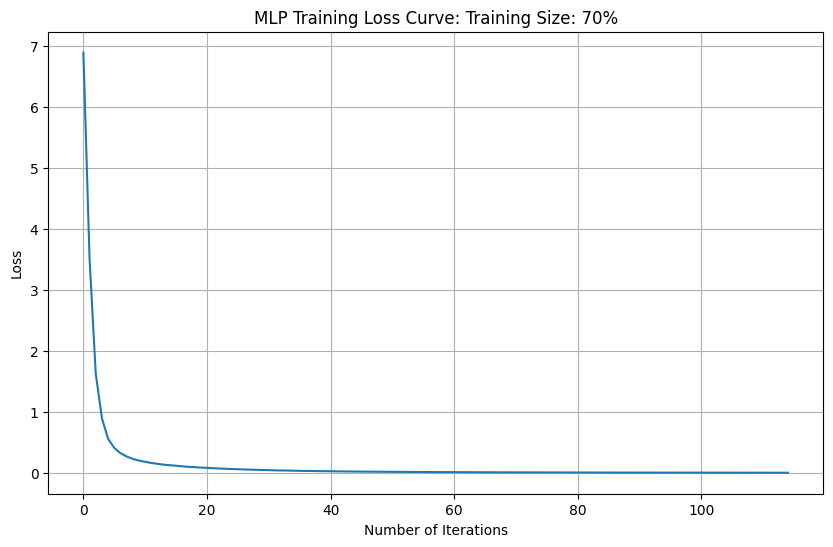

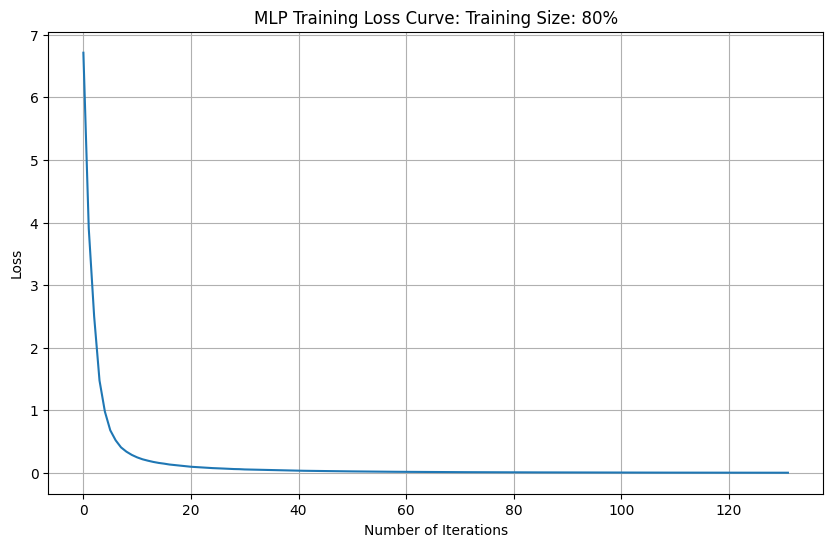

In [ ]:
# Plot training loss curve for each trained MLP model
for model_data in trained_models_mlp:
    model = model_data["Model"]
    training_size = model_data["Training size"]

    plt.figure(figsize=(10, 6))
    plt.plot(model.loss_curve_)
    plt.title(f'MLP Training Loss Curve: Training Size: {training_size}%')
    plt.xlabel('Number of Iterations')
    plt.ylabel('Loss')
    plt.grid(True)
    plt.show()


### ROC and AOC curve

/usr/local/lib/python3.12/dist-packages/sklearn/metrics/_ranking.py:1188: UndefinedMetricWarning: No positive samples in y_true, true positive value should be meaningless
  warnings.warn(


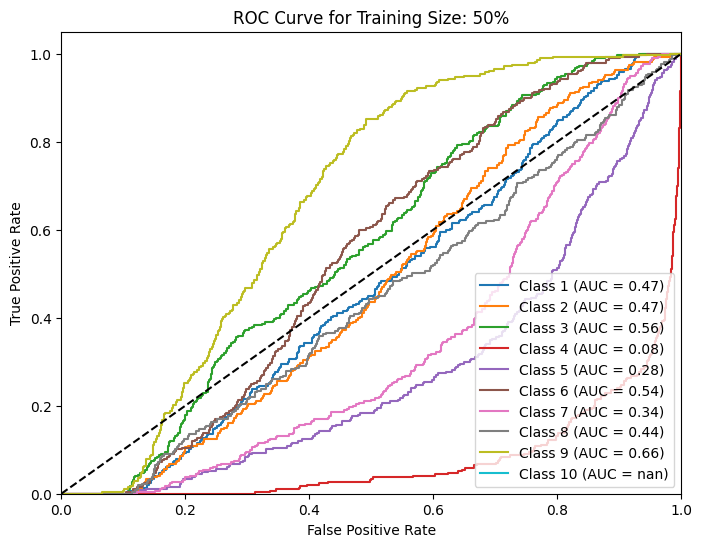

/usr/local/lib/python3.12/dist-packages/sklearn/metrics/_ranking.py:1188: UndefinedMetricWarning: No positive samples in y_true, true positive value should be meaningless
  warnings.warn(


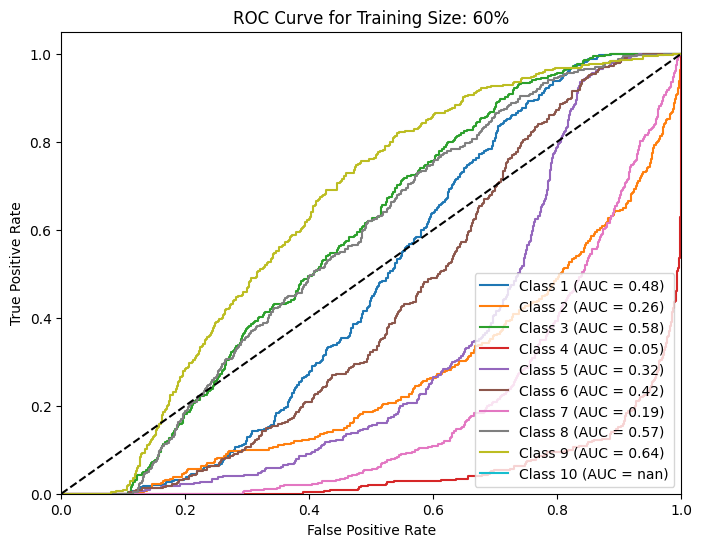

/usr/local/lib/python3.12/dist-packages/sklearn/metrics/_ranking.py:1188: UndefinedMetricWarning: No positive samples in y_true, true positive value should be meaningless
  warnings.warn(


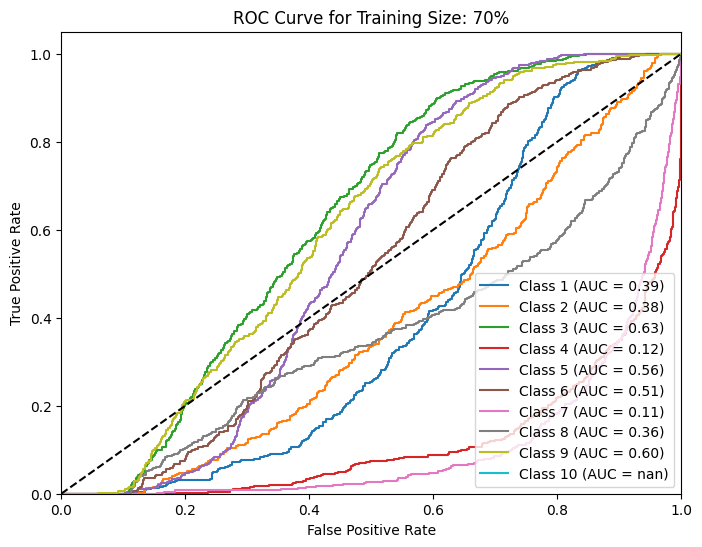

/usr/local/lib/python3.12/dist-packages/sklearn/metrics/_ranking.py:1188: UndefinedMetricWarning: No positive samples in y_true, true positive value should be meaningless
  warnings.warn(


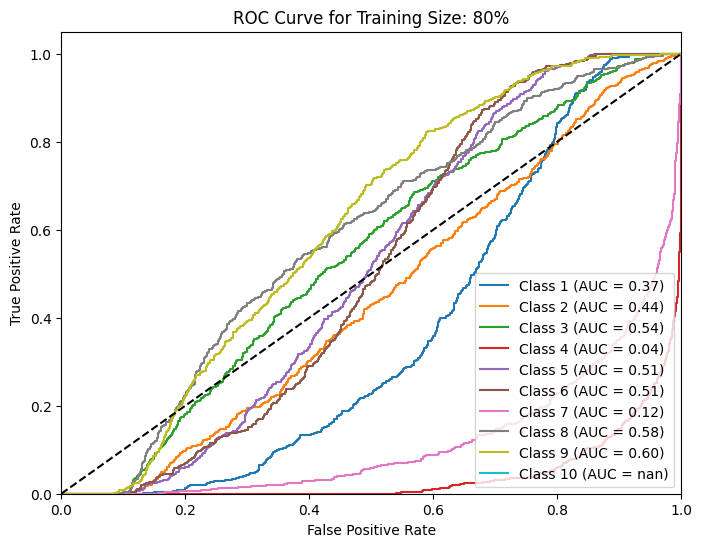

In [ ]:
from sklearn.metrics import roc_curve, auc

# Since this is a multi-class problem, we'll use a One-vs-Rest (OvR) approach for ROC curves
for model_data in trained_models_mlp:
    model = model_data["Model"]
    X_test = model_data["X_test"]
    y_test = model_data["y_test"]
    training_size = model_data["Training size"]

    plt.figure(figsize=(8, 6)) # Create a new figure for each plot

    # Get predicted probabilities for each class
    y_prob = model.predict_proba(X_test)

    # Compute ROC curve and AUC for each class using OvR
    fpr = dict()
    tpr = dict()
    roc_auc = dict()
    n_classes = len(np.unique(y_test))

    for i in range(n_classes):
        fpr[i], tpr[i], _ = roc_curve(y_test, y_prob[:, i], pos_label=i+1)
        roc_auc[i] = auc(fpr[i], tpr[i])

    # Plot ROC curve for each class
    for i in range(n_classes):
        plt.plot(fpr[i], tpr[i], label=f'Class {i+1} (AUC = {roc_auc[i]:.2f})')

    plt.plot([0, 1], [0, 1], 'k--') # Plot random chance line
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.05])
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title(f'ROC Curve for Training Size: {training_size}%') # Add title for each plot
    plt.legend(loc="lower right")
    plt.show()

### MLP with PCA-Reduced Data

In [ ]:
# Apply the existing PCA transformation to the scaled data
X_pca_reduced_mlp = pca.fit_transform(X_scaled)

print(f"\nOriginal number of features: {X.shape[1]}")
print(f"Reduced number of features after PCA: {X_pca_reduced_mlp.shape[1]}")
print("\nData after PCA for Random Forest:")
display(pd.DataFrame(X_pca_reduced_mlp).head())


Original number of features: 64
Reduced number of features after PCA: 50

Data after PCA for Random Forest:


,0,1,2,3,4,5,6,7,8,9,...,40,41,42,43,44,45,46,47,48,49
0,-0.296633,-1.446450,-3.863044,-3.223597,0.773631,0.631849,0.163733,0.474708,-1.085103,-0.027994,...,0.517559,0.494320,0.042024,-0.919845,-0.181330,-0.604761,0.116663,-0.247460,0.112606,-0.090206
1,-0.156717,-3.065688,-5.811656,-3.232099,1.064670,0.031353,0.270302,2.091832,-1.487364,-0.998295,...,0.754699,-0.204192,-0.292517,-0.300754,-0.441550,-0.082849,0.587194,0.018828,0.014534,0.211886
2,-0.753929,3.261949,0.779656,-1.108976,0.311024,-0.814548,-4.307315,0.841364,-1.166513,-0.126725,...,-0.572788,-0.060109,0.004906,0.315338,0.331871,0.927054,-0.313190,-0.748029,-0.148217,-0.039561
3,-4.226579,1.900320,-0.441486,1.329548,-0.149220,2.710149,2.128209,0.206327,-1.659819,0.573584,...,0.943616,-0.845965,-0.179062,0.466753,0.564706,0.060870,0.027984,0.323670,-0.110900,-1.064628
4,0.582983,-3.490539,-1.602212,-1.052587,-1.360737,0.406474,-0.662578,-2.572619,0.341349,0.066232,...,0.094542,0.086006,0.098118,0.760049,-0.532223,0.368102,0.162075,0.593148,-0.220887,-0.314977


### Calculate MLP performance with PCA-Reduced Data for different test sizes

In [ ]:
results_mlp_pca = []
confusion_matrices_mlp_pca = []
trained_models_mlp_pca = []


for size in training_sizes:
  X_train_pca_mlp, X_test_pca_mlp, y_train, y_test = train_test_split(X_pca_reduced_mlp, y, test_size=size, random_state=42)
  mlp_pca = MLPClassifier(max_iter=1000)

  mlp_pca.fit(X_train_pca_mlp, y_train.values.ravel())
  y_pred_pca_mlp = mlp_pca.predict(X_test_pca_mlp)

  acc_pca_mlp = accuracy_score(y_test, y_pred_pca_mlp)
  precision_pca_mlp = precision_score(y_test, y_pred_pca_mlp, average='weighted', zero_division=0)
  recall_pca_mlp = recall_score(y_test, y_pred_pca_mlp, average='weighted')
  f1_pca_mlp = f1_score(y_test, y_pred_pca_mlp, average='weighted')

  cm_pca_mlp = confusion_matrix(y_test, y_pred_pca_mlp)

  results_mlp_pca.append({
      "Training size":int (size*100),
      "Accuracy":acc_pca_mlp,
      "Precision": precision_pca_mlp,
      "Recall": recall_pca_mlp,
      "F1-score": f1_pca_mlp
  })

  confusion_matrices_mlp_pca.append({
      "Training size":int (size*100),
      "Confusion Matrix":cm_pca_mlp
  })

  trained_models_mlp_pca.append({
      "Training size":int (size*100),
      "Model": mlp_pca,
  })



### Print MLP Performance Table and Graphs with PCA-Reduced Data

,Training size,Accuracy,Precision,Recall,F1-score
0,50,0.973665,0.973913,0.973665,0.973740
1,60,0.975979,0.976062,0.975979,0.975998
2,70,0.966446,0.966648,0.966446,0.966444
3,80,0.965970,0.966241,0.965970,0.966018


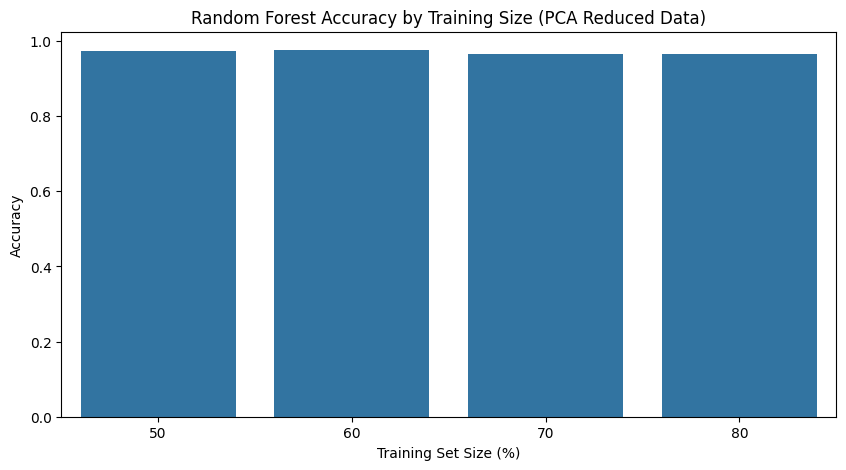

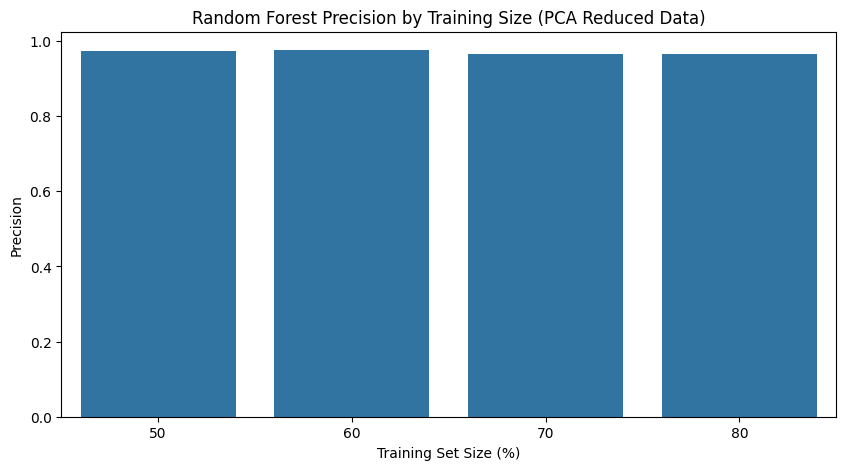

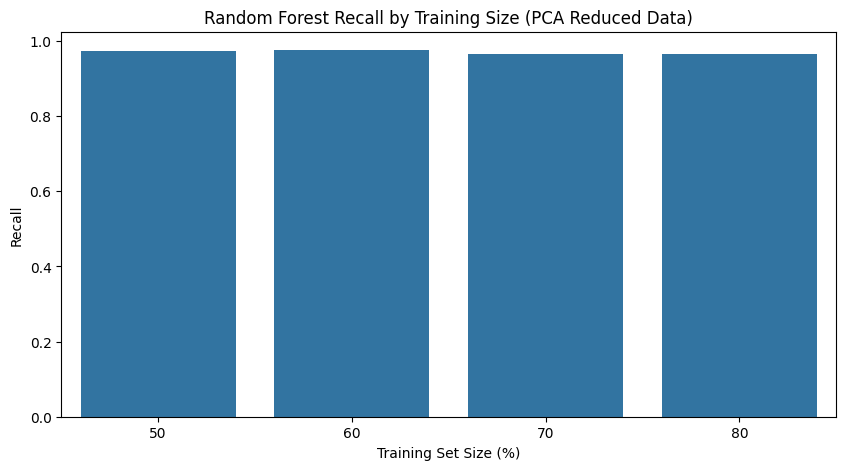

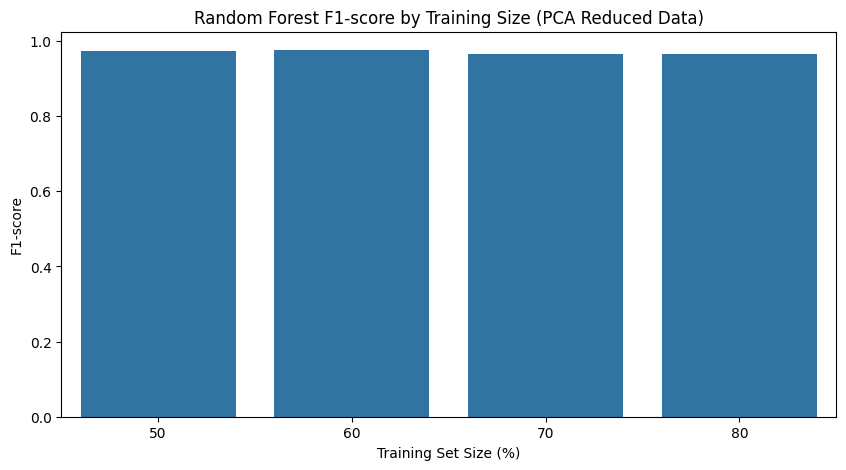

In [ ]:
df_mlp_pca = pd.DataFrame(results_mlp_pca)
display(df_mlp_pca)

# Plot Accuracy
plt.figure(figsize=(10, 5))
sns.barplot(data=df_mlp_pca, x='Training size', y='Accuracy')
plt.title('Random Forest Accuracy by Training Size (PCA Reduced Data)')
plt.xlabel('Training Set Size (%)')
plt.ylabel('Accuracy')
plt.show()

# Plot Precision
plt.figure(figsize=(10, 5))
sns.barplot(data=df_mlp_pca, x='Training size', y='Precision')
plt.title('Random Forest Precision by Training Size (PCA Reduced Data)')
plt.xlabel('Training Set Size (%)')
plt.ylabel('Precision')
plt.show()

# Plot Recall
plt.figure(figsize=(10, 5))
sns.barplot(data=df_mlp_pca, x='Training size', y='Recall')
plt.title('Random Forest Recall by Training Size (PCA Reduced Data)')
plt.xlabel('Training Set Size (%)')
plt.ylabel('Recall')
plt.show()

# Plot F1-score
plt.figure(figsize=(10, 5))
sns.barplot(data=df_mlp_pca, x='Training size', y='F1-score')
plt.title('Random Forest F1-score by Training Size (PCA Reduced Data)')
plt.xlabel('Training Set Size (%)')
plt.ylabel('F1-score')
plt.show()



### Show Confusion Matrices for MLP with PCA-Reduced Data

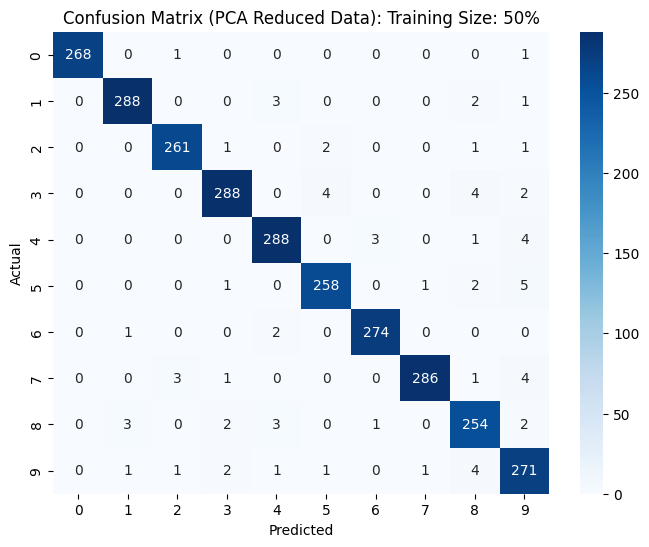

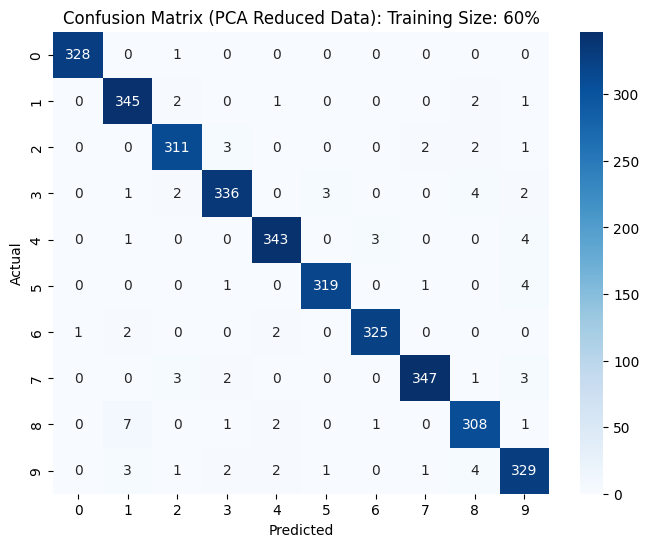

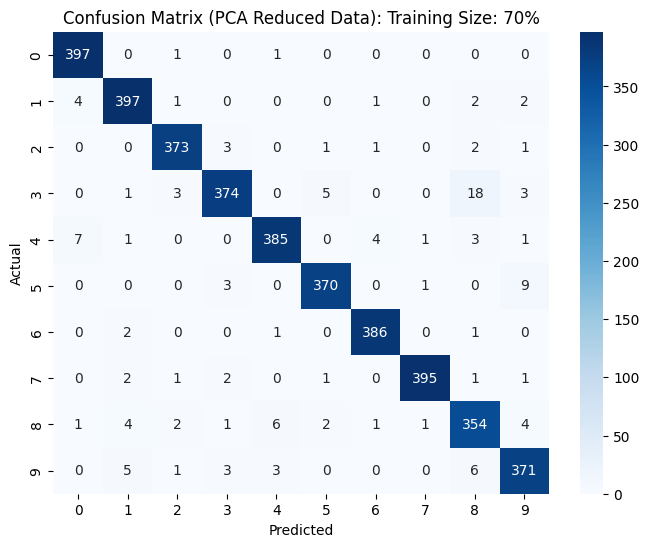

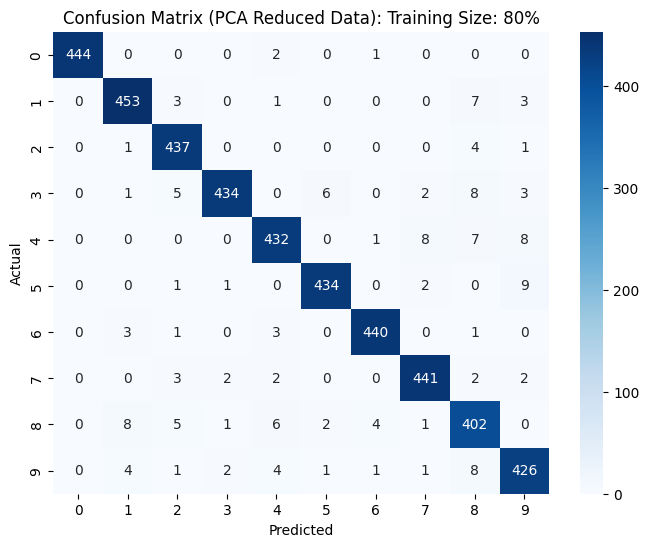

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

for cm_data in confusion_matrices_mlp_pca:
    cm = cm_data["Confusion Matrix"]
    training_size = cm_data["Training size"]

    plt.figure(figsize=(8, 6))
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues')
    plt.title(f'Confusion Matrix (PCA Reduced Data): Training Size: {training_size}%')
    plt.xlabel('Predicted')
    plt.ylabel('Actual')
    plt.show()

### Training Loss generation curve with PCA data

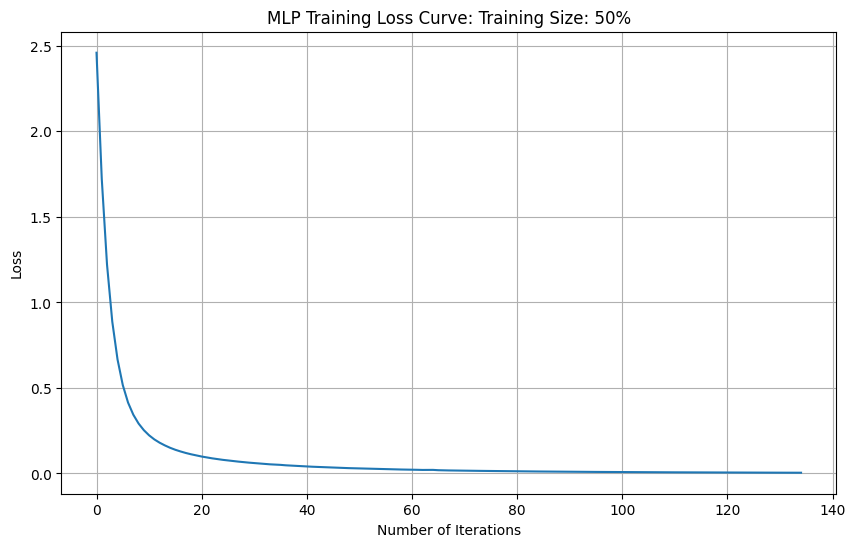

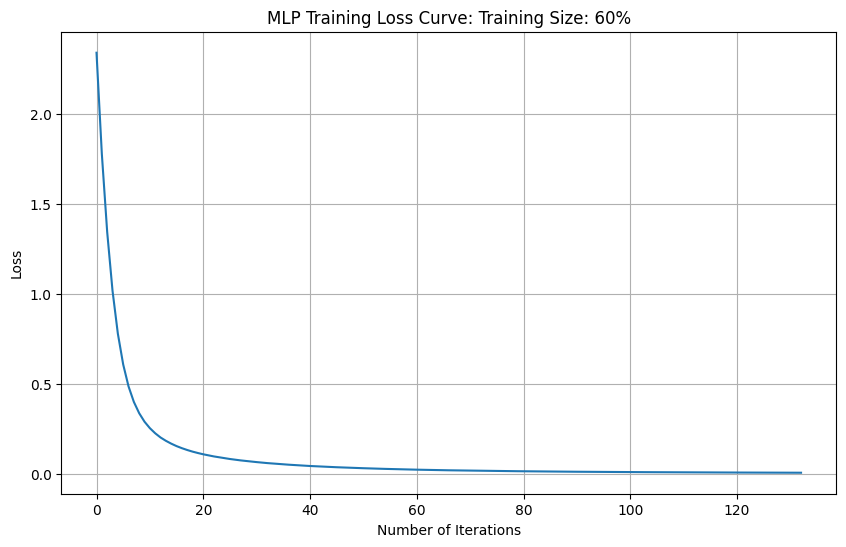

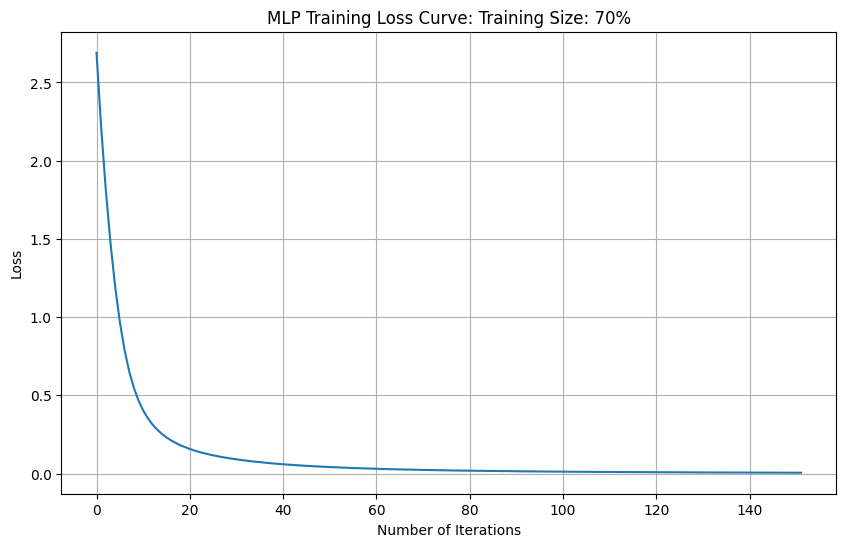

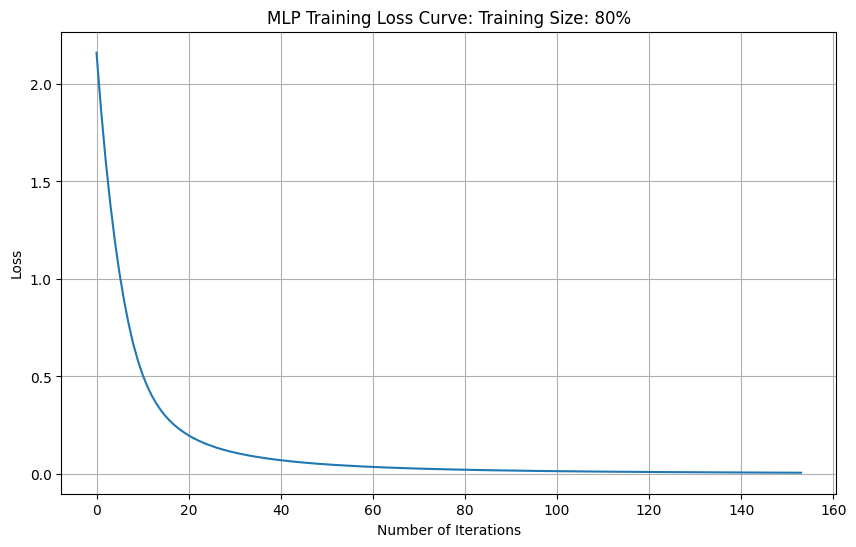

In [ ]:
# Plot training loss curve for each trained MLP model
for model_data in trained_models_mlp_pca:
    model = model_data["Model"]
    training_size = model_data["Training size"]

    plt.figure(figsize=(10, 6))
    plt.plot(model.loss_curve_)
    plt.title(f'MLP Training Loss Curve: Training Size: {training_size}%')
    plt.xlabel('Number of Iterations')
    plt.ylabel('Loss')
    plt.grid(True)
    plt.show()


## Random Forest

### Calculate values for different test size

In [ ]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix, precision_score, recall_score, f1_score
import matplotlib.pyplot as plt
import seaborn as sns

training_sizes = [0.5, 0.6, 0.7, 0.8]

results_rf = []
confusion_matrices_rf = []
trained_models_rf = [] # Add a list to store trained models


for size in training_sizes:
  X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=size, random_state=42)
  rf = RandomForestClassifier(random_state=42)


  rf.fit(X_train, y_train.values.ravel())
  y_pred_test = rf.predict(X_test)
  y_pred_train = rf.predict(X_train)


  acc_test = accuracy_score(y_test, y_pred_test)
  precision_test = precision_score(y_test, y_pred_test, average='weighted', zero_division=0) # Calculate weighted precision, handle zero division
  recall_test = recall_score(y_test, y_pred_test, average='weighted') # Calculate weighted recall
  f1_test = f1_score(y_test, y_pred_test, average='weighted') # Calculate weighted F1-score

  acc_train = accuracy_score(y_train, y_pred_train)
  precision_train = precision_score(y_train, y_pred_train, average='weighted', zero_division=0)
  recall_train = recall_score(y_train, y_pred_train, average='weighted')
  f1_train = f1_score(y_train, y_pred_train, average='weighted')


  cm = confusion_matrix(y_test, y_pred_test) # Calculate confusion matrix

  results_rf.append({
      "Training size":int (size*100),
      "Accuracy":acc_test,
      "Precision": precision_test,
      "Recall": recall_test,
      "F1-score": f1_test
  })

  confusion_matrices_rf.append({ # Store confusion matrix with metadata
      "Training size":int (size*100),
      "Confusion Matrix":cm
  })

  trained_models_rf.append({ # Store the trained model with metadata
      "Training size":int (size*100),
      "Model": rf,
      "X_test": X_test,
      "y_test": y_test
  })

### Print Evalution Table and Graphs

,Training size,Accuracy,Precision,Recall,F1-score
0,50,0.974733,0.975024,0.974733,0.974802
1,60,0.972716,0.972770,0.972716,0.972664
2,70,0.968480,0.968704,0.968480,0.968424
3,80,0.956628,0.957079,0.956628,0.956624


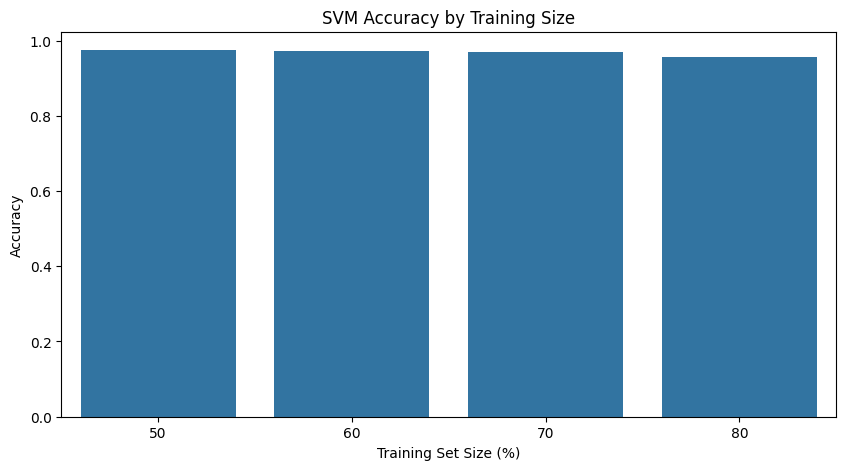

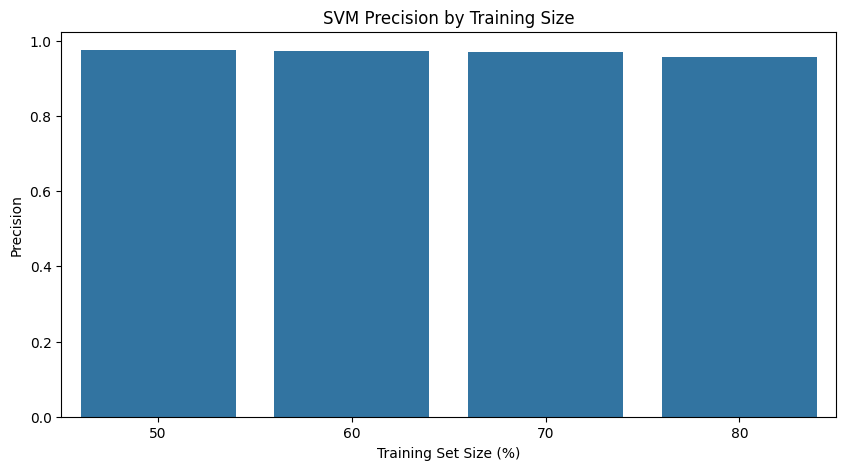

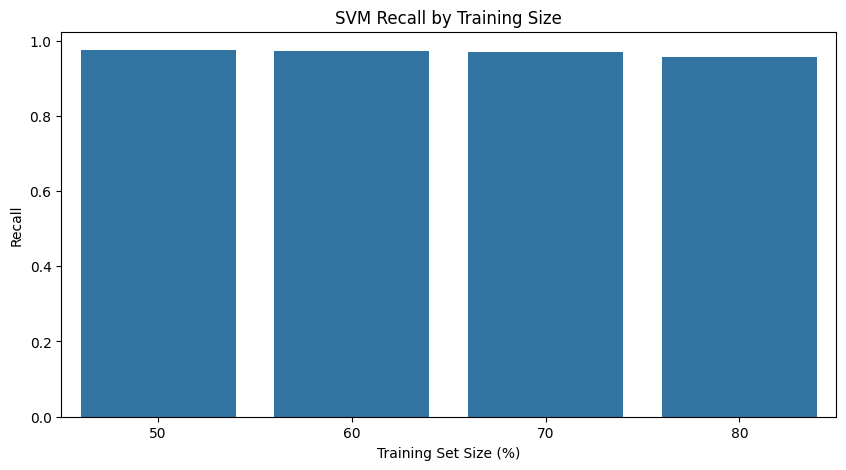

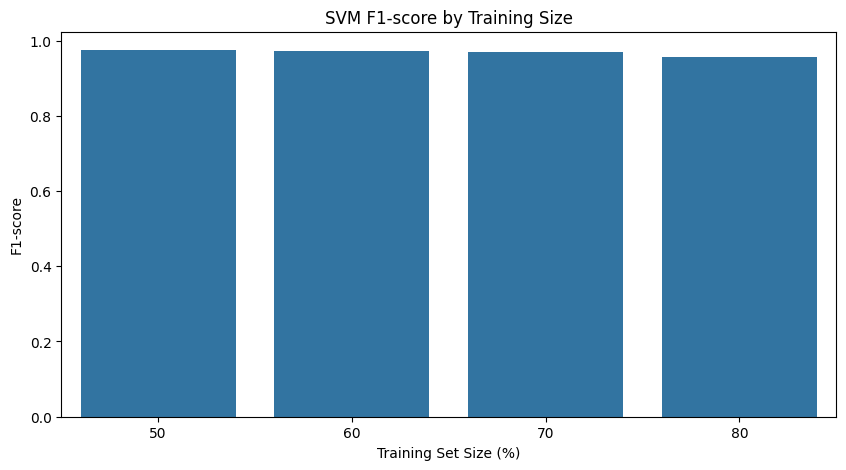

In [ ]:
df = pd.DataFrame(results_rf)
display(df) # Display the DataFrame as a table

# Plot Accuracy
plt.figure(figsize=(10, 5)) # Increase figure size
sns.barplot(data=df, x='Training size', y='Accuracy')
plt.title('SVM Accuracy by Training Size') # Add title
plt.xlabel('Training Set Size (%)') # Add x-axis label
plt.ylabel('Accuracy') # Add y-axis label
plt.show()

# Plot Precision
plt.figure(figsize=(10, 5)) # Increase figure size
sns.barplot(data=df, x='Training size', y='Precision')
plt.title('SVM Precision by Training Size') # Add title
plt.xlabel('Training Set Size (%)') # Add x-axis label
plt.ylabel('Precision') # Add y-axis label
plt.show()

# Plot Recall
plt.figure(figsize=(10, 5)) # Increase figure size
sns.barplot(data=df, x='Training size', y='Recall')
plt.title('SVM Recall by Training Size') # Add title
plt.xlabel('Training Set Size (%)') # Add x-axis label
plt.ylabel('Recall') # Add y-axis label
plt.show()

# Plot F1-score
plt.figure(figsize=(10, 5)) # Increase figure size
sns.barplot(data=df, x='Training size', y='F1-score')
plt.title('SVM F1-score by Training Size') # Add title
plt.xlabel('Training Set Size (%)') # Add x-axis label
plt.ylabel('F1-score') # Add y-axis label
plt.show()

### Show Confusion Matrices

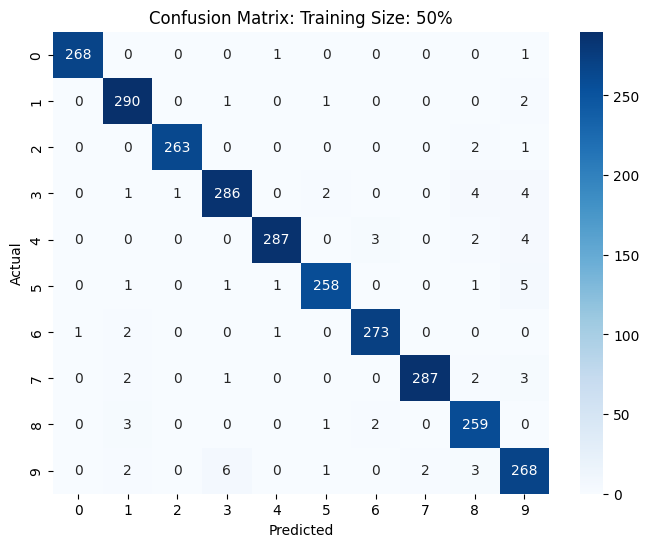

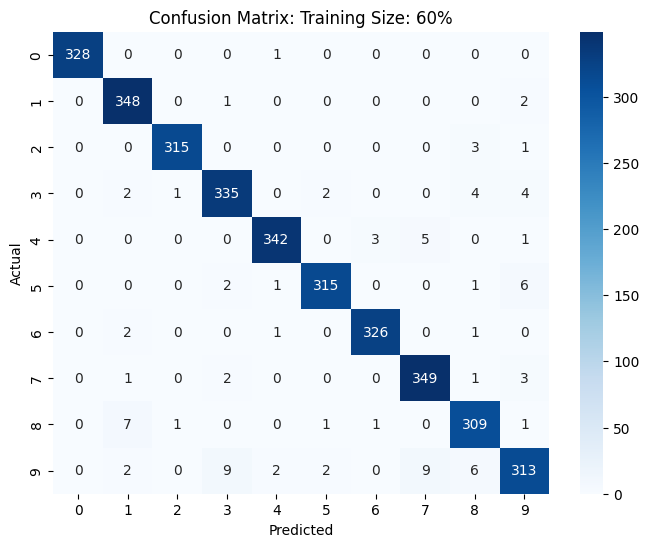

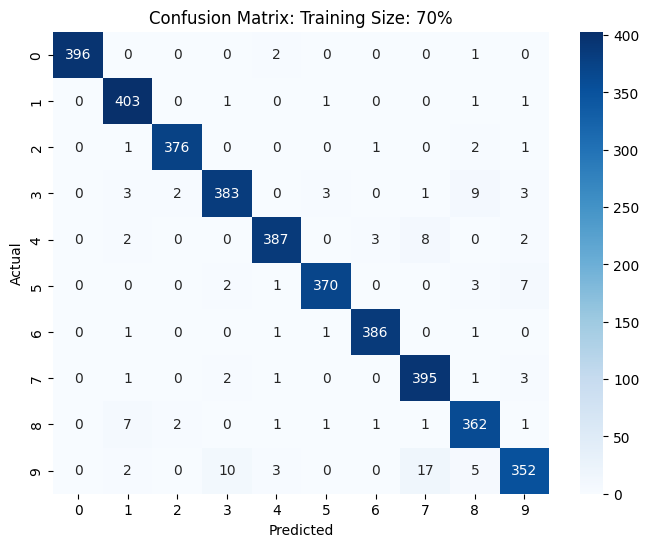

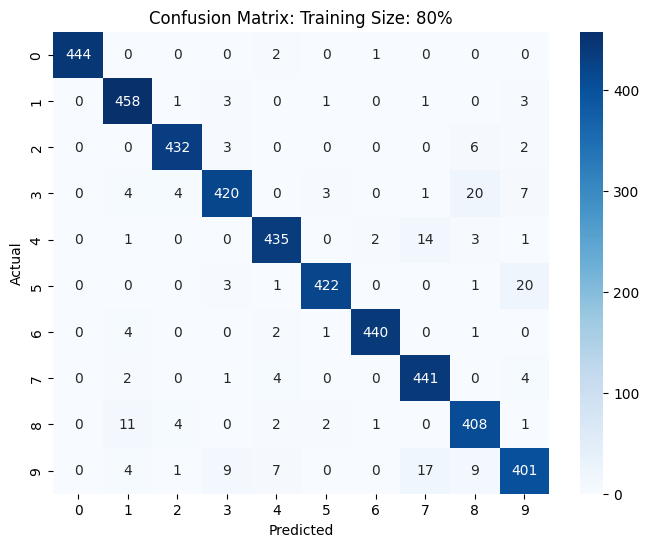

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

for cm_data in confusion_matrices_rf:
    cm = cm_data["Confusion Matrix"]
    training_size = cm_data["Training size"]

    plt.figure(figsize=(8, 6))
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues')
    plt.title(f'Confusion Matrix: Training Size: {training_size}%')
    plt.xlabel('Predicted')
    plt.ylabel('Actual')
    plt.show()

### ROC and AOC curve

/usr/local/lib/python3.12/dist-packages/sklearn/metrics/_ranking.py:1188: UndefinedMetricWarning: No positive samples in y_true, true positive value should be meaningless
  warnings.warn(


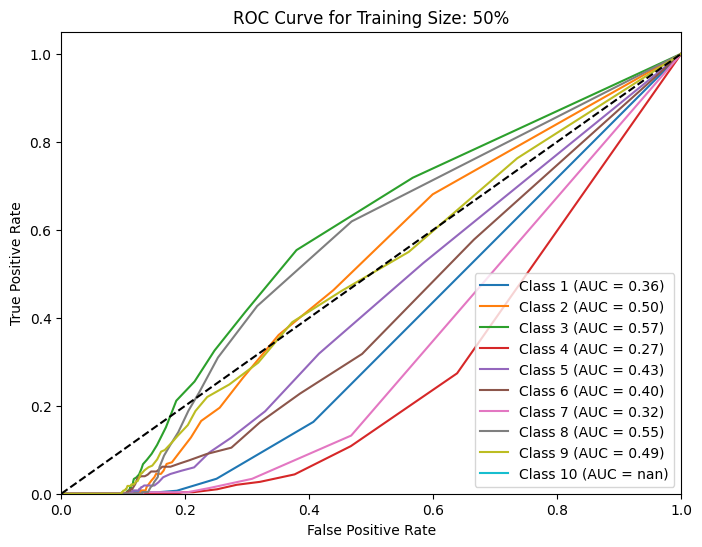

/usr/local/lib/python3.12/dist-packages/sklearn/metrics/_ranking.py:1188: UndefinedMetricWarning: No positive samples in y_true, true positive value should be meaningless
  warnings.warn(


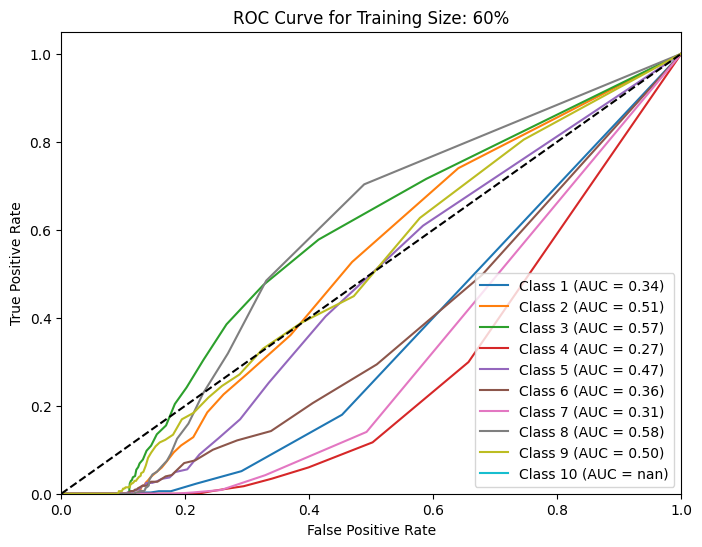

/usr/local/lib/python3.12/dist-packages/sklearn/metrics/_ranking.py:1188: UndefinedMetricWarning: No positive samples in y_true, true positive value should be meaningless
  warnings.warn(


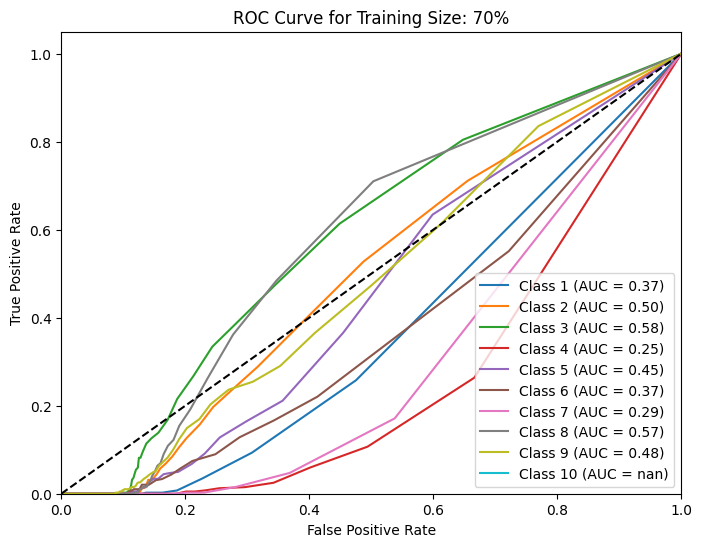

/usr/local/lib/python3.12/dist-packages/sklearn/metrics/_ranking.py:1188: UndefinedMetricWarning: No positive samples in y_true, true positive value should be meaningless
  warnings.warn(


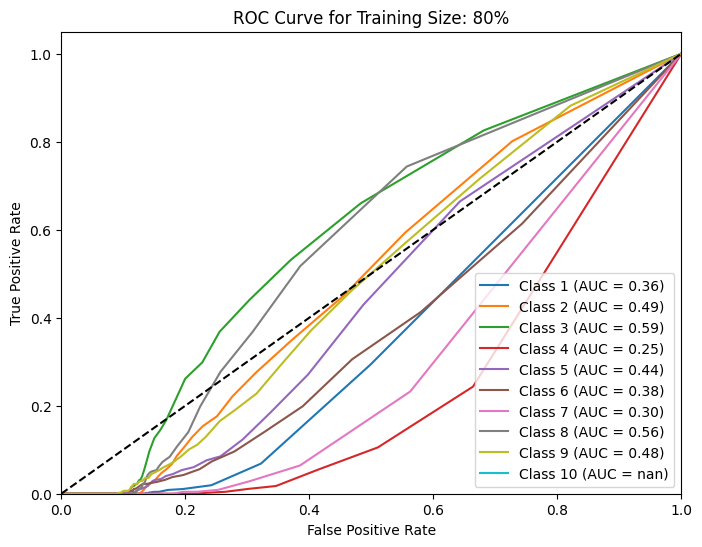

In [ ]:
from sklearn.metrics import roc_curve, auc

# Since this is a multi-class problem, we'll use a One-vs-Rest (OvR) approach for ROC curves
for model_data in trained_models_rf:
    model = model_data["Model"]
    X_test = model_data["X_test"]
    y_test = model_data["y_test"]
    training_size = model_data["Training size"]

    plt.figure(figsize=(8, 6)) # Create a new figure for each plot

    # Get predicted probabilities for each class
    y_prob = model.predict_proba(X_test)

    # Compute ROC curve and AUC for each class using OvR
    fpr = dict()
    tpr = dict()
    roc_auc = dict()
    n_classes = len(np.unique(y_test))

    for i in range(n_classes):
        fpr[i], tpr[i], _ = roc_curve(y_test, y_prob[:, i], pos_label=i+1)
        roc_auc[i] = auc(fpr[i], tpr[i])

    # Plot ROC curve for each class
    for i in range(n_classes):
        plt.plot(fpr[i], tpr[i], label=f'Class {i+1} (AUC = {roc_auc[i]:.2f})')

    plt.plot([0, 1], [0, 1], 'k--') # Plot random chance line
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.05])
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title(f'ROC Curve for Training Size: {training_size}%') # Add title for each plot
    plt.legend(loc="lower right")
    plt.show()

### Random Forest with PCA-Reduced Data

In [ ]:
# Apply the existing PCA transformation to the scaled data
X_pca_reduced_rf = pca.fit_transform(X_scaled)

print(f"\nOriginal number of features: {X.shape[1]}")
print(f"Reduced number of features after PCA: {X_pca_reduced_rf.shape[1]}")
print("\nData after PCA for Random Forest:")
display(pd.DataFrame(X_pca_reduced_rf).head())


Original number of features: 64
Reduced number of features after PCA: 50

Data after PCA for Random Forest:


,0,1,2,3,4,5,6,7,8,9,...,40,41,42,43,44,45,46,47,48,49
0,-0.296633,-1.446450,-3.863044,-3.223597,0.773631,0.631849,0.163733,0.474708,-1.085103,-0.027994,...,0.517559,0.494320,0.042024,-0.919845,-0.181330,-0.604761,0.116663,-0.247460,0.112606,-0.090206
1,-0.156717,-3.065688,-5.811656,-3.232099,1.064670,0.031353,0.270302,2.091832,-1.487364,-0.998295,...,0.754699,-0.204192,-0.292517,-0.300754,-0.441550,-0.082849,0.587194,0.018828,0.014534,0.211886
2,-0.753929,3.261949,0.779656,-1.108976,0.311024,-0.814548,-4.307315,0.841364,-1.166513,-0.126725,...,-0.572788,-0.060109,0.004906,0.315338,0.331871,0.927054,-0.313190,-0.748029,-0.148217,-0.039561
3,-4.226579,1.900320,-0.441486,1.329548,-0.149220,2.710149,2.128209,0.206327,-1.659819,0.573584,...,0.943616,-0.845965,-0.179062,0.466753,0.564706,0.060870,0.027984,0.323670,-0.110900,-1.064628
4,0.582983,-3.490539,-1.602212,-1.052587,-1.360737,0.406474,-0.662578,-2.572619,0.341349,0.066232,...,0.094542,0.086006,0.098118,0.760049,-0.532223,0.368102,0.162075,0.593148,-0.220887,-0.314977


### Calculate Random Forest performance with PCA-Reduced Data for different test sizes

In [ ]:
results_rf_pca = []
confusion_matrices_rf_pca = []


for size in training_sizes:
  X_train_pca_rf, X_test_pca_rf, y_train, y_test = train_test_split(X_pca_reduced_rf, y, test_size=size, random_state=42)
  rf_pca = RandomForestClassifier(random_state=42)

  rf_pca.fit(X_train_pca_rf, y_train.values.ravel())
  y_pred_pca_rf = rf_pca.predict(X_test_pca_rf)

  acc_pca_rf = accuracy_score(y_test, y_pred_pca_rf)
  precision_pca_rf = precision_score(y_test, y_pred_pca_rf, average='weighted', zero_division=0)
  recall_pca_rf = recall_score(y_test, y_pred_pca_rf, average='weighted')
  f1_pca_rf = f1_score(y_test, y_pred_pca_rf, average='weighted')

  cm_pca_rf = confusion_matrix(y_test, y_pred_pca_rf)

  results_rf_pca.append({
      "Training size":int (size*100),
      "Accuracy":acc_pca_rf,
      "Precision": precision_pca_rf,
      "Recall": recall_pca_rf,
      "F1-score": f1_pca_rf
  })

  confusion_matrices_rf_pca.append({
      "Training size":int (size*100),
      "Confusion Matrix":cm_pca_rf
  })



### Print Random Forest Performance Table and Graphs with PCA-Reduced Data

,Training size,Accuracy,Precision,Recall,F1-score
0,50,0.956584,0.956721,0.956584,0.956593
1,60,0.953440,0.953564,0.953440,0.953439
2,70,0.949670,0.949986,0.949670,0.949693
3,80,0.940169,0.940719,0.940169,0.940303


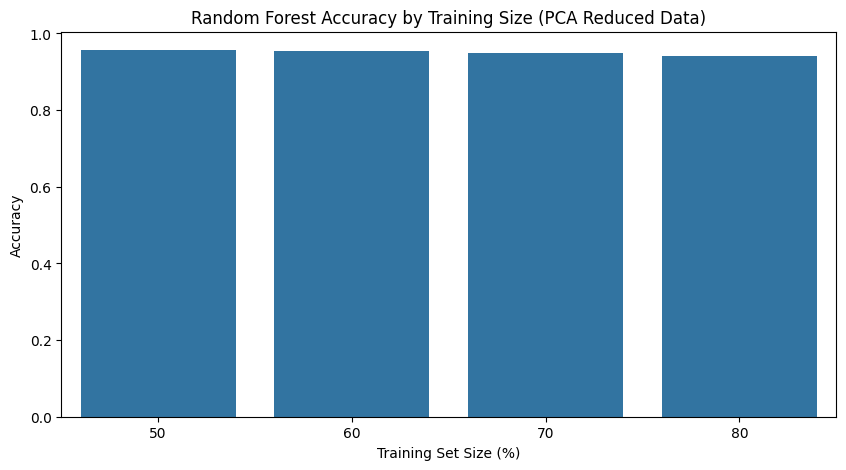

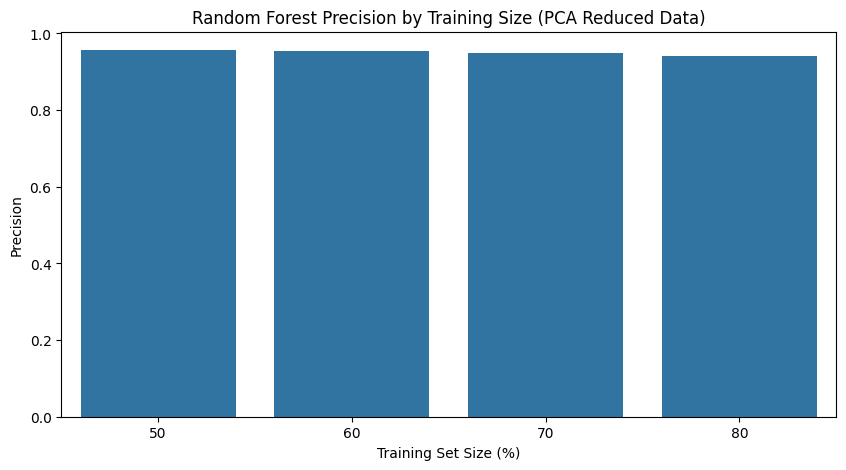

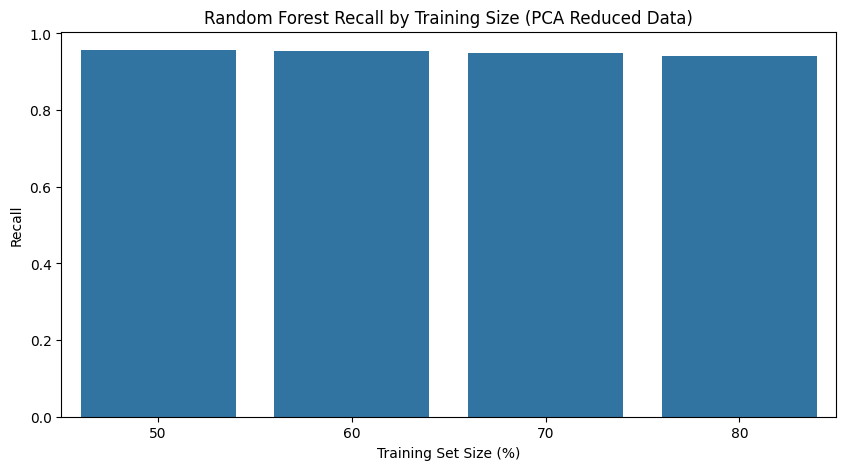

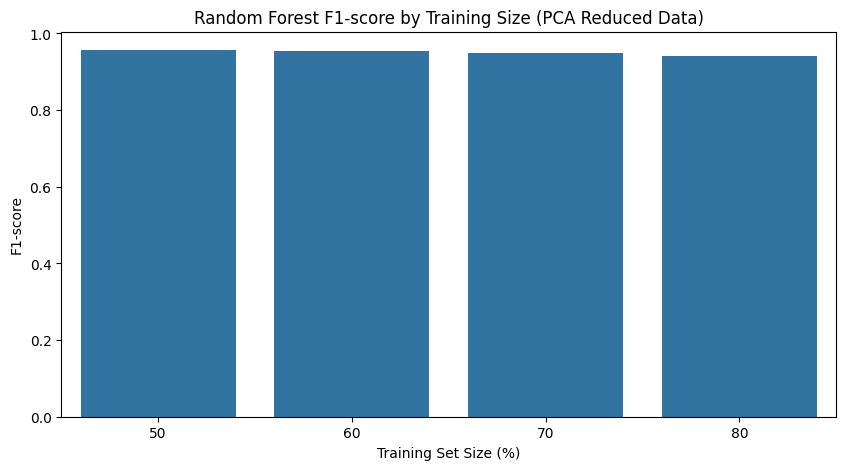

In [ ]:
df_rf_pca = pd.DataFrame(results_rf_pca)
display(df_rf_pca)

# Plot Accuracy
plt.figure(figsize=(10, 5))
sns.barplot(data=df_rf_pca, x='Training size', y='Accuracy')
plt.title('Random Forest Accuracy by Training Size (PCA Reduced Data)')
plt.xlabel('Training Set Size (%)')
plt.ylabel('Accuracy')
plt.show()

# Plot Precision
plt.figure(figsize=(10, 5))
sns.barplot(data=df_rf_pca, x='Training size', y='Precision')
plt.title('Random Forest Precision by Training Size (PCA Reduced Data)')
plt.xlabel('Training Set Size (%)')
plt.ylabel('Precision')
plt.show()

# Plot Recall
plt.figure(figsize=(10, 5))
sns.barplot(data=df_rf_pca, x='Training size', y='Recall')
plt.title('Random Forest Recall by Training Size (PCA Reduced Data)')
plt.xlabel('Training Set Size (%)')
plt.ylabel('Recall')
plt.show()

# Plot F1-score
plt.figure(figsize=(10, 5))
sns.barplot(data=df_rf_pca, x='Training size', y='F1-score')
plt.title('Random Forest F1-score by Training Size (PCA Reduced Data)')
plt.xlabel('Training Set Size (%)')
plt.ylabel('F1-score')
plt.show()



### Show Confusion Matrices for Random Forest with PCA-Reduced Data

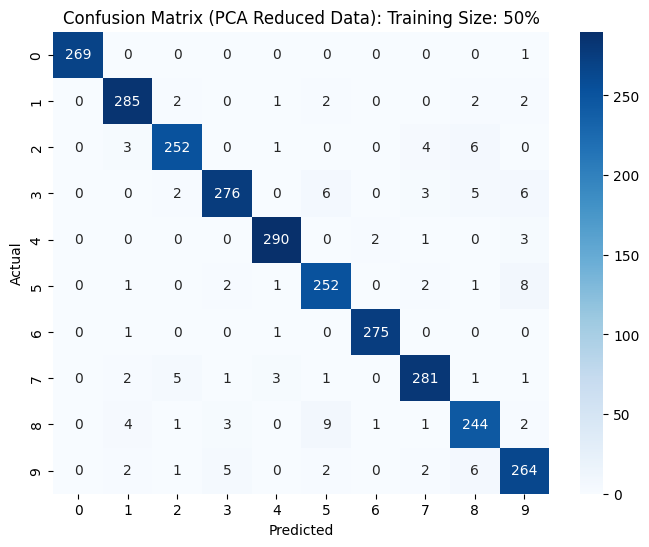

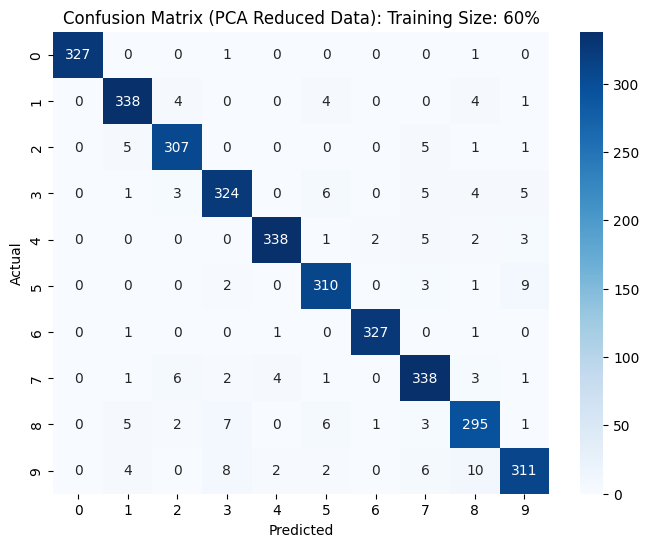

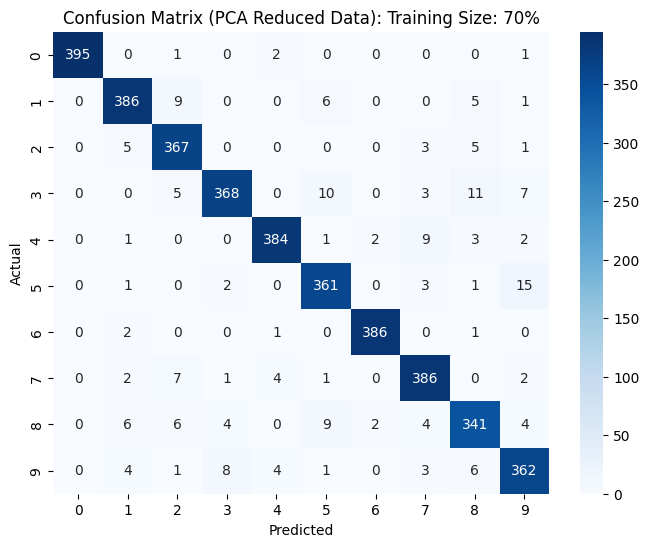

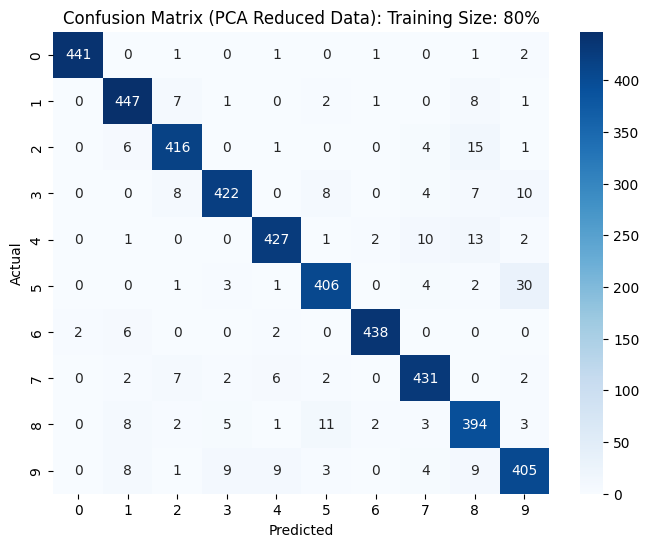

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

for cm_data in confusion_matrices_rf_pca:
    cm = cm_data["Confusion Matrix"]
    training_size = cm_data["Training size"]

    plt.figure(figsize=(8, 6))
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues')
    plt.title(f'Confusion Matrix (PCA Reduced Data): Training Size: {training_size}%')
    plt.xlabel('Predicted')
    plt.ylabel('Actual')
    plt.show()